In [1]:
from comet_ml import Experiment

import os

CUDA_NUM = 1
os.environ["CUDA_VISIBLE_DEVICES"]=str(CUDA_NUM)



In [2]:
import torch
from torch import nn
import torch.nn.functional as F

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm as tqdm_notebook
from tqdm import tqdm as tqdm
import itertools

import seaborn as sns
from IPython.display import clear_output

%matplotlib inline


In [3]:
MODEL_NAME = "boosting_play"

BATCH_SIZE = int(64)

device = 'cuda' if torch.cuda.is_available() else 'cpu'

NUM_LAYERS = 5

In [4]:
import logging

os.makedirs('log', exist_ok=True)
logging.basicConfig(filename=f'log/{MODEL_NAME}.log',
                    filemode='w',
                    format='%(asctime)s, %(funcName)s - %(levelname)s - %(message)s',
                    datefmt='%d-%b %H:%M:%S',
                    level=logging.DEBUG)
logger = logging.getLogger('main')
logging.info(f"Logging started. " +
             f"MODEL_NAME:{MODEL_NAME}, BATCH_SIZE:{BATCH_SIZE}, NUM_LAYERS:{NUM_LAYERS} " +
             f"device:{device}, CUDA_NUM:{CUDA_NUM}")


## Data

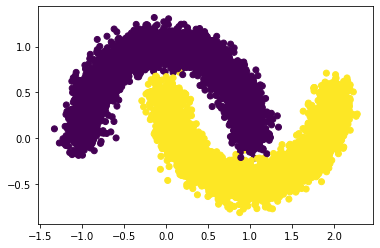

In [5]:
from sklearn.datasets import make_moons, make_blobs

moons_x, moons_y = make_moons(10000, shuffle=True, noise=0.1)
# moons_x, moons_y = make_blobs(10000, shuffle=True, centers=2)
plt.scatter(moons_x[:, 0], moons_x[:, 1], c=moons_y)
plt.show()

In [6]:
moon_dataloader = torch.utils.data.DataLoader(
    torch.utils.data.TensorDataset(torch.Tensor(moons_x)),
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True
)

get_dataloader = lambda x: torch.utils.data.DataLoader(
    torch.utils.data.TensorDataset(data),
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True
)



In [7]:
from torch import distributions
from torch.distributions import MultivariateNormal, Uniform, TransformedDistribution, SigmoidTransform
from torch.nn.parameter import Parameter

from nflib.flows import (
    AffineConstantFlow, ActNorm, AffineHalfFlow, MAF, IAF, Invertible1x1Conv,
    NormalizingFlow, NormalizingFlowModel, RandomPerm
)
from nflib.spline_flows import NSF_AR, NSF_CL
from nflib.nets import ARMLP, ResidualNet, MLP


## Model

In [8]:
dim = 2

prior = MultivariateNormal(torch.zeros(dim).to(device), torch.eye(dim).to(device))

flows = []
for i in range(NUM_LAYERS):
#     flows.append(AffineHalfFlow(2, True))
    flows.append(MAF(2, False)) # True not working
    flows.append(Invertible1x1Conv(dim))
    flows.append(ActNorm(dim=dim))
model = NormalizingFlowModel(prior, flows).to(device)
        
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4) # todo tune WD
print("number of params: ", sum(p.numel() for p in model.parameters()))        


number of params:  6950


In [9]:
dataloader = moon_dataloader

x = next(iter(dataloader))[0].to(device)
zs, prior_logprob, log_det = model(x)

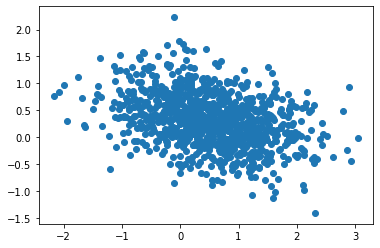

In [10]:
x = next(iter(dataloader))[0].to(device)
samples = model.sample(1000)[-1].cpu().detach()
plt.scatter(samples[:, 0], samples[:, 1])
plt.show()

## Train

In [11]:
experiment = Experiment(api_key="HIZapbzNjFips0c32Co7gXkQZ",
                        project_name="rich2019", workspace="maximartemev", disabled=False)
logger.info(f"Experiment is live on comet.ml, {experiment.focus_link + experiment.id}")

COMET INFO: old comet version (3.0.2) detected. current: 3.1.0 please update your comet lib with command: `pip install --no-cache-dir --upgrade comet_ml`
COMET WARNING: Failing to collect the installed os packages
COMET INFO: Experiment is live on comet.ml https://www.comet.ml/maximartemev/rich2019/73f9a799992d4daeb29c2d5c9eb71331



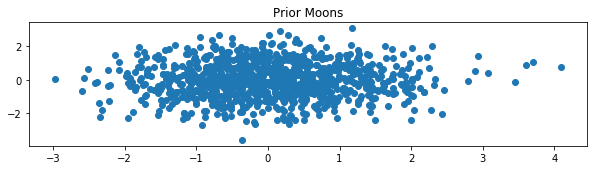

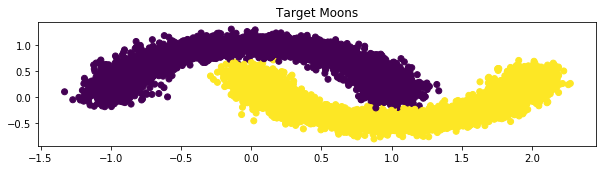

  0%|          | 0/1000 [00:00<?, ?it/s]

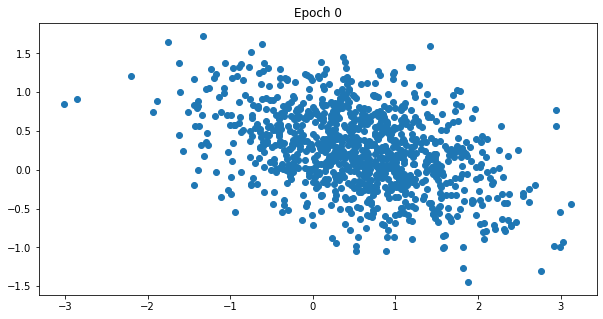

  0%|          | 1/1000 [00:04<1:16:40,  4.61s/it]

  0%|          | 2/1000 [00:08<1:14:06,  4.46s/it]

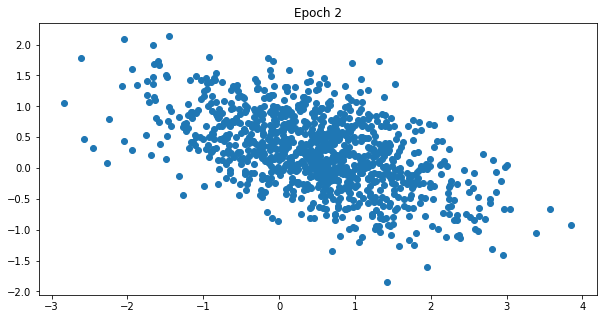

  0%|          | 3/1000 [00:13<1:15:16,  4.53s/it]

  0%|          | 4/1000 [00:17<1:13:08,  4.41s/it]

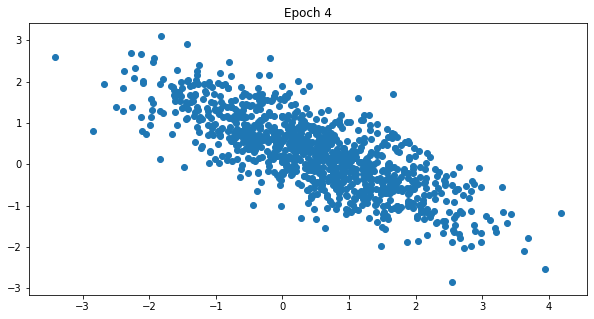

  0%|          | 5/1000 [00:22<1:14:15,  4.48s/it]

  1%|          | 6/1000 [00:26<1:12:48,  4.39s/it]

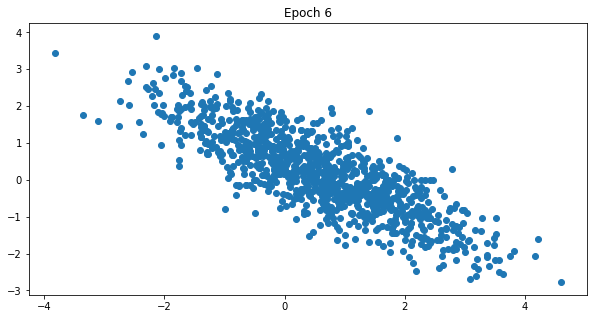

  1%|          | 7/1000 [00:31<1:13:52,  4.46s/it]

  1%|          | 8/1000 [00:35<1:12:37,  4.39s/it]

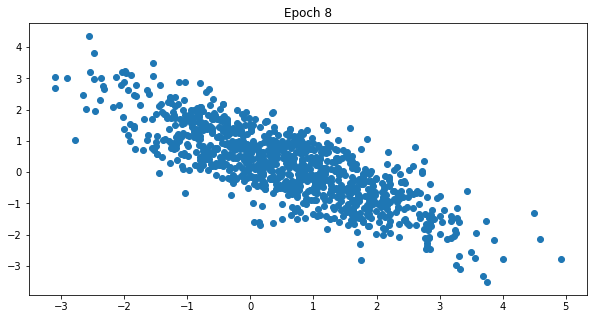

  1%|          | 9/1000 [00:39<1:13:30,  4.45s/it]

  1%|          | 10/1000 [00:44<1:12:09,  4.37s/it]

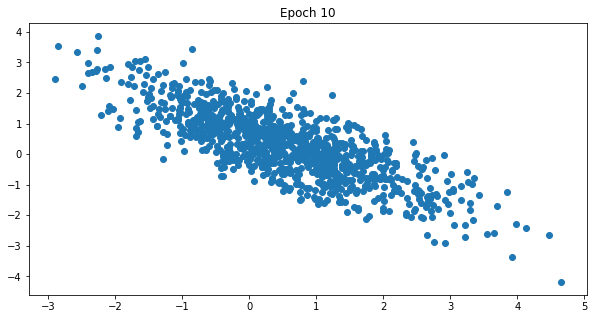

  1%|          | 11/1000 [00:48<1:13:40,  4.47s/it]

  1%|          | 12/1000 [00:53<1:12:46,  4.42s/it]

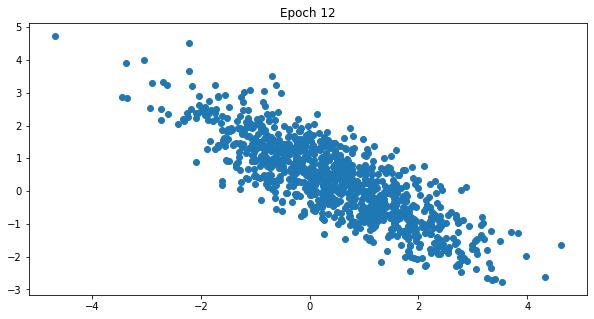

  1%|▏         | 13/1000 [00:57<1:13:49,  4.49s/it]

  1%|▏         | 14/1000 [01:01<1:12:24,  4.41s/it]

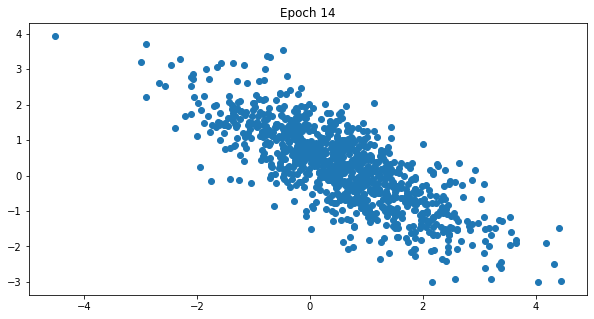

  2%|▏         | 15/1000 [01:06<1:13:01,  4.45s/it]

  2%|▏         | 16/1000 [01:10<1:11:19,  4.35s/it]

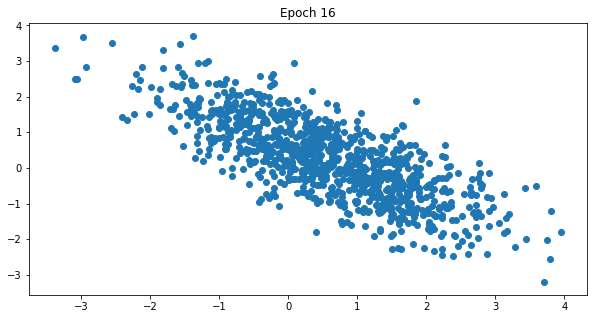

  2%|▏         | 17/1000 [01:15<1:12:48,  4.44s/it]

  2%|▏         | 18/1000 [01:19<1:12:09,  4.41s/it]

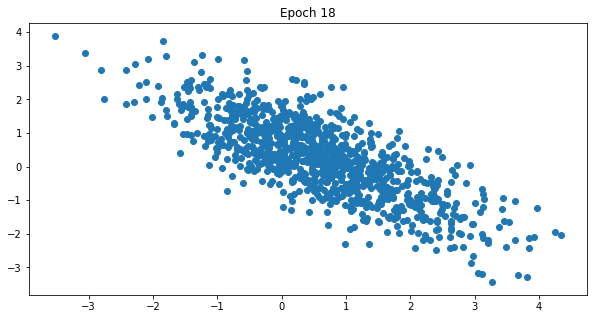

  2%|▏         | 19/1000 [01:24<1:15:48,  4.64s/it]

  2%|▏         | 20/1000 [01:28<1:14:02,  4.53s/it]

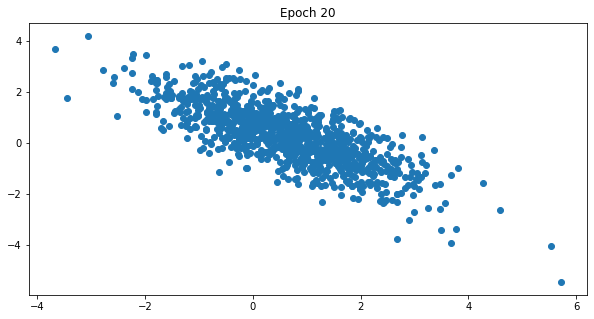

  2%|▏         | 21/1000 [01:33<1:15:11,  4.61s/it]

  2%|▏         | 22/1000 [01:37<1:13:08,  4.49s/it]

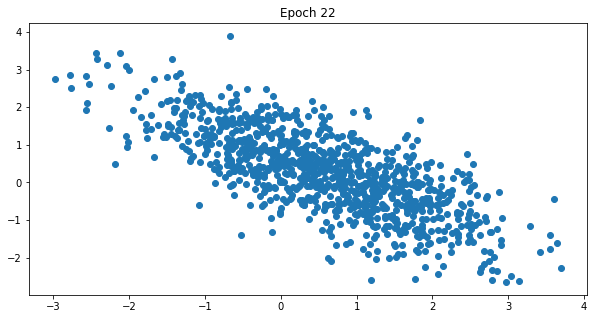

  2%|▏         | 23/1000 [01:42<1:13:34,  4.52s/it]

  2%|▏         | 24/1000 [01:46<1:12:24,  4.45s/it]

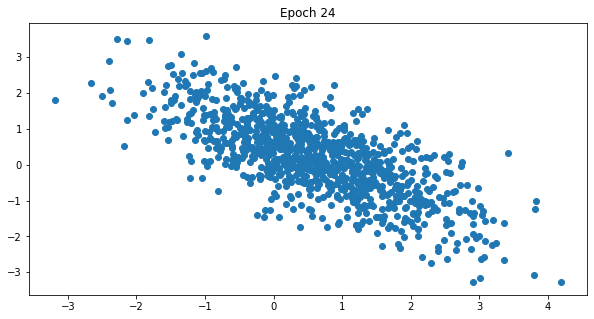

  2%|▎         | 25/1000 [01:51<1:12:58,  4.49s/it]

  3%|▎         | 26/1000 [01:55<1:11:47,  4.42s/it]

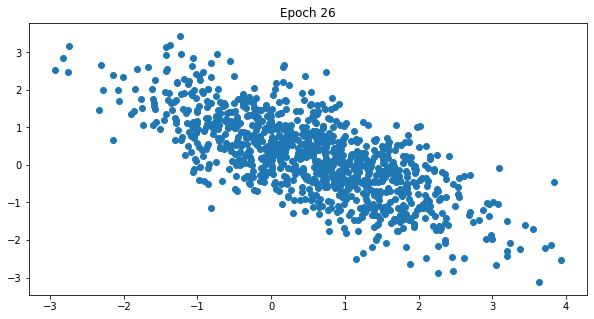

  3%|▎         | 27/1000 [02:00<1:12:39,  4.48s/it]

  3%|▎         | 28/1000 [02:04<1:11:11,  4.39s/it]

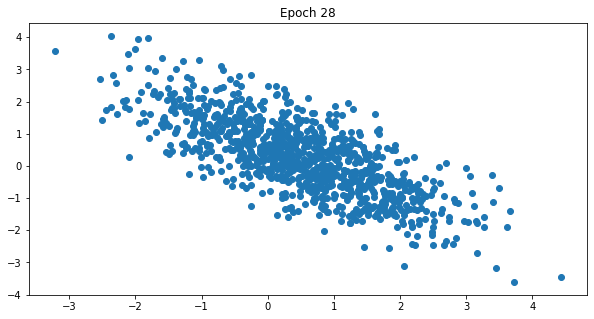

  3%|▎         | 29/1000 [02:09<1:12:13,  4.46s/it]

  3%|▎         | 30/1000 [02:13<1:11:02,  4.39s/it]

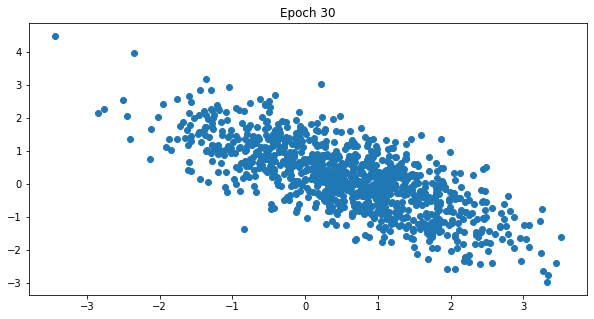

  3%|▎         | 31/1000 [02:18<1:12:07,  4.47s/it]

  3%|▎         | 32/1000 [02:22<1:10:35,  4.38s/it]

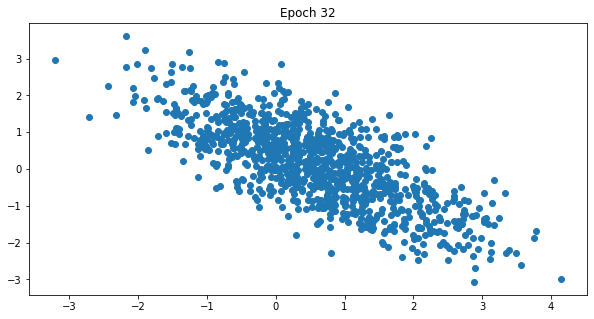

  3%|▎         | 33/1000 [02:26<1:11:52,  4.46s/it]

  3%|▎         | 34/1000 [02:31<1:10:58,  4.41s/it]

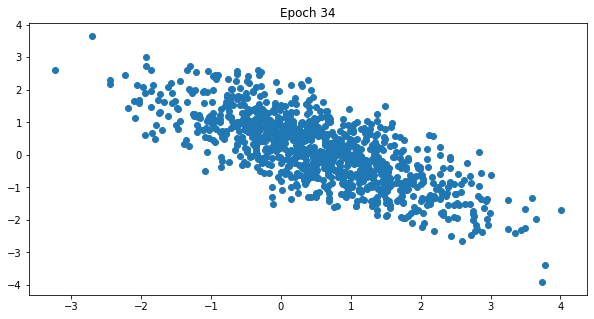

  4%|▎         | 35/1000 [02:35<1:12:09,  4.49s/it]

  4%|▎         | 36/1000 [02:39<1:10:44,  4.40s/it]

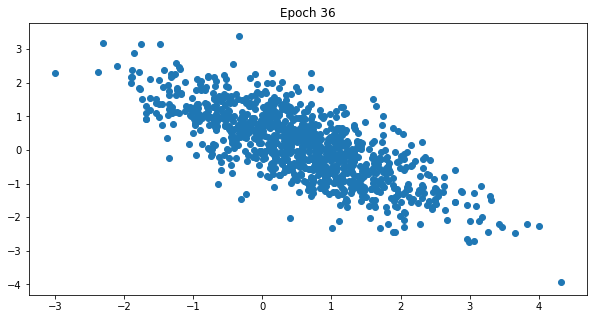

  4%|▎         | 37/1000 [02:44<1:11:54,  4.48s/it]

  4%|▍         | 38/1000 [02:48<1:11:09,  4.44s/it]

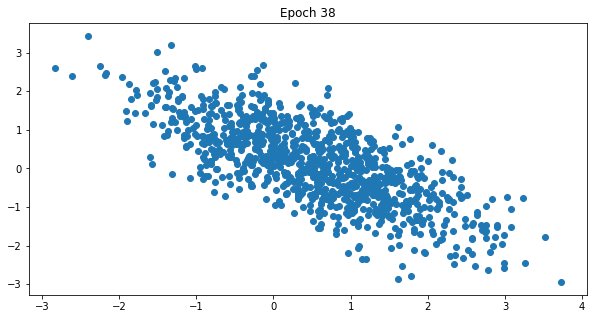

  4%|▍         | 39/1000 [02:53<1:12:29,  4.53s/it]

  4%|▍         | 40/1000 [02:57<1:10:47,  4.42s/it]

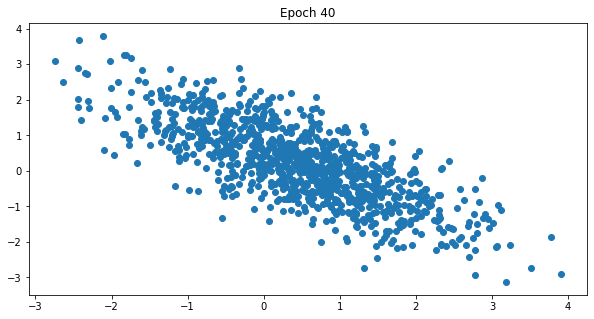

  4%|▍         | 41/1000 [03:03<1:13:57,  4.63s/it]

  4%|▍         | 42/1000 [03:07<1:11:36,  4.49s/it]

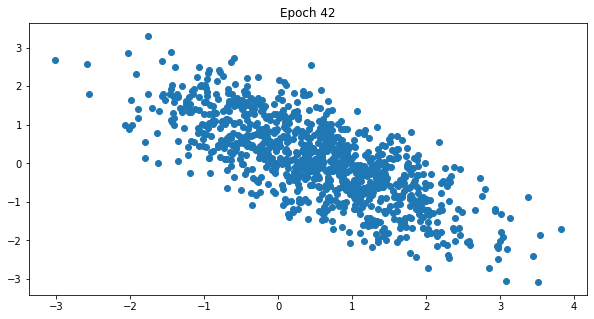

  4%|▍         | 43/1000 [03:11<1:12:04,  4.52s/it]

  4%|▍         | 44/1000 [03:16<1:10:52,  4.45s/it]

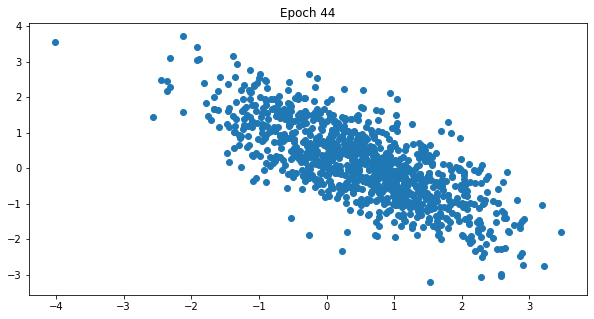

  4%|▍         | 45/1000 [03:20<1:11:25,  4.49s/it]

  5%|▍         | 46/1000 [03:24<1:10:31,  4.44s/it]

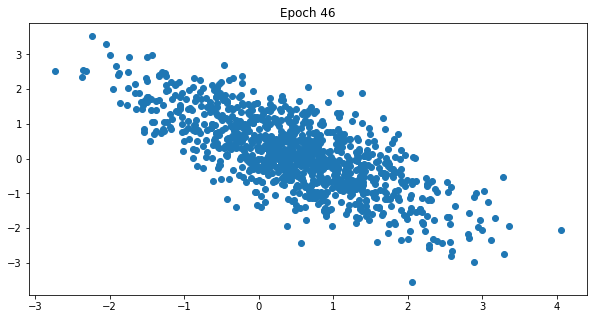

  5%|▍         | 47/1000 [03:29<1:11:01,  4.47s/it]

  5%|▍         | 48/1000 [03:33<1:10:15,  4.43s/it]

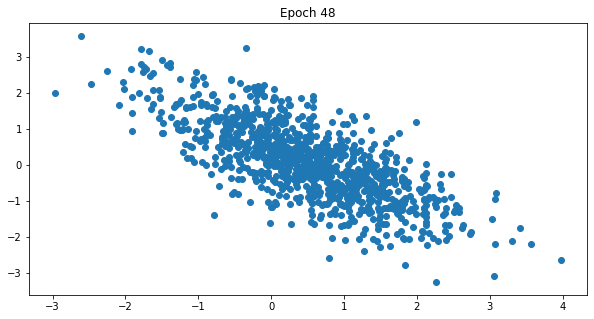

  5%|▍         | 49/1000 [03:38<1:10:57,  4.48s/it]

  5%|▌         | 50/1000 [03:42<1:09:46,  4.41s/it]

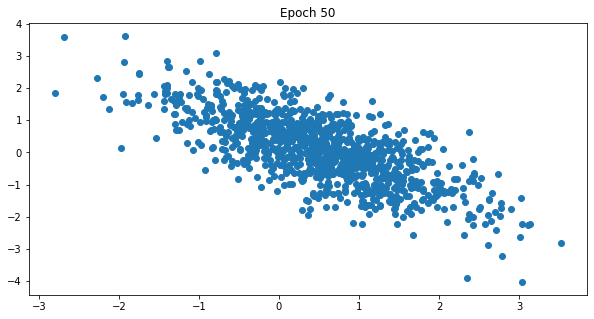

  5%|▌         | 51/1000 [03:47<1:11:02,  4.49s/it]

  5%|▌         | 52/1000 [03:51<1:09:25,  4.39s/it]

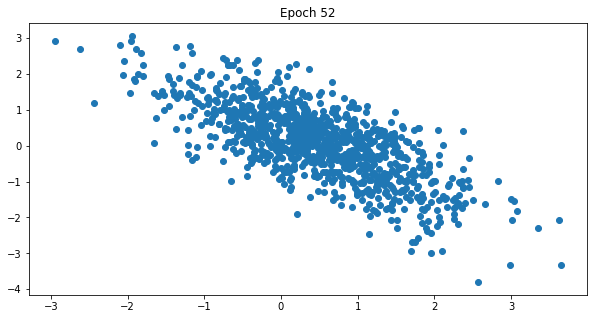

  5%|▌         | 53/1000 [03:56<1:10:28,  4.47s/it]

  5%|▌         | 54/1000 [04:00<1:09:28,  4.41s/it]

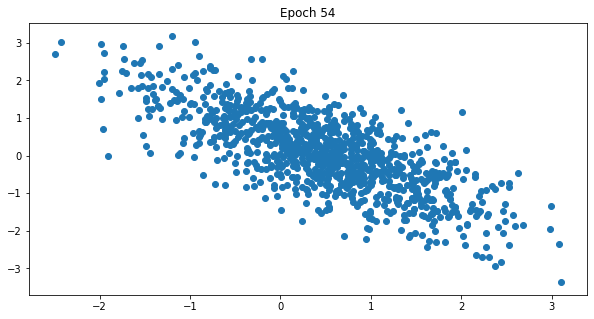

  6%|▌         | 55/1000 [04:04<1:09:57,  4.44s/it]

  6%|▌         | 56/1000 [04:09<1:08:50,  4.38s/it]

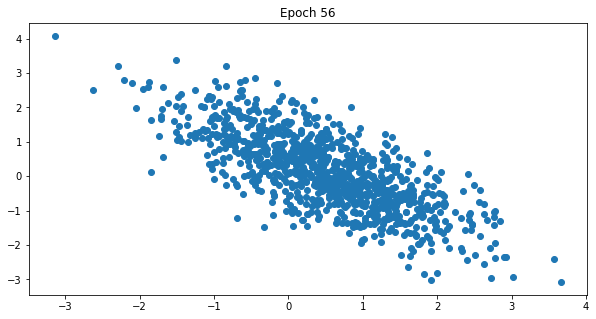

  6%|▌         | 57/1000 [04:13<1:09:30,  4.42s/it]

  6%|▌         | 58/1000 [04:18<1:08:54,  4.39s/it]

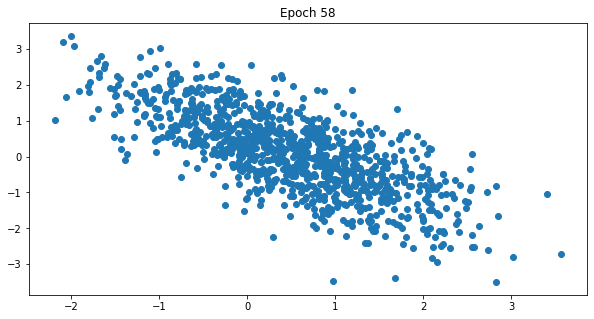

  6%|▌         | 59/1000 [04:22<1:09:57,  4.46s/it]

  6%|▌         | 60/1000 [04:26<1:08:51,  4.40s/it]

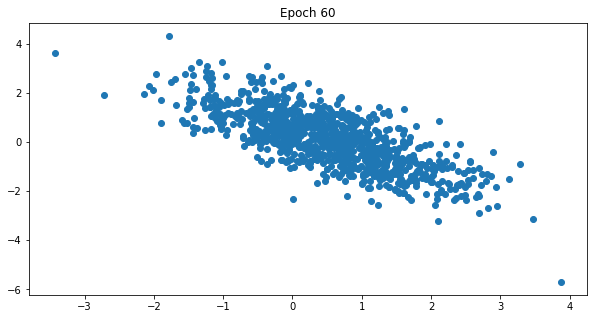

  6%|▌         | 61/1000 [04:31<1:09:25,  4.44s/it]

  6%|▌         | 62/1000 [04:35<1:08:40,  4.39s/it]

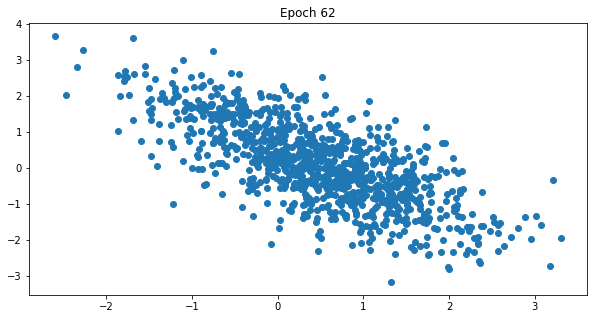

  6%|▋         | 63/1000 [04:40<1:09:38,  4.46s/it]

  6%|▋         | 64/1000 [04:44<1:08:22,  4.38s/it]

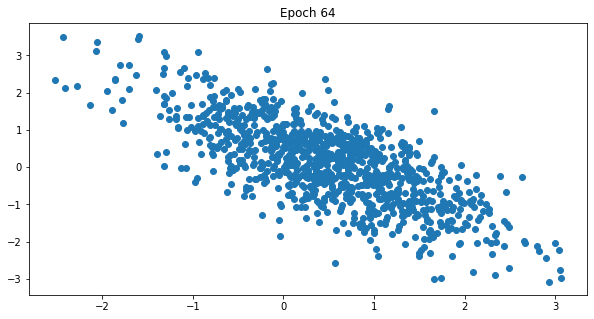

  6%|▋         | 65/1000 [04:49<1:09:25,  4.46s/it]

  7%|▋         | 66/1000 [04:53<1:08:31,  4.40s/it]

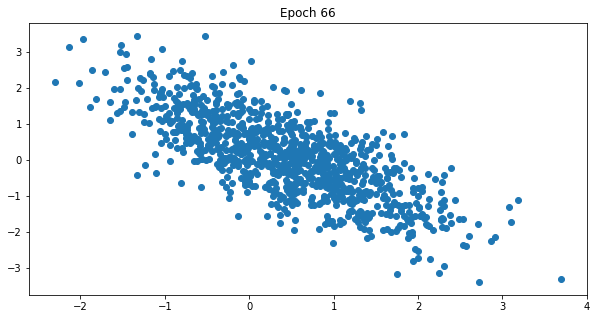

  7%|▋         | 67/1000 [04:58<1:11:46,  4.62s/it]

  7%|▋         | 68/1000 [05:02<1:10:23,  4.53s/it]

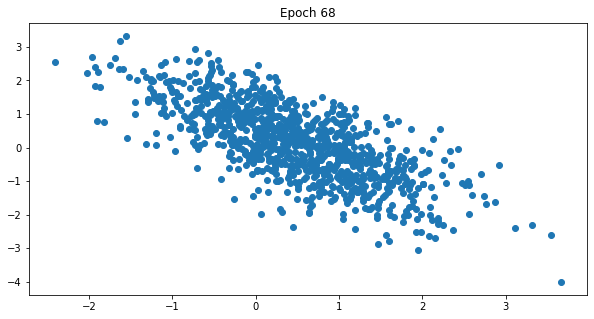

  7%|▋         | 69/1000 [05:07<1:11:00,  4.58s/it]

  7%|▋         | 70/1000 [05:11<1:09:19,  4.47s/it]

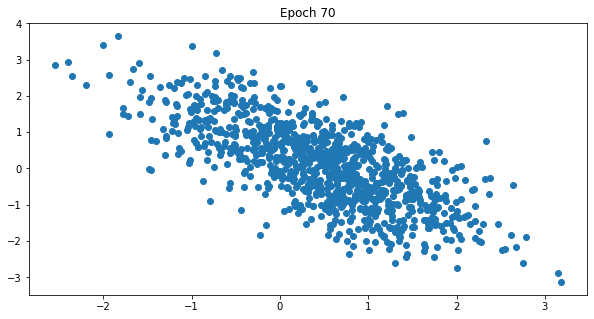

  7%|▋         | 71/1000 [05:16<1:09:35,  4.49s/it]

  7%|▋         | 72/1000 [05:20<1:08:05,  4.40s/it]

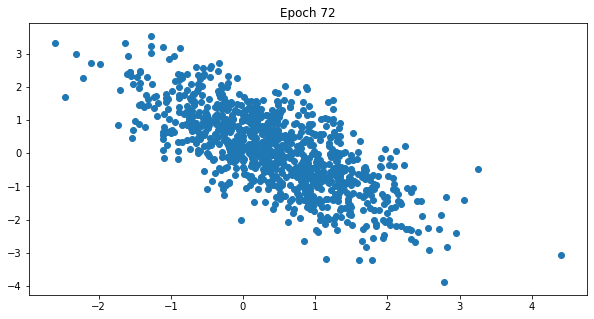

  7%|▋         | 73/1000 [05:25<1:08:51,  4.46s/it]

  7%|▋         | 74/1000 [05:29<1:07:59,  4.41s/it]

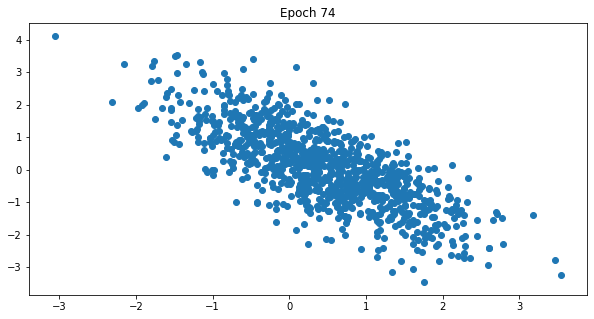

  8%|▊         | 75/1000 [05:34<1:11:32,  4.64s/it]

  8%|▊         | 76/1000 [05:38<1:09:37,  4.52s/it]

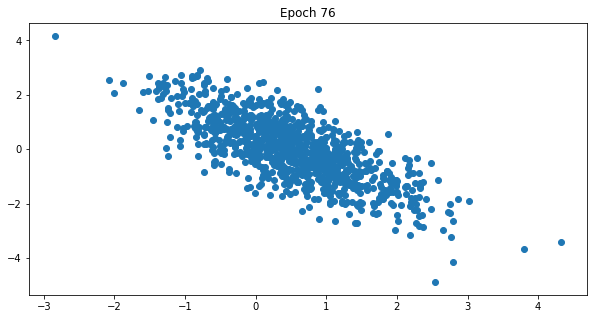

  8%|▊         | 77/1000 [05:43<1:09:54,  4.54s/it]

  8%|▊         | 78/1000 [05:47<1:08:23,  4.45s/it]

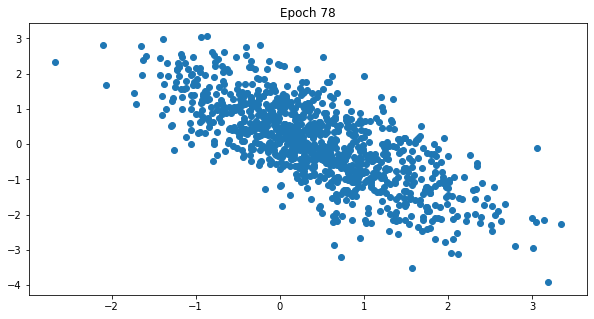

  8%|▊         | 79/1000 [05:52<1:09:22,  4.52s/it]

  8%|▊         | 80/1000 [05:56<1:08:09,  4.45s/it]

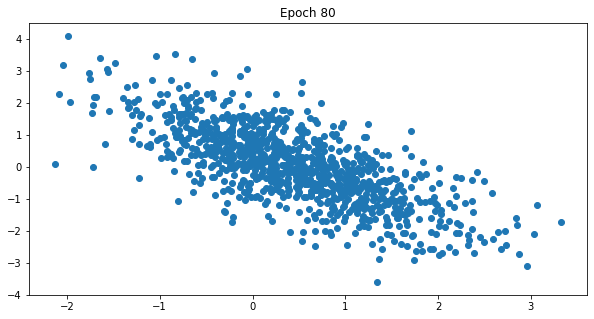

  8%|▊         | 81/1000 [06:01<1:08:38,  4.48s/it]

  8%|▊         | 82/1000 [06:05<1:07:23,  4.40s/it]

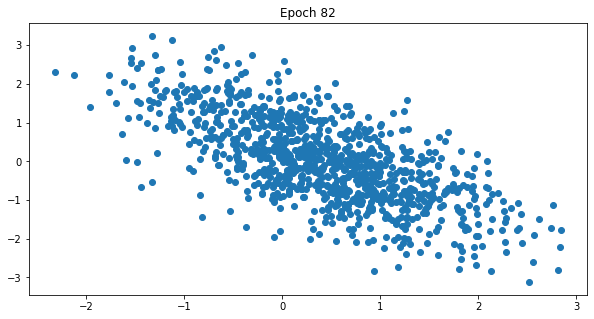

  8%|▊         | 83/1000 [06:09<1:07:45,  4.43s/it]

  8%|▊         | 84/1000 [06:14<1:06:50,  4.38s/it]

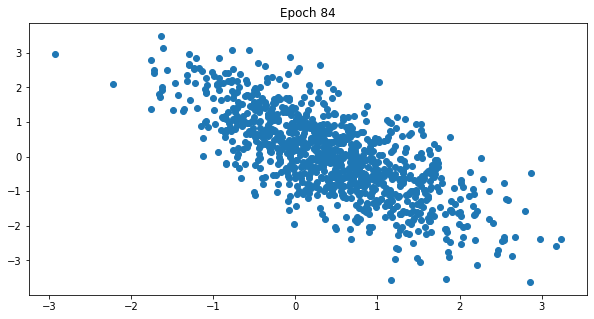

  8%|▊         | 85/1000 [06:18<1:08:12,  4.47s/it]

  9%|▊         | 86/1000 [06:23<1:07:12,  4.41s/it]

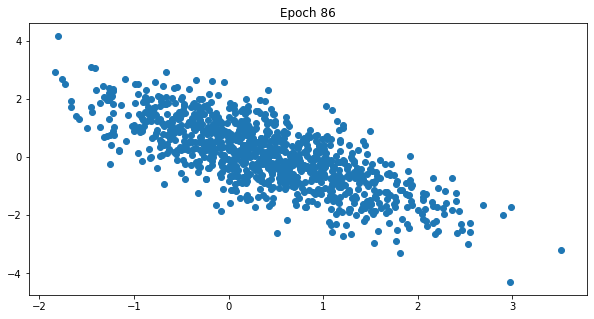

  9%|▊         | 87/1000 [06:27<1:08:08,  4.48s/it]

  9%|▉         | 88/1000 [06:31<1:06:42,  4.39s/it]

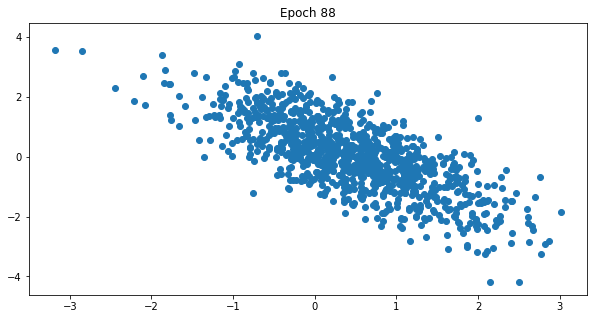

  9%|▉         | 89/1000 [06:36<1:07:47,  4.46s/it]

  9%|▉         | 90/1000 [06:40<1:06:34,  4.39s/it]

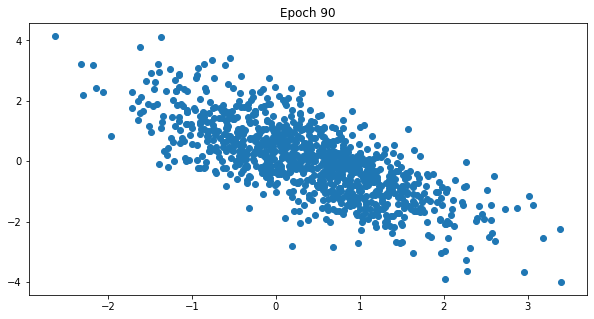

  9%|▉         | 91/1000 [06:45<1:07:13,  4.44s/it]

  9%|▉         | 92/1000 [06:49<1:05:54,  4.35s/it]

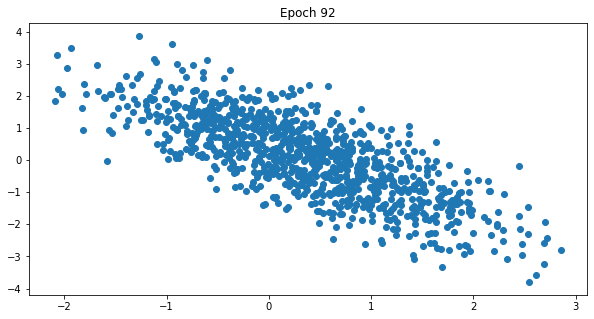

  9%|▉         | 93/1000 [06:54<1:06:40,  4.41s/it]

  9%|▉         | 94/1000 [06:58<1:05:33,  4.34s/it]

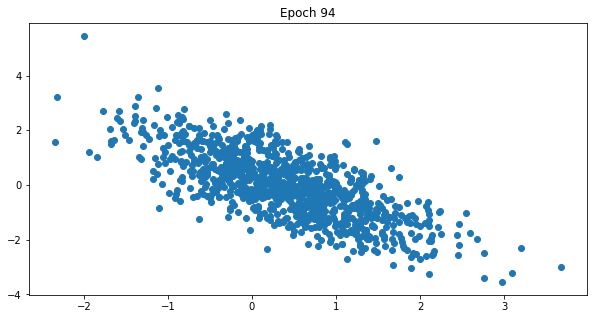

 10%|▉         | 95/1000 [07:02<1:06:41,  4.42s/it]

 10%|▉         | 96/1000 [07:06<1:05:32,  4.35s/it]

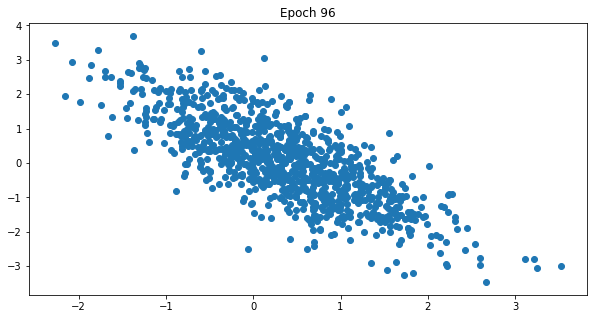

 10%|▉         | 97/1000 [07:11<1:06:46,  4.44s/it]

 10%|▉         | 98/1000 [07:15<1:05:43,  4.37s/it]

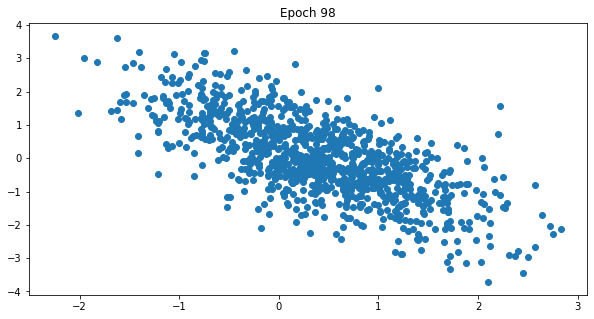

 10%|▉         | 99/1000 [07:20<1:07:26,  4.49s/it]

 10%|█         | 100/1000 [07:24<1:06:20,  4.42s/it]

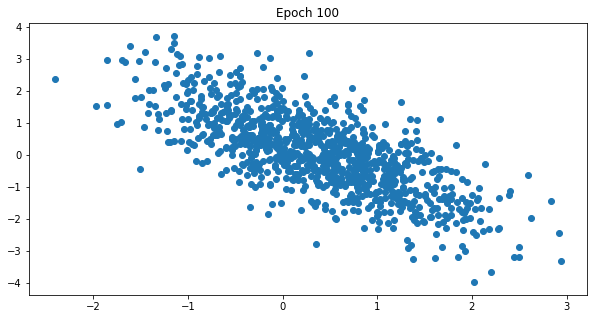

 10%|█         | 101/1000 [07:29<1:06:52,  4.46s/it]

 10%|█         | 102/1000 [07:33<1:05:57,  4.41s/it]

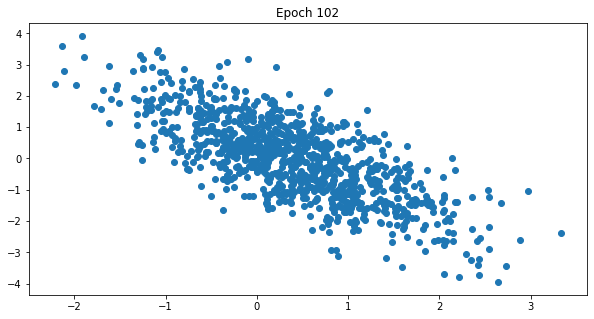

 10%|█         | 103/1000 [07:38<1:09:08,  4.63s/it]

 10%|█         | 104/1000 [07:43<1:07:08,  4.50s/it]

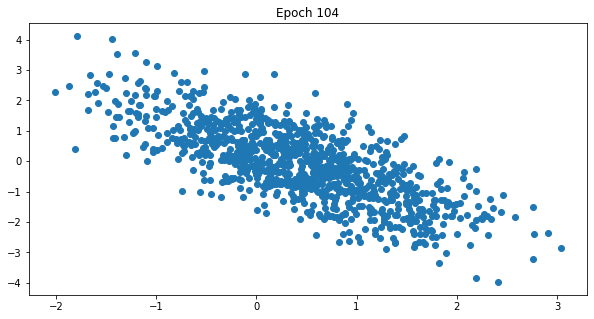

 10%|█         | 105/1000 [07:47<1:07:36,  4.53s/it]

 11%|█         | 106/1000 [07:51<1:06:24,  4.46s/it]

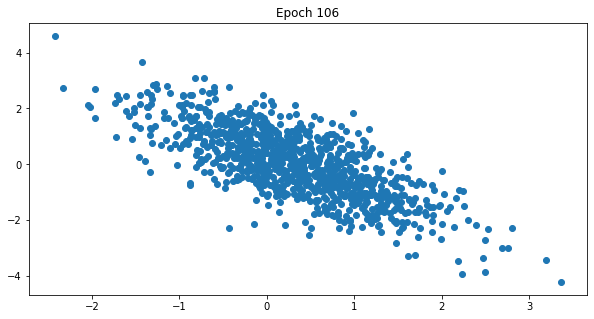

 11%|█         | 107/1000 [07:56<1:07:02,  4.50s/it]

 11%|█         | 108/1000 [08:00<1:05:43,  4.42s/it]

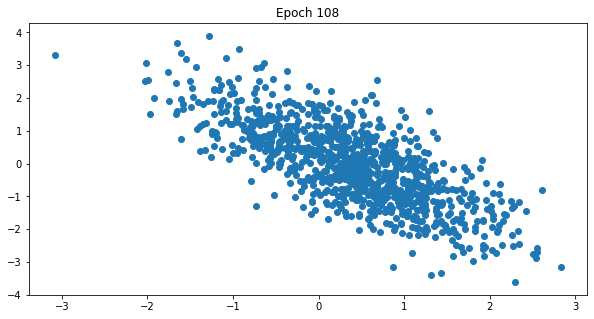

 11%|█         | 109/1000 [08:05<1:06:14,  4.46s/it]

 11%|█         | 110/1000 [08:09<1:04:47,  4.37s/it]

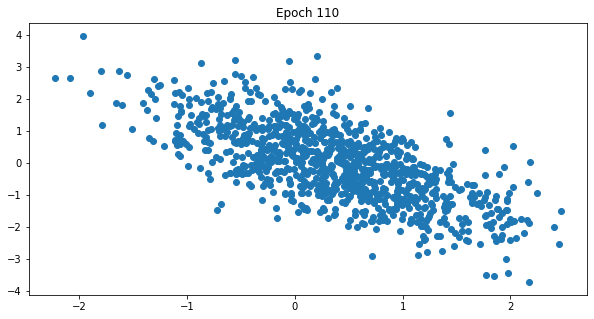

 11%|█         | 111/1000 [08:14<1:06:21,  4.48s/it]

 11%|█         | 112/1000 [08:18<1:05:12,  4.41s/it]

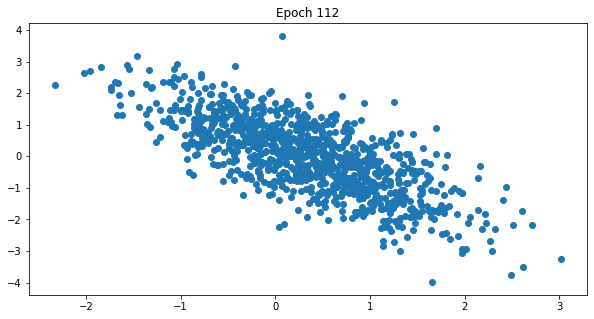

 11%|█▏        | 113/1000 [08:23<1:06:30,  4.50s/it]

 11%|█▏        | 114/1000 [08:27<1:05:03,  4.41s/it]

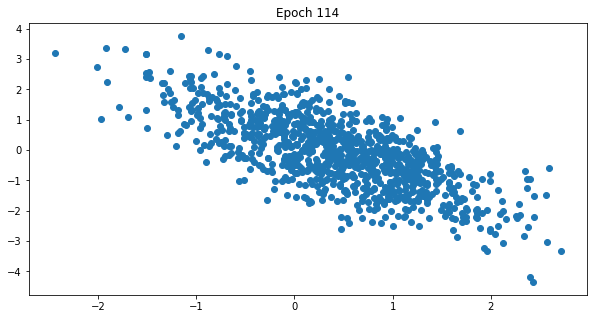

 12%|█▏        | 115/1000 [08:31<1:05:37,  4.45s/it]

 12%|█▏        | 116/1000 [08:36<1:04:25,  4.37s/it]

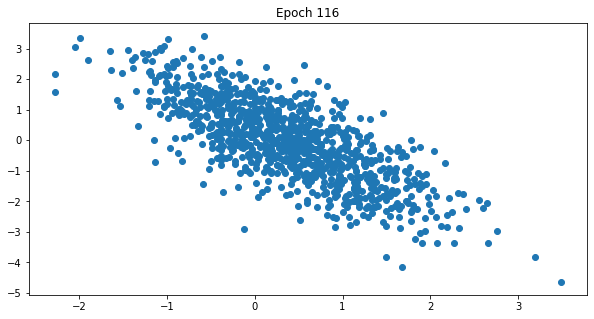

 12%|█▏        | 117/1000 [08:40<1:05:12,  4.43s/it]

 12%|█▏        | 118/1000 [08:44<1:03:41,  4.33s/it]

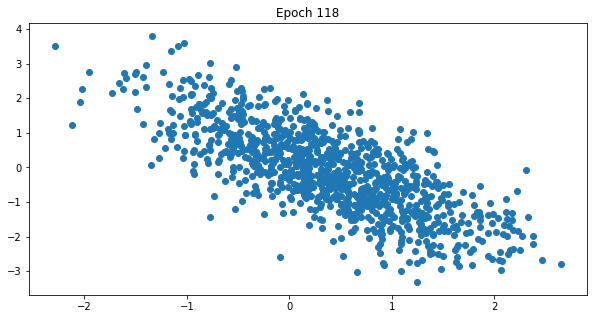

 12%|█▏        | 119/1000 [08:49<1:04:37,  4.40s/it]

 12%|█▏        | 120/1000 [08:53<1:03:56,  4.36s/it]

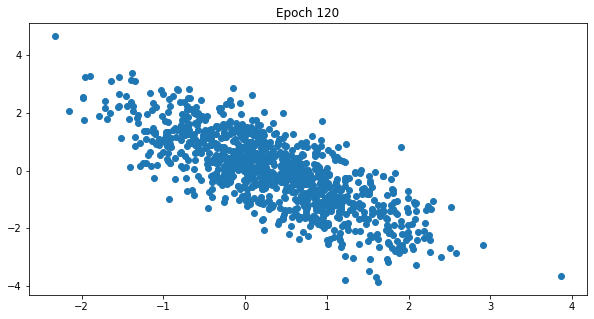

 12%|█▏        | 121/1000 [08:58<1:04:32,  4.41s/it]

 12%|█▏        | 122/1000 [09:02<1:03:38,  4.35s/it]

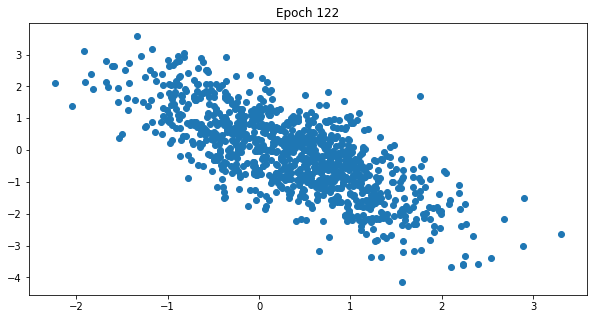

 12%|█▏        | 123/1000 [09:07<1:04:57,  4.44s/it]

 12%|█▏        | 124/1000 [09:11<1:04:17,  4.40s/it]

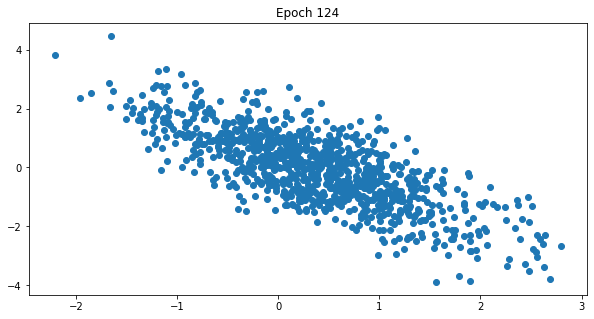

 12%|█▎        | 125/1000 [09:15<1:05:18,  4.48s/it]

 13%|█▎        | 126/1000 [09:20<1:04:01,  4.39s/it]

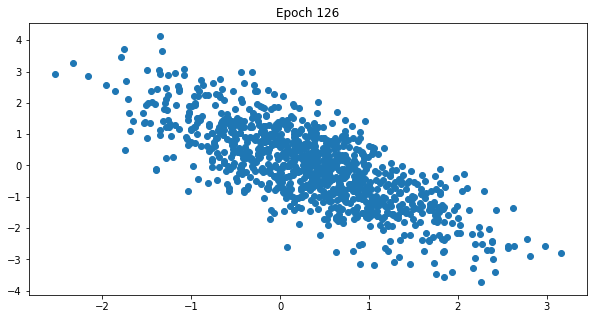

 13%|█▎        | 127/1000 [09:25<1:07:26,  4.63s/it]

 13%|█▎        | 128/1000 [09:29<1:05:49,  4.53s/it]

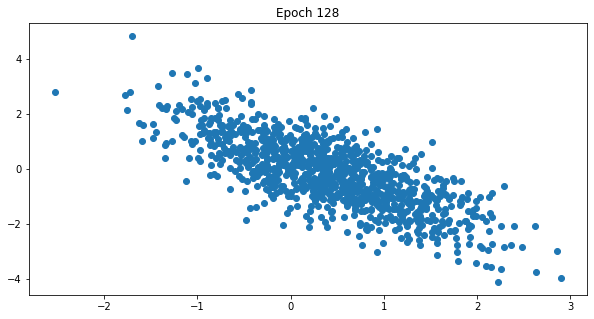

 13%|█▎        | 129/1000 [09:34<1:06:04,  4.55s/it]

 13%|█▎        | 130/1000 [09:38<1:04:36,  4.46s/it]

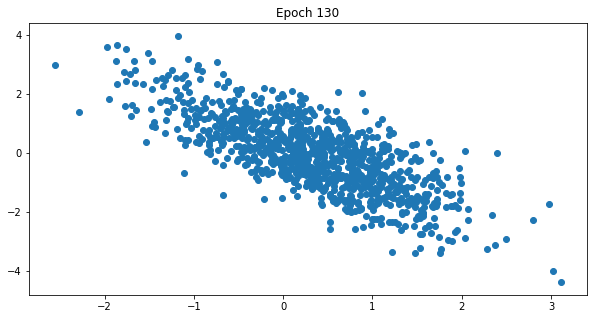

 13%|█▎        | 131/1000 [09:43<1:05:36,  4.53s/it]

 13%|█▎        | 132/1000 [09:47<1:04:21,  4.45s/it]

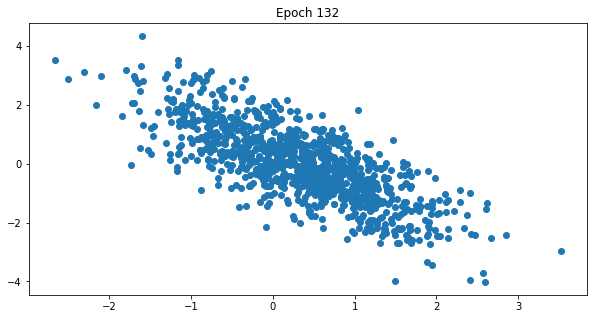

 13%|█▎        | 133/1000 [09:52<1:05:02,  4.50s/it]

 13%|█▎        | 134/1000 [09:56<1:04:02,  4.44s/it]

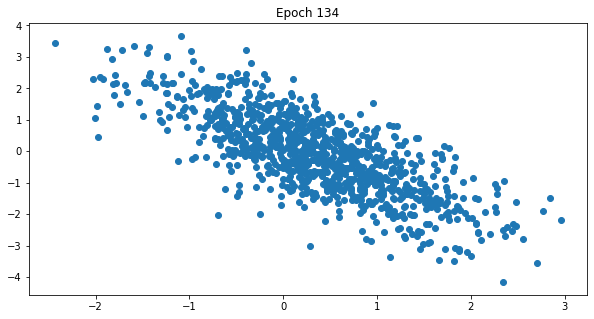

 14%|█▎        | 135/1000 [10:00<1:04:49,  4.50s/it]

 14%|█▎        | 136/1000 [10:05<1:03:36,  4.42s/it]

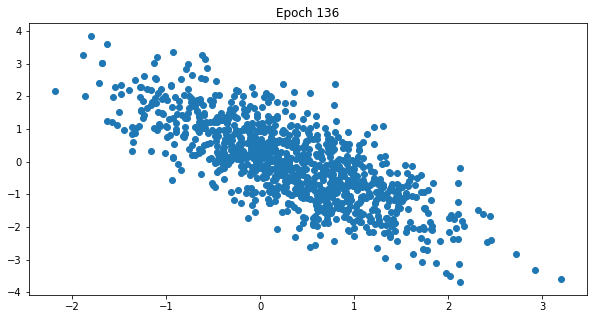

 14%|█▎        | 137/1000 [10:09<1:03:55,  4.44s/it]

 14%|█▍        | 138/1000 [10:14<1:03:12,  4.40s/it]

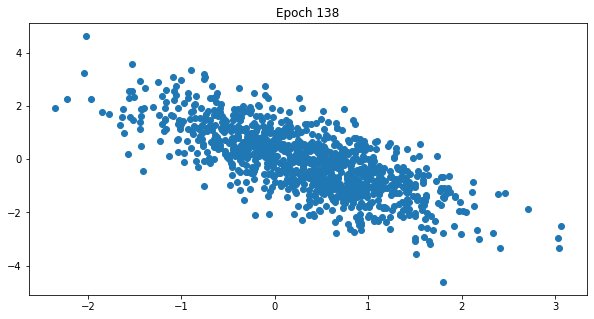

 14%|█▍        | 139/1000 [10:18<1:03:51,  4.45s/it]

 14%|█▍        | 140/1000 [10:22<1:02:59,  4.39s/it]

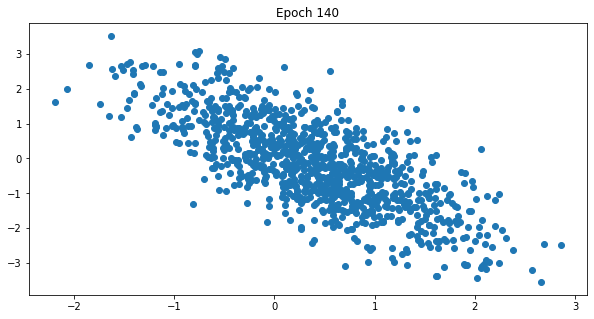

 14%|█▍        | 141/1000 [10:27<1:03:43,  4.45s/it]

 14%|█▍        | 142/1000 [10:31<1:02:33,  4.37s/it]

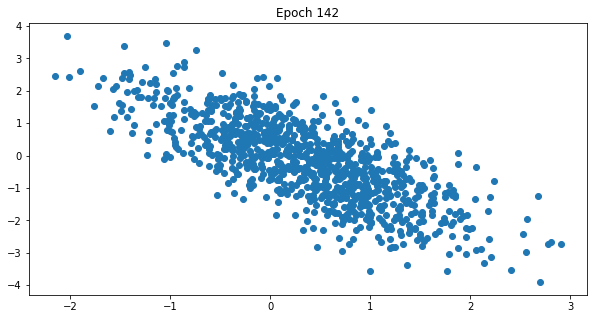

 14%|█▍        | 143/1000 [10:36<1:03:18,  4.43s/it]

 14%|█▍        | 144/1000 [10:40<1:02:31,  4.38s/it]

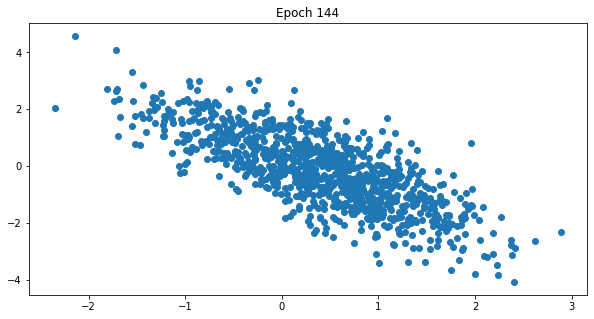

 14%|█▍        | 145/1000 [10:45<1:03:50,  4.48s/it]

 15%|█▍        | 146/1000 [10:49<1:02:26,  4.39s/it]

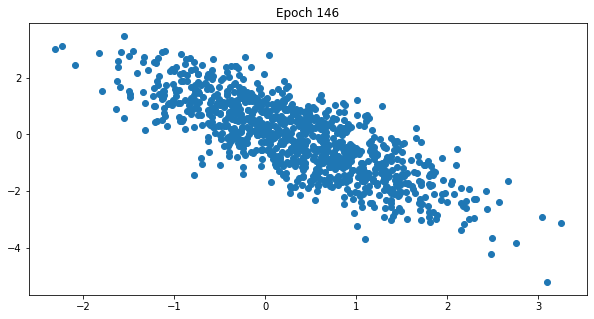

 15%|█▍        | 147/1000 [10:53<1:03:00,  4.43s/it]

 15%|█▍        | 148/1000 [10:58<1:02:03,  4.37s/it]

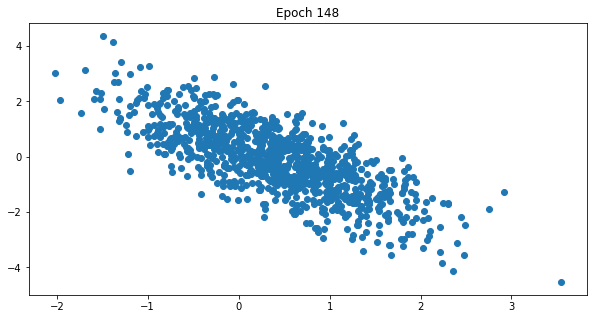

 15%|█▍        | 149/1000 [11:02<1:02:58,  4.44s/it]

 15%|█▌        | 150/1000 [11:06<1:01:40,  4.35s/it]

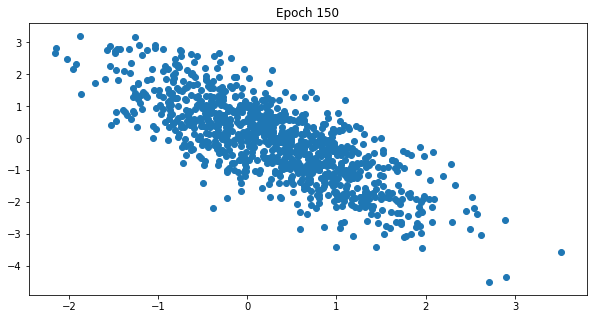

 15%|█▌        | 151/1000 [11:11<1:02:19,  4.40s/it]

 15%|█▌        | 152/1000 [11:15<1:01:12,  4.33s/it]

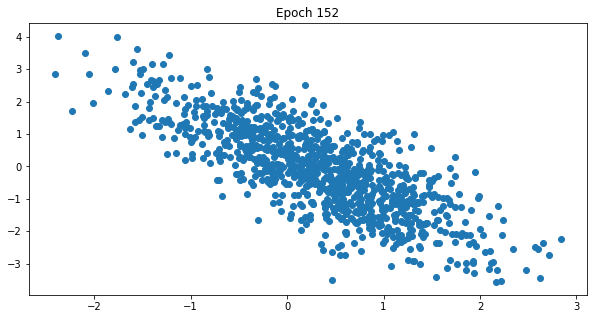

 15%|█▌        | 153/1000 [11:20<1:02:11,  4.41s/it]

 15%|█▌        | 154/1000 [11:24<1:01:25,  4.36s/it]

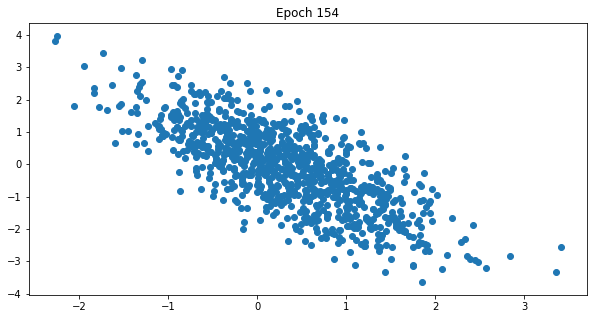

 16%|█▌        | 155/1000 [11:28<1:02:26,  4.43s/it]

 16%|█▌        | 156/1000 [11:33<1:01:23,  4.36s/it]

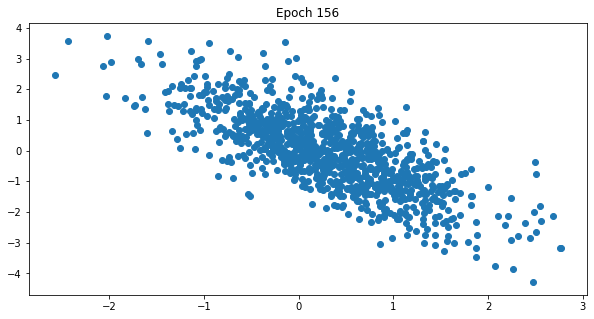

 16%|█▌        | 157/1000 [11:37<1:02:28,  4.45s/it]

 16%|█▌        | 158/1000 [11:42<1:01:26,  4.38s/it]

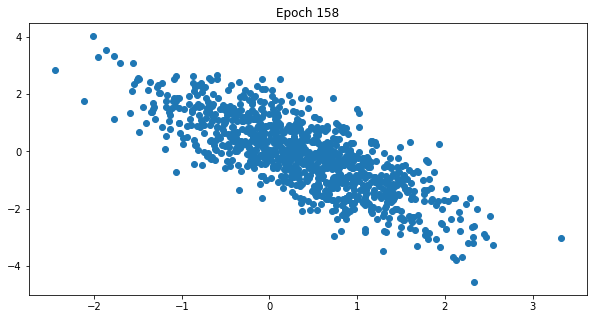

 16%|█▌        | 159/1000 [11:46<1:02:01,  4.43s/it]

 16%|█▌        | 160/1000 [11:50<1:00:38,  4.33s/it]

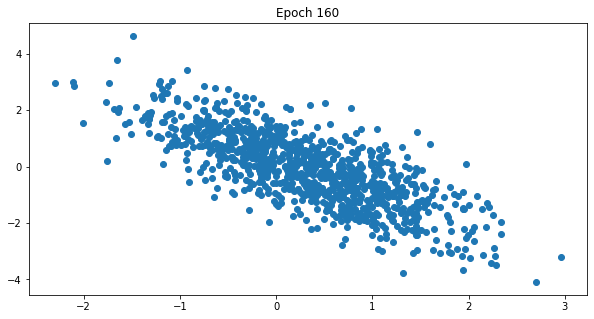

 16%|█▌        | 161/1000 [11:55<1:01:37,  4.41s/it]

 16%|█▌        | 162/1000 [11:59<1:00:49,  4.35s/it]

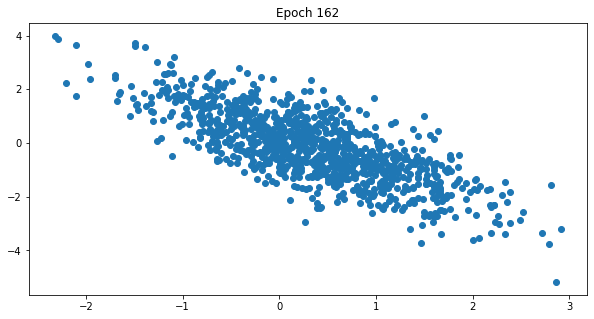

 16%|█▋        | 163/1000 [12:04<1:02:16,  4.46s/it]

 16%|█▋        | 164/1000 [12:08<1:01:21,  4.40s/it]

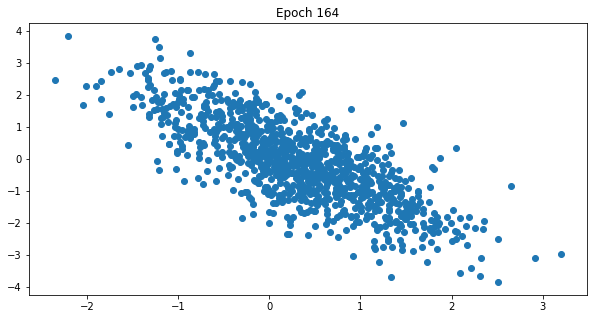

 16%|█▋        | 165/1000 [12:13<1:02:33,  4.50s/it]

 17%|█▋        | 166/1000 [12:17<1:01:14,  4.41s/it]

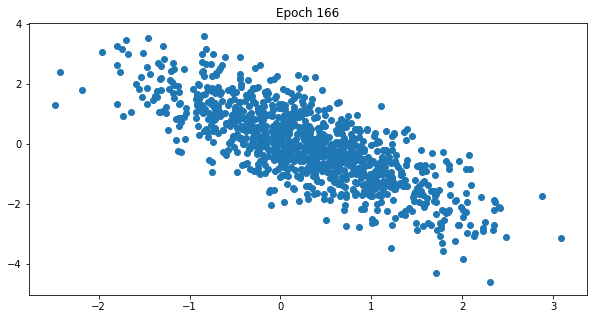

 17%|█▋        | 167/1000 [12:22<1:02:02,  4.47s/it]

 17%|█▋        | 168/1000 [12:26<1:00:42,  4.38s/it]

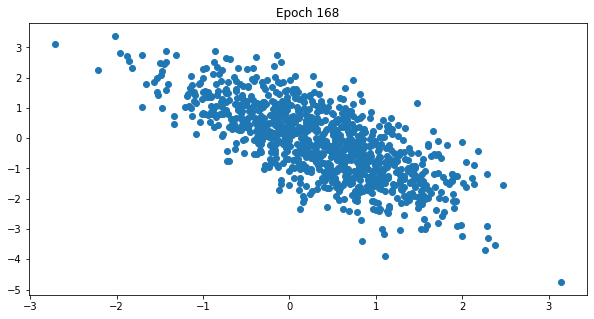

 17%|█▋        | 169/1000 [12:30<1:01:31,  4.44s/it]

 17%|█▋        | 170/1000 [12:35<1:00:49,  4.40s/it]

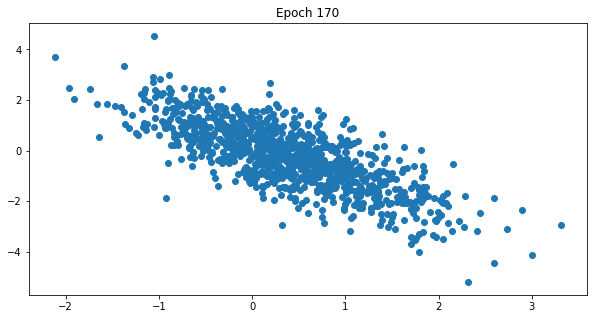

 17%|█▋        | 171/1000 [12:39<1:01:31,  4.45s/it]

 17%|█▋        | 172/1000 [12:43<1:00:29,  4.38s/it]

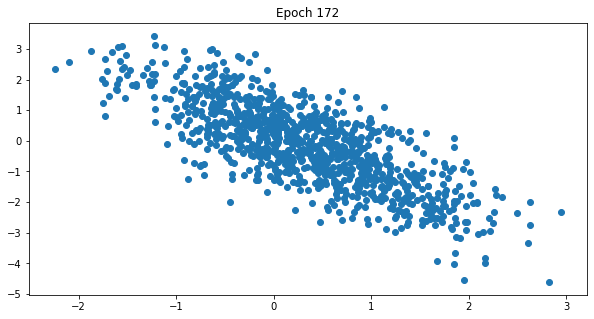

 17%|█▋        | 173/1000 [12:48<1:01:07,  4.43s/it]

 17%|█▋        | 174/1000 [12:52<59:59,  4.36s/it]  

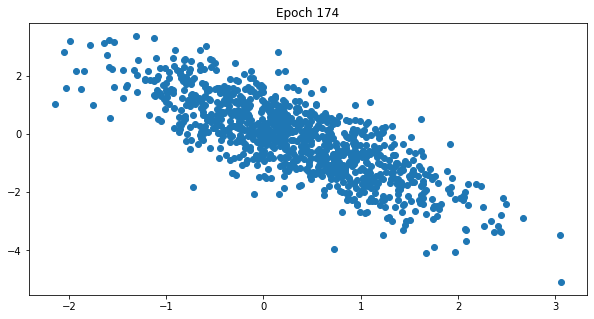

 18%|█▊        | 175/1000 [12:57<1:00:38,  4.41s/it]

 18%|█▊        | 176/1000 [13:01<1:00:11,  4.38s/it]

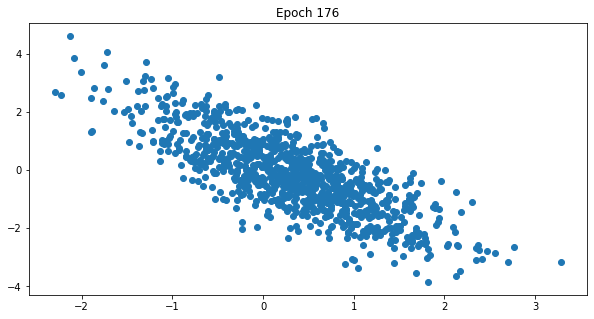

 18%|█▊        | 177/1000 [13:05<1:00:45,  4.43s/it]

 18%|█▊        | 178/1000 [13:10<1:00:10,  4.39s/it]

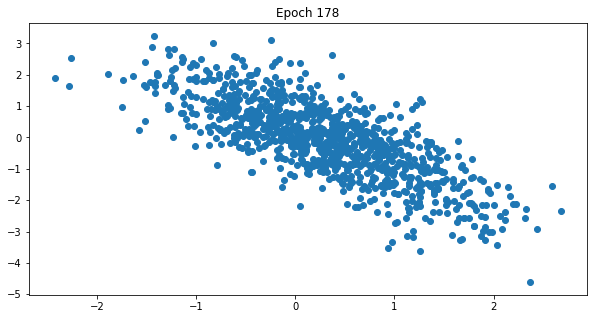

 18%|█▊        | 179/1000 [13:14<1:01:15,  4.48s/it]

 18%|█▊        | 180/1000 [13:19<1:00:28,  4.42s/it]

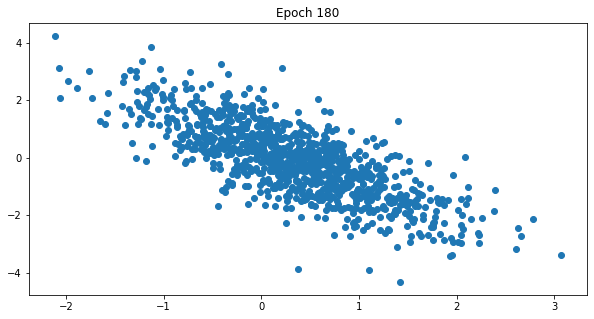

 18%|█▊        | 181/1000 [13:23<1:00:53,  4.46s/it]

 18%|█▊        | 182/1000 [13:28<1:00:08,  4.41s/it]

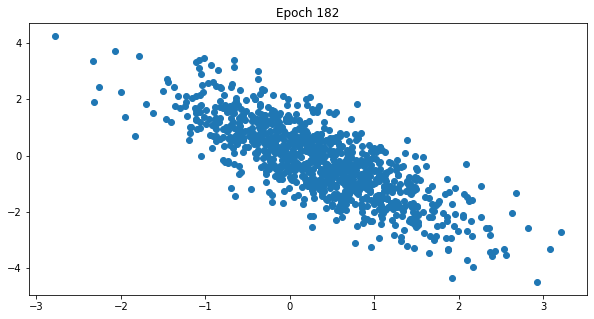

 18%|█▊        | 183/1000 [13:32<1:01:01,  4.48s/it]

 18%|█▊        | 184/1000 [13:37<1:00:16,  4.43s/it]

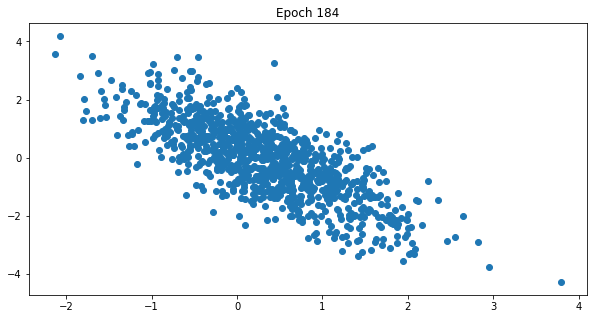

 18%|█▊        | 185/1000 [13:42<1:02:47,  4.62s/it]

 19%|█▊        | 186/1000 [13:46<1:01:01,  4.50s/it]

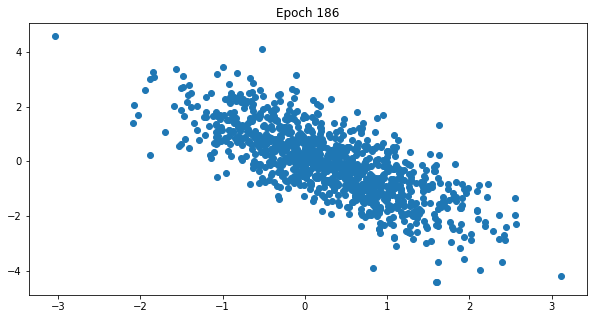

 19%|█▊        | 187/1000 [13:50<1:01:30,  4.54s/it]

 19%|█▉        | 188/1000 [13:55<1:00:21,  4.46s/it]

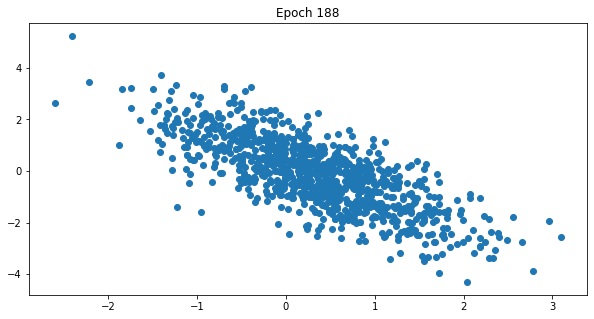

 19%|█▉        | 189/1000 [13:59<1:01:09,  4.52s/it]

 19%|█▉        | 190/1000 [14:04<1:00:11,  4.46s/it]

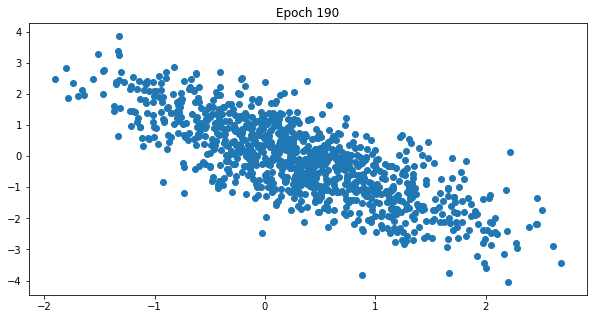

 19%|█▉        | 191/1000 [14:08<1:00:37,  4.50s/it]

 19%|█▉        | 192/1000 [14:13<59:33,  4.42s/it]  

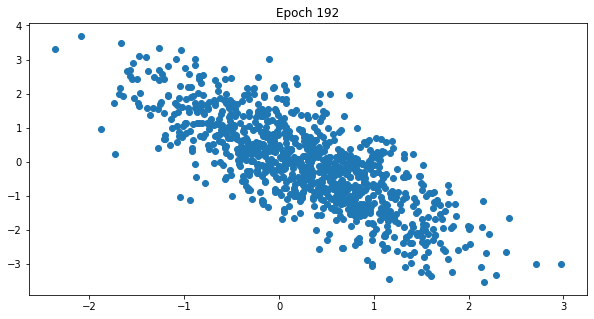

 19%|█▉        | 193/1000 [14:17<1:00:14,  4.48s/it]

 19%|█▉        | 194/1000 [14:21<59:17,  4.41s/it]  

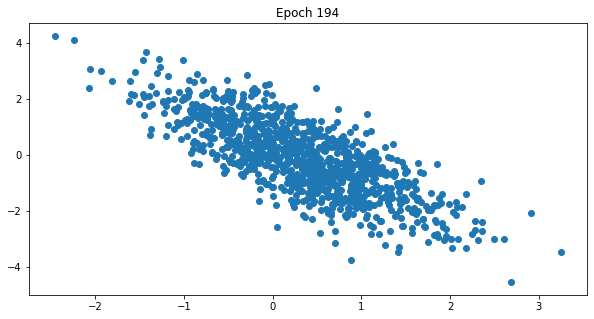

 20%|█▉        | 195/1000 [14:27<1:02:13,  4.64s/it]

 20%|█▉        | 196/1000 [14:31<1:00:48,  4.54s/it]

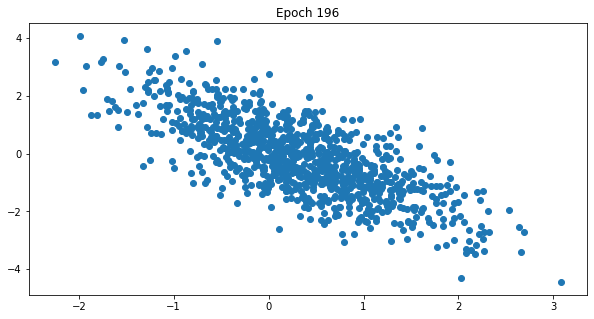

 20%|█▉        | 197/1000 [14:36<1:01:16,  4.58s/it]

 20%|█▉        | 198/1000 [14:40<1:00:26,  4.52s/it]

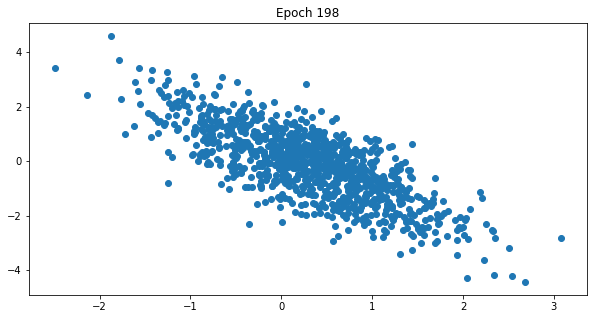

 20%|█▉        | 199/1000 [14:45<1:00:41,  4.55s/it]

 20%|██        | 200/1000 [14:49<59:46,  4.48s/it]  

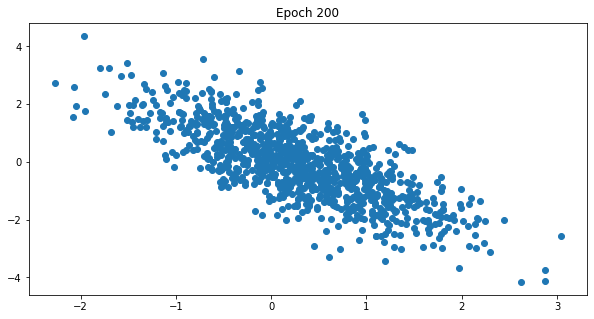

 20%|██        | 201/1000 [14:54<1:02:33,  4.70s/it]

 20%|██        | 202/1000 [14:58<1:00:32,  4.55s/it]

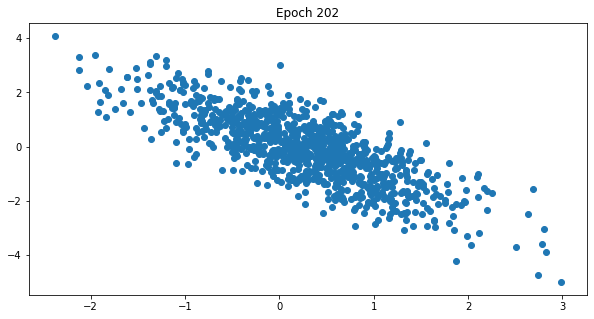

 20%|██        | 203/1000 [15:03<1:00:40,  4.57s/it]

 20%|██        | 204/1000 [15:07<59:39,  4.50s/it]  

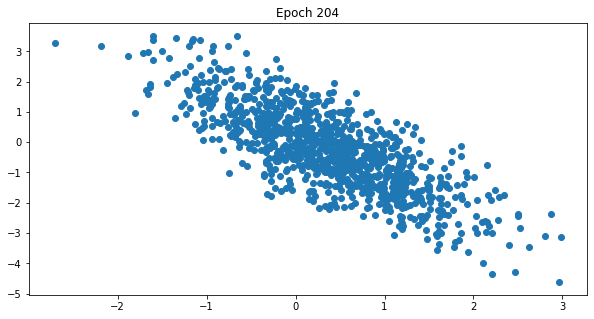

 20%|██        | 205/1000 [15:12<1:00:17,  4.55s/it]

 21%|██        | 206/1000 [15:16<58:51,  4.45s/it]  

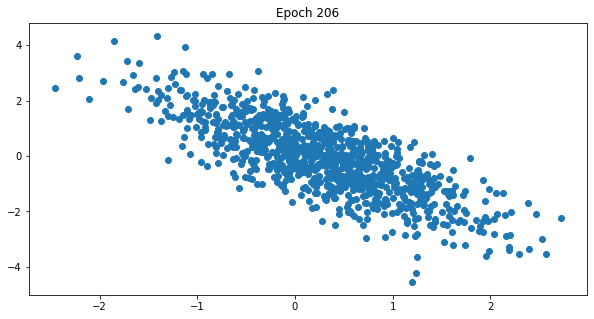

 21%|██        | 207/1000 [15:21<59:30,  4.50s/it]

 21%|██        | 208/1000 [15:25<58:00,  4.39s/it]

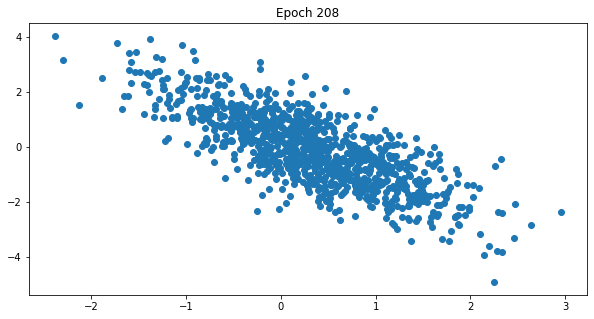

 21%|██        | 209/1000 [15:29<58:41,  4.45s/it]

 21%|██        | 210/1000 [15:34<57:49,  4.39s/it]

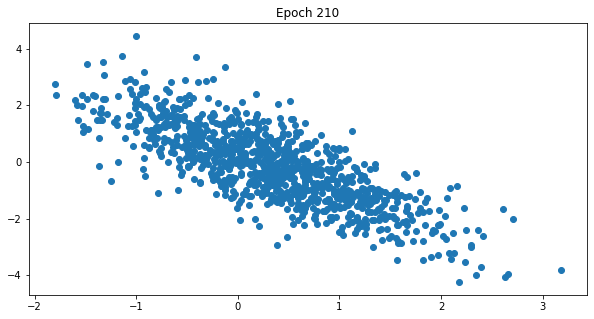

 21%|██        | 211/1000 [15:38<58:25,  4.44s/it]

 21%|██        | 212/1000 [15:43<57:51,  4.41s/it]

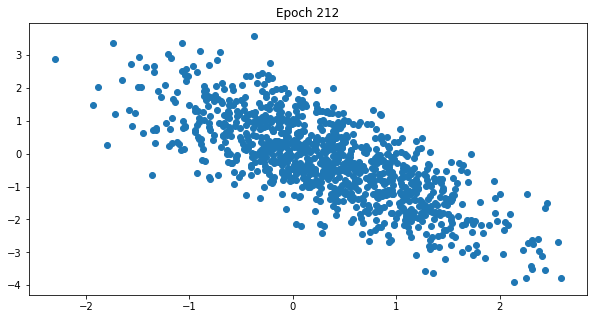

 21%|██▏       | 213/1000 [15:47<58:36,  4.47s/it]

 21%|██▏       | 214/1000 [15:51<57:40,  4.40s/it]

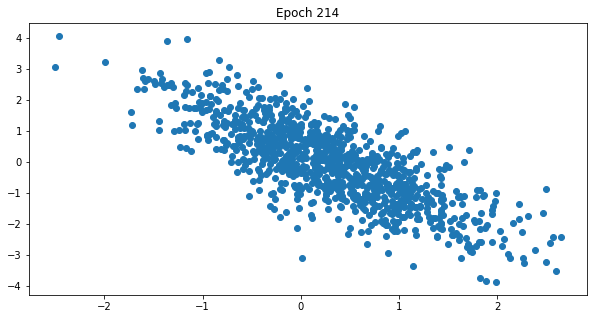

 22%|██▏       | 215/1000 [15:56<58:10,  4.45s/it]

 22%|██▏       | 216/1000 [16:00<57:11,  4.38s/it]

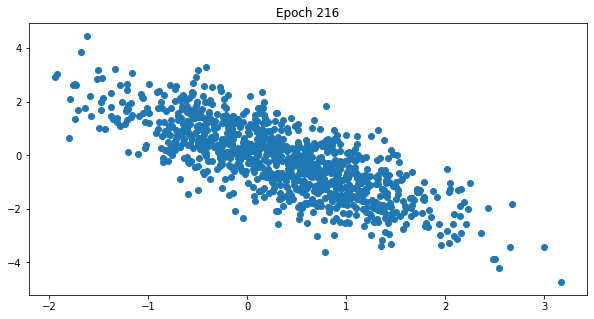

 22%|██▏       | 217/1000 [16:05<59:53,  4.59s/it]

 22%|██▏       | 218/1000 [16:10<58:26,  4.48s/it]

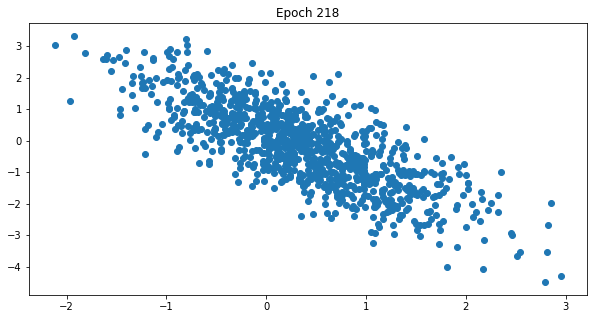

 22%|██▏       | 219/1000 [16:14<59:08,  4.54s/it]

 22%|██▏       | 220/1000 [16:19<57:55,  4.46s/it]

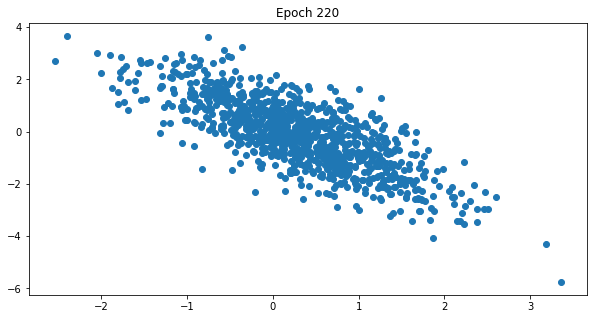

 22%|██▏       | 221/1000 [16:23<58:50,  4.53s/it]

 22%|██▏       | 222/1000 [16:27<57:39,  4.45s/it]

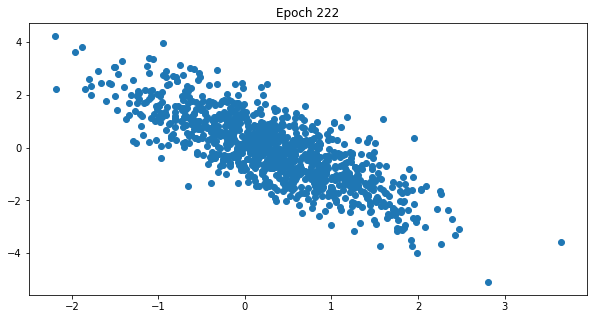

 22%|██▏       | 223/1000 [16:32<58:14,  4.50s/it]

 22%|██▏       | 224/1000 [16:36<57:07,  4.42s/it]

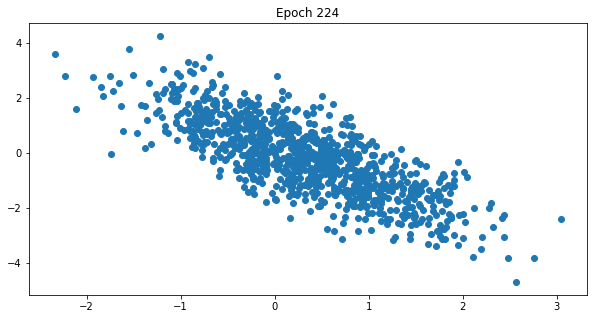

 22%|██▎       | 225/1000 [16:41<57:48,  4.48s/it]

 23%|██▎       | 226/1000 [16:45<57:28,  4.45s/it]

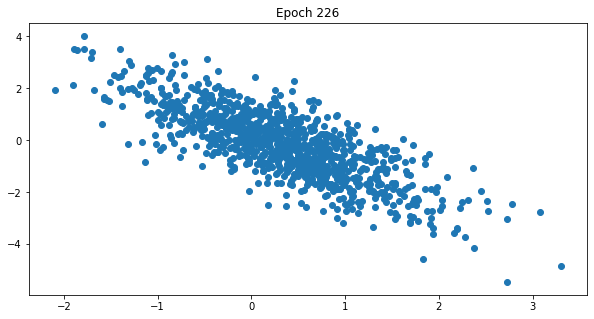

 23%|██▎       | 227/1000 [16:50<57:59,  4.50s/it]

 23%|██▎       | 228/1000 [16:54<56:36,  4.40s/it]

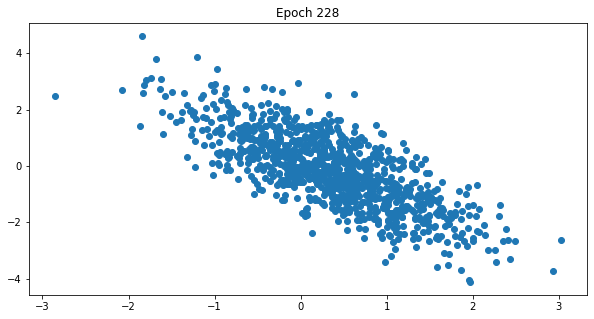

 23%|██▎       | 229/1000 [16:59<57:09,  4.45s/it]

 23%|██▎       | 230/1000 [17:03<56:15,  4.38s/it]

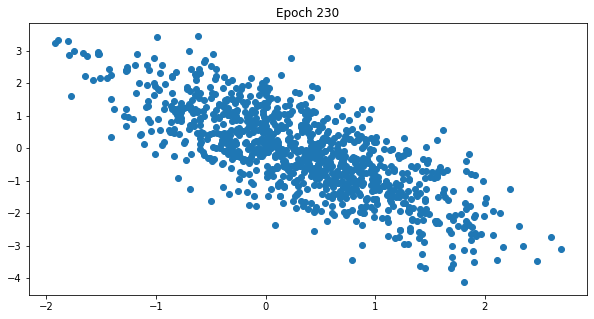

 23%|██▎       | 231/1000 [17:08<57:06,  4.46s/it]

 23%|██▎       | 232/1000 [17:12<56:40,  4.43s/it]

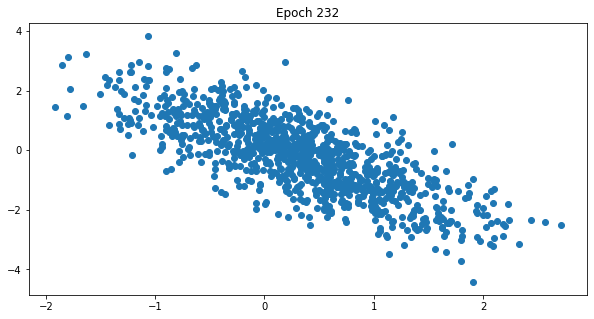

 23%|██▎       | 233/1000 [17:16<57:17,  4.48s/it]

 23%|██▎       | 234/1000 [17:21<56:11,  4.40s/it]

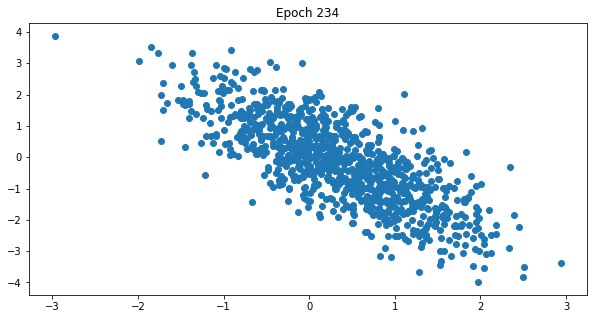

 24%|██▎       | 235/1000 [17:25<56:55,  4.46s/it]

 24%|██▎       | 236/1000 [17:30<55:58,  4.40s/it]

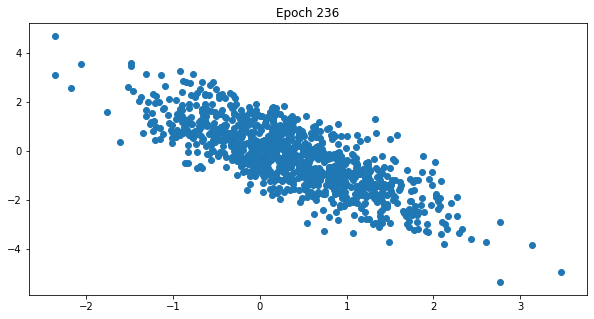

 24%|██▎       | 237/1000 [17:34<57:00,  4.48s/it]

 24%|██▍       | 238/1000 [17:38<55:56,  4.40s/it]

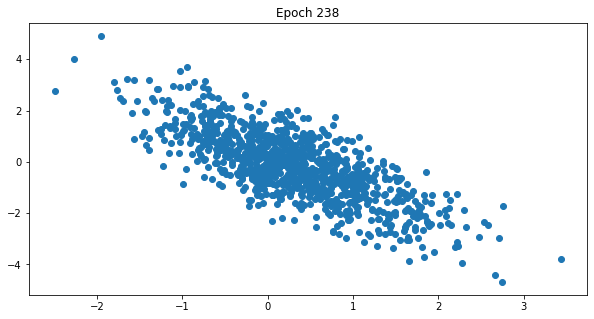

 24%|██▍       | 239/1000 [17:44<58:31,  4.61s/it]

 24%|██▍       | 240/1000 [17:48<57:09,  4.51s/it]

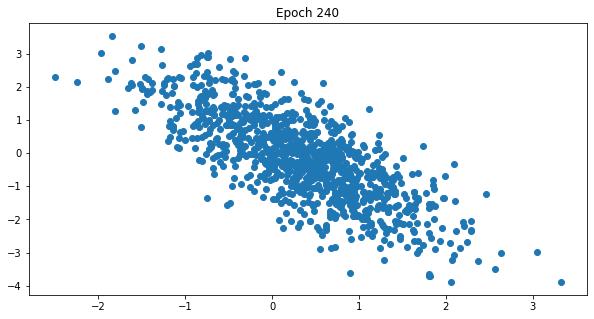

 24%|██▍       | 241/1000 [17:52<57:30,  4.55s/it]

 24%|██▍       | 242/1000 [17:57<56:23,  4.46s/it]

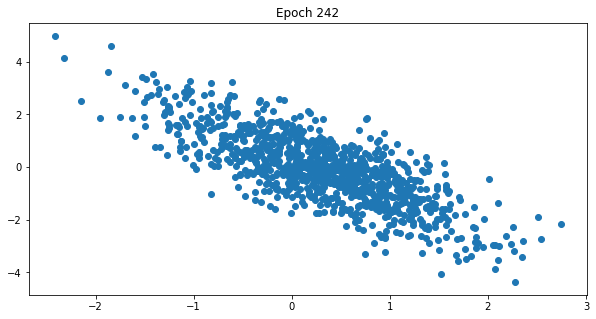

 24%|██▍       | 243/1000 [18:01<57:01,  4.52s/it]

 24%|██▍       | 244/1000 [18:06<55:51,  4.43s/it]

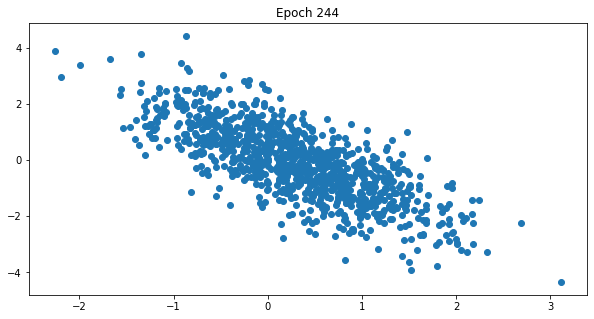

 24%|██▍       | 245/1000 [18:10<56:19,  4.48s/it]

 25%|██▍       | 246/1000 [18:14<55:30,  4.42s/it]

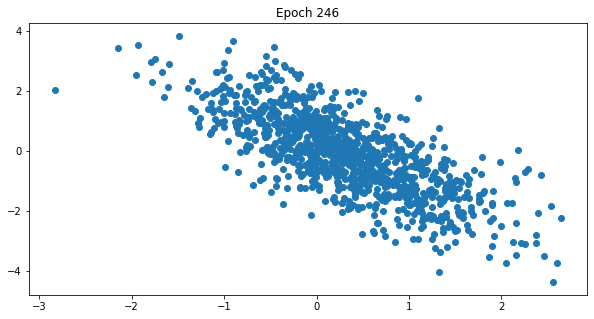

 25%|██▍       | 247/1000 [18:20<58:26,  4.66s/it]

 25%|██▍       | 248/1000 [18:24<56:48,  4.53s/it]

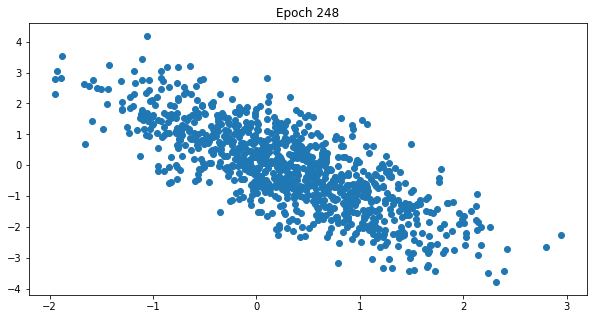

 25%|██▍       | 249/1000 [18:29<57:05,  4.56s/it]

 25%|██▌       | 250/1000 [18:33<55:40,  4.45s/it]

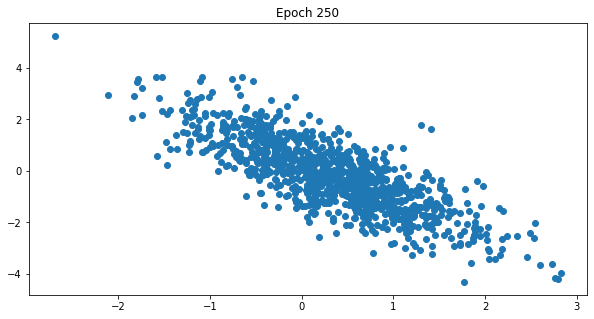

 25%|██▌       | 251/1000 [18:37<56:20,  4.51s/it]

 25%|██▌       | 252/1000 [18:42<55:00,  4.41s/it]

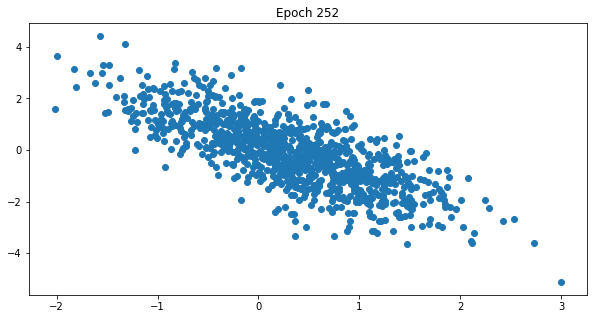

 25%|██▌       | 253/1000 [18:46<55:21,  4.45s/it]

 25%|██▌       | 254/1000 [18:50<54:46,  4.40s/it]

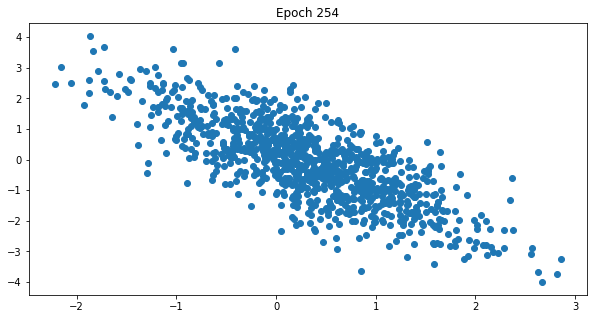

 26%|██▌       | 255/1000 [18:55<55:33,  4.47s/it]

 26%|██▌       | 256/1000 [18:59<54:30,  4.40s/it]

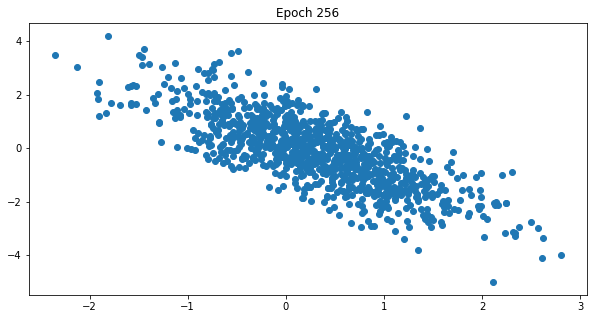

 26%|██▌       | 257/1000 [19:04<55:07,  4.45s/it]

 26%|██▌       | 258/1000 [19:08<54:20,  4.39s/it]

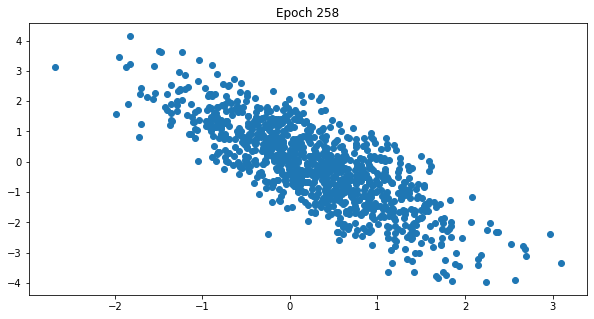

 26%|██▌       | 259/1000 [19:13<55:00,  4.45s/it]

 26%|██▌       | 260/1000 [19:17<54:15,  4.40s/it]

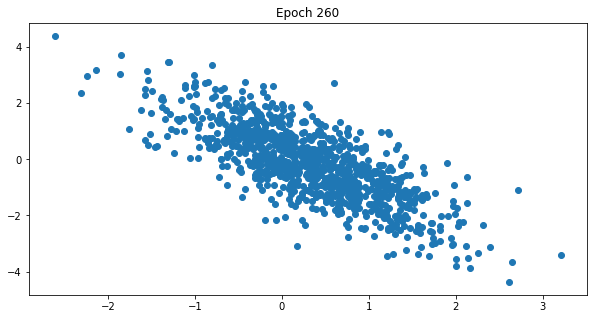

 26%|██▌       | 261/1000 [19:22<54:52,  4.46s/it]

 26%|██▌       | 262/1000 [19:26<54:00,  4.39s/it]

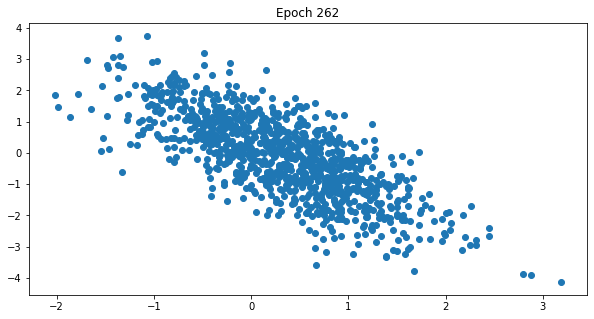

 26%|██▋       | 263/1000 [19:30<54:39,  4.45s/it]

 26%|██▋       | 264/1000 [19:35<53:45,  4.38s/it]

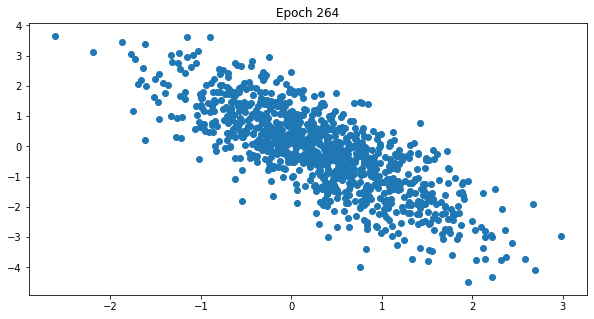

 26%|██▋       | 265/1000 [19:39<55:01,  4.49s/it]

 27%|██▋       | 266/1000 [19:44<54:15,  4.44s/it]

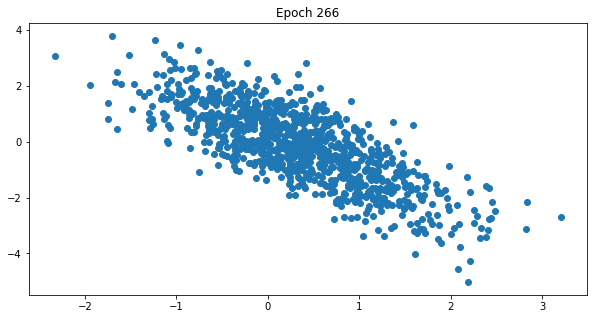

 27%|██▋       | 267/1000 [19:49<55:43,  4.56s/it]

 27%|██▋       | 268/1000 [19:53<54:47,  4.49s/it]

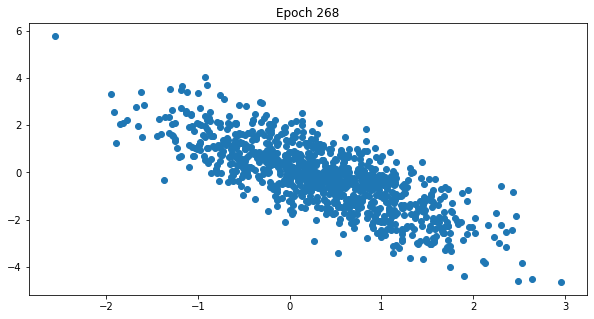

 27%|██▋       | 269/1000 [19:58<55:16,  4.54s/it]

 27%|██▋       | 270/1000 [20:02<54:06,  4.45s/it]

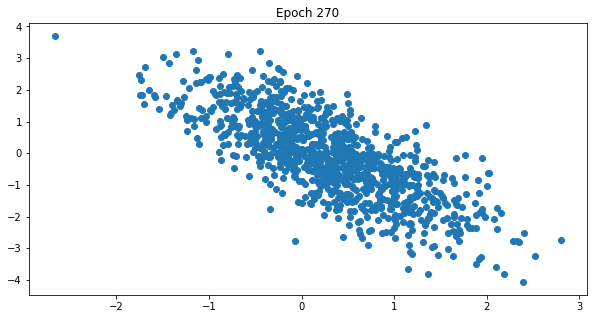

 27%|██▋       | 271/1000 [20:06<54:19,  4.47s/it]

 27%|██▋       | 272/1000 [20:11<53:25,  4.40s/it]

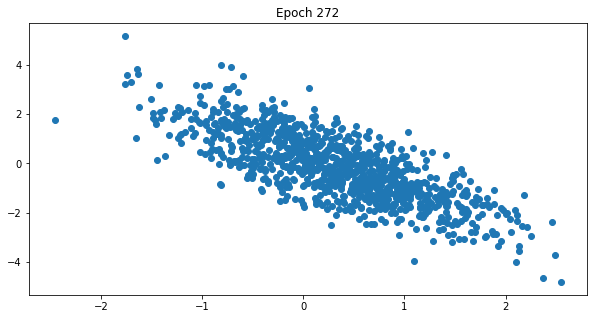

 27%|██▋       | 273/1000 [20:15<54:09,  4.47s/it]

 27%|██▋       | 274/1000 [20:19<53:18,  4.41s/it]

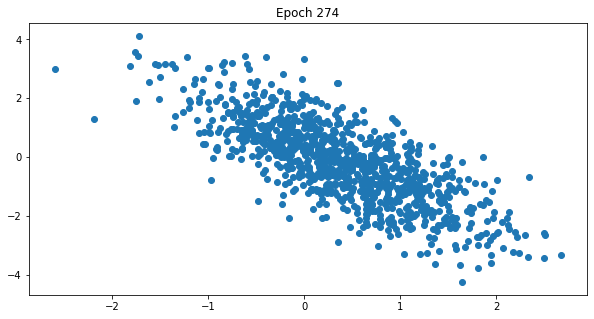

 28%|██▊       | 275/1000 [20:24<53:48,  4.45s/it]

 28%|██▊       | 276/1000 [20:28<52:51,  4.38s/it]

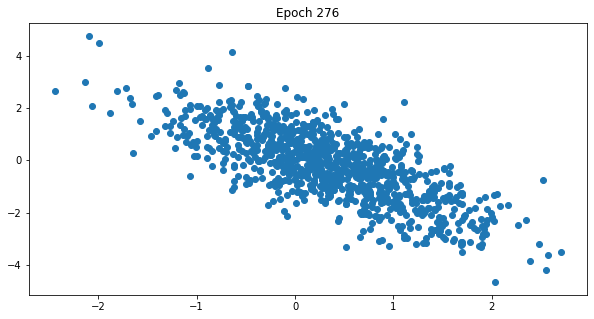

 28%|██▊       | 277/1000 [20:33<53:55,  4.48s/it]

 28%|██▊       | 278/1000 [20:37<52:47,  4.39s/it]

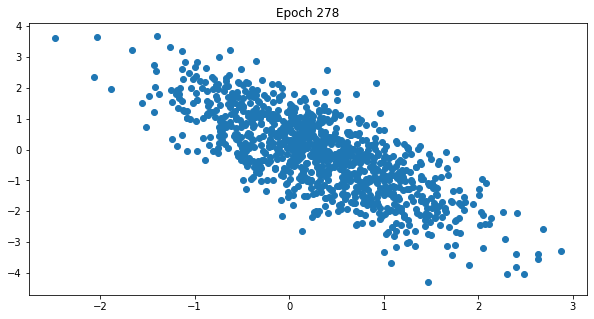

 28%|██▊       | 279/1000 [20:42<53:34,  4.46s/it]

 28%|██▊       | 280/1000 [20:46<52:37,  4.38s/it]

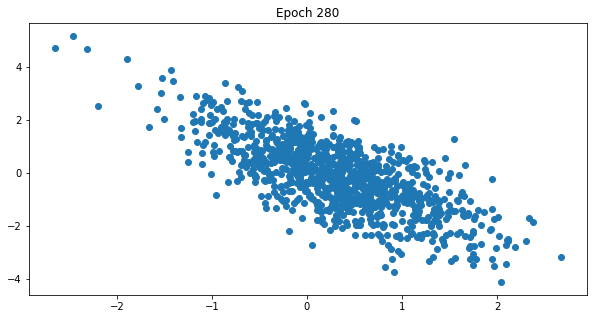

 28%|██▊       | 281/1000 [20:50<53:07,  4.43s/it]

 28%|██▊       | 282/1000 [20:55<52:28,  4.38s/it]

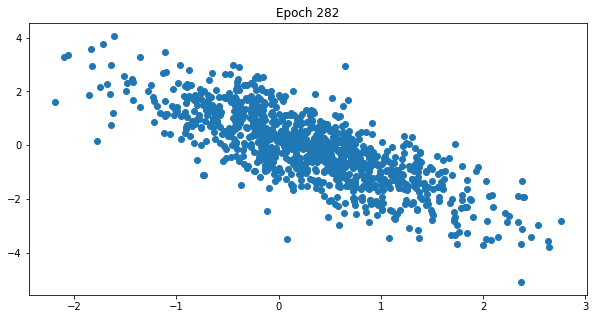

 28%|██▊       | 283/1000 [20:59<53:28,  4.47s/it]

 28%|██▊       | 284/1000 [21:04<52:19,  4.39s/it]

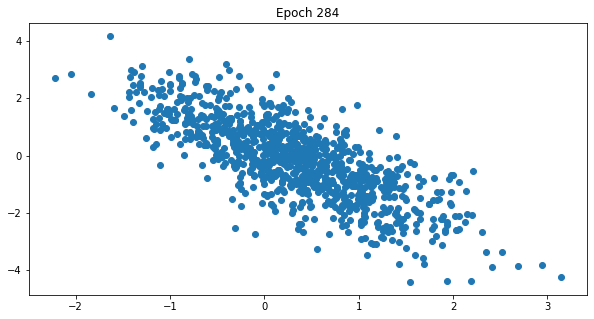

 28%|██▊       | 285/1000 [21:08<52:45,  4.43s/it]

 29%|██▊       | 286/1000 [21:12<51:34,  4.33s/it]

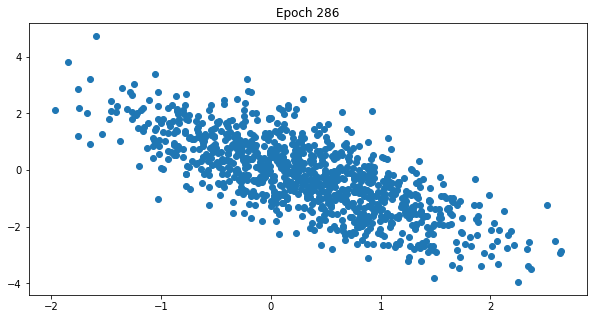

 29%|██▊       | 287/1000 [21:17<52:10,  4.39s/it]

 29%|██▉       | 288/1000 [21:21<51:59,  4.38s/it]

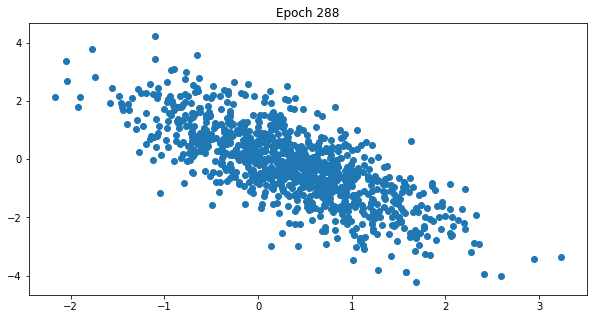

 29%|██▉       | 289/1000 [21:26<52:41,  4.45s/it]

 29%|██▉       | 290/1000 [21:30<51:50,  4.38s/it]

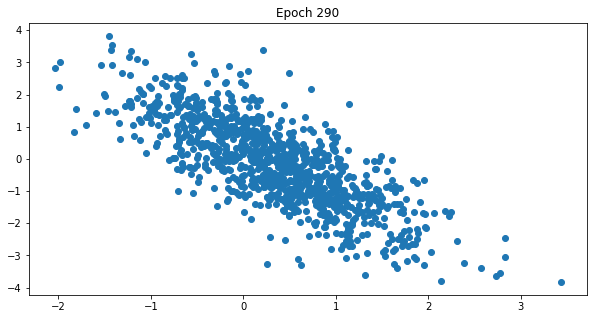

 29%|██▉       | 291/1000 [21:35<52:38,  4.45s/it]

 29%|██▉       | 292/1000 [21:39<51:38,  4.38s/it]

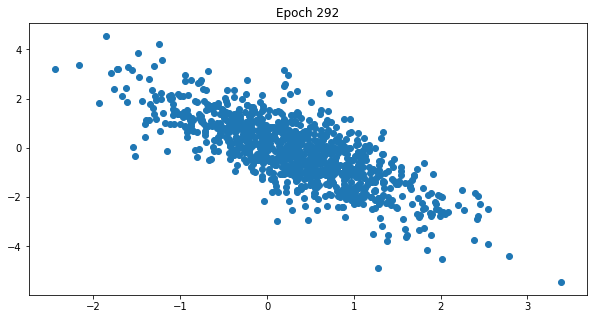

 29%|██▉       | 293/1000 [21:43<52:11,  4.43s/it]

 29%|██▉       | 294/1000 [21:47<51:17,  4.36s/it]

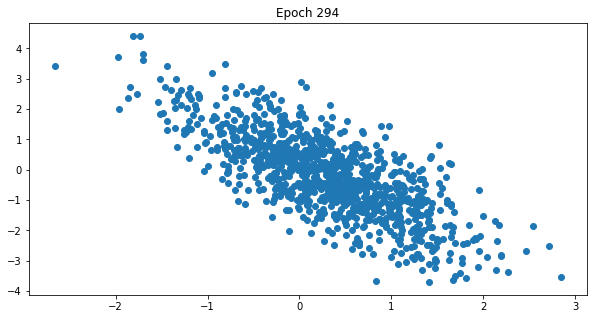

 30%|██▉       | 295/1000 [21:52<52:27,  4.46s/it]

 30%|██▉       | 296/1000 [21:56<51:44,  4.41s/it]

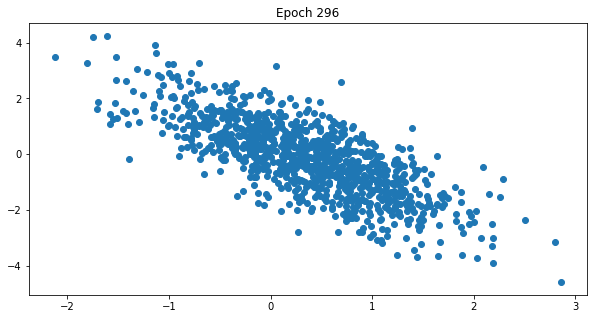

 30%|██▉       | 297/1000 [22:02<54:15,  4.63s/it]

 30%|██▉       | 298/1000 [22:06<53:33,  4.58s/it]

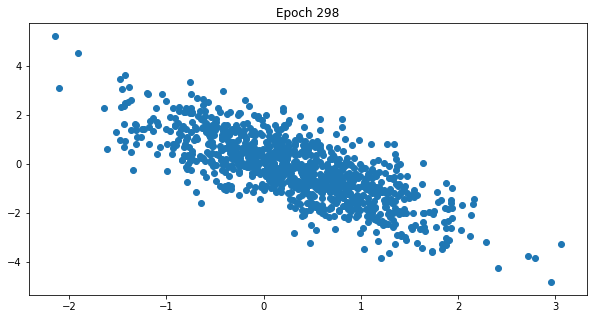

 30%|██▉       | 299/1000 [22:11<53:47,  4.60s/it]

 30%|███       | 300/1000 [22:15<52:34,  4.51s/it]

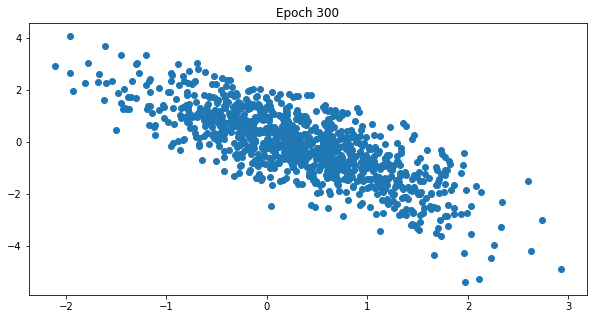

 30%|███       | 301/1000 [22:20<53:09,  4.56s/it]

 30%|███       | 302/1000 [22:24<51:54,  4.46s/it]

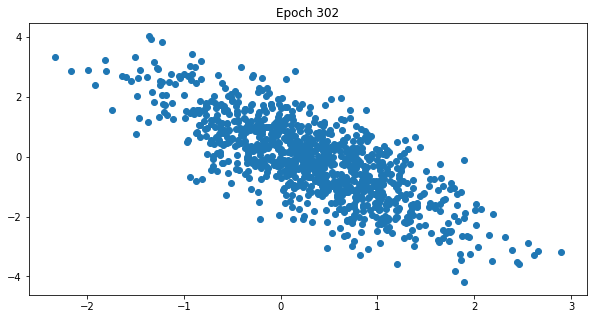

 30%|███       | 303/1000 [22:29<53:56,  4.64s/it]

 30%|███       | 304/1000 [22:33<52:25,  4.52s/it]

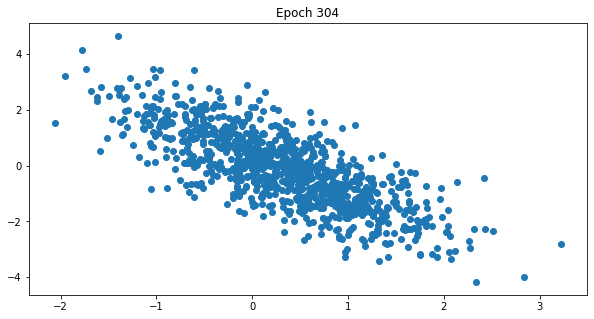

 30%|███       | 305/1000 [22:38<52:38,  4.55s/it]

 31%|███       | 306/1000 [22:42<51:40,  4.47s/it]

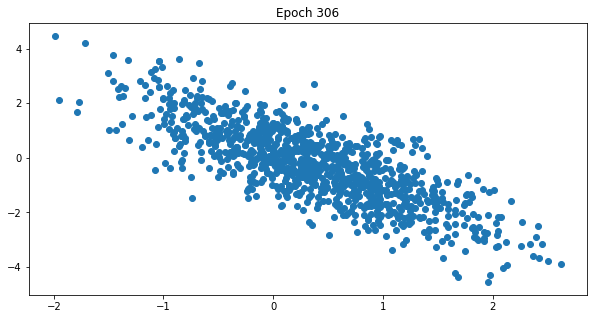

 31%|███       | 307/1000 [22:47<52:09,  4.52s/it]

 31%|███       | 308/1000 [22:51<51:12,  4.44s/it]

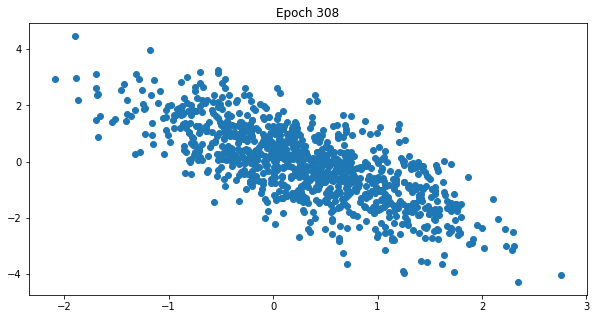

 31%|███       | 309/1000 [22:56<51:25,  4.46s/it]

 31%|███       | 310/1000 [23:00<50:34,  4.40s/it]

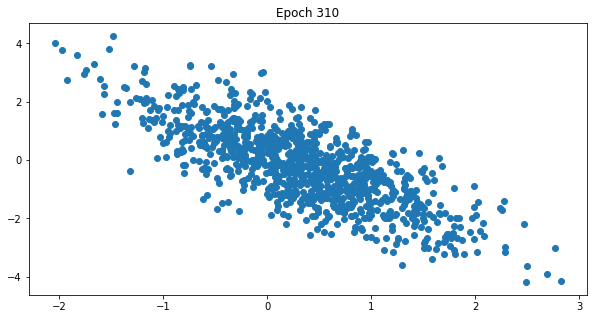

 31%|███       | 311/1000 [23:04<51:27,  4.48s/it]

 31%|███       | 312/1000 [23:09<50:30,  4.40s/it]

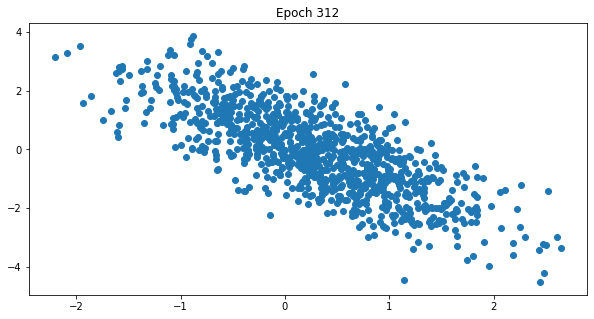

 31%|███▏      | 313/1000 [23:13<50:47,  4.44s/it]

 31%|███▏      | 314/1000 [23:17<50:13,  4.39s/it]

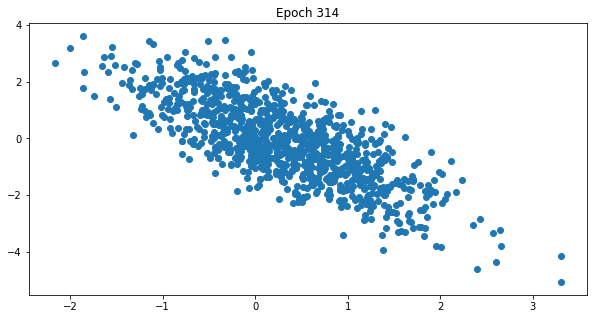

 32%|███▏      | 315/1000 [23:23<53:18,  4.67s/it]

 32%|███▏      | 316/1000 [23:27<51:39,  4.53s/it]

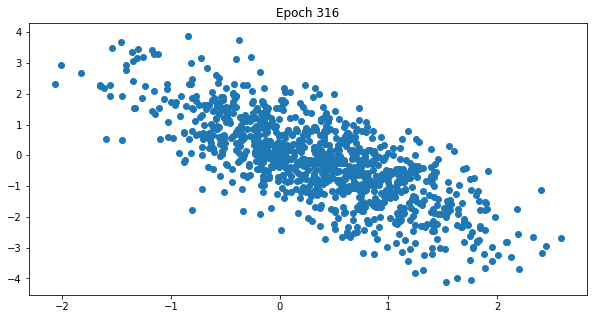

 32%|███▏      | 317/1000 [23:32<51:55,  4.56s/it]

 32%|███▏      | 318/1000 [23:36<50:39,  4.46s/it]

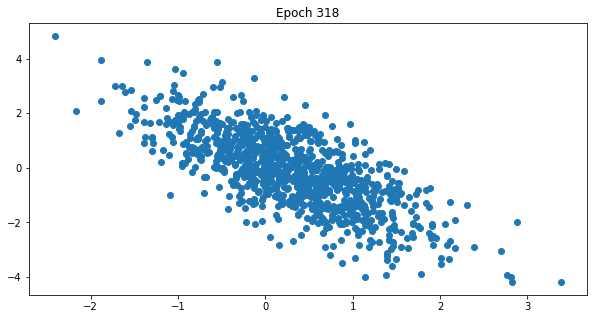

 32%|███▏      | 319/1000 [23:40<51:11,  4.51s/it]

 32%|███▏      | 320/1000 [23:45<50:32,  4.46s/it]

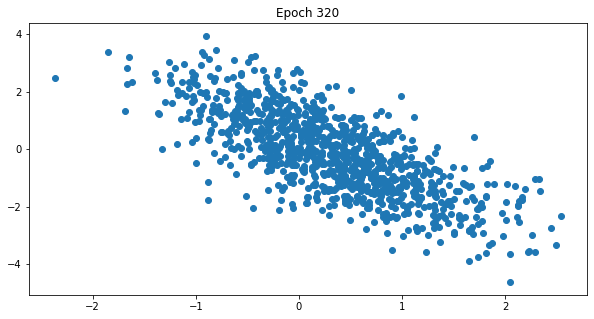

 32%|███▏      | 321/1000 [23:49<50:57,  4.50s/it]

 32%|███▏      | 322/1000 [23:54<50:08,  4.44s/it]

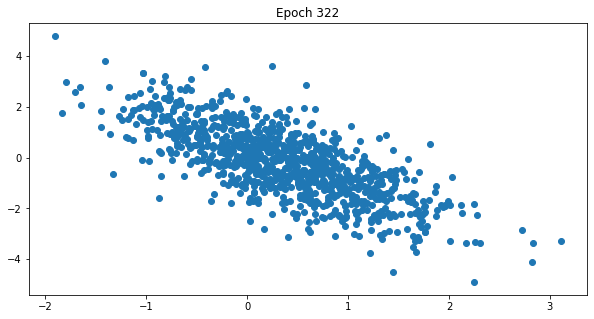

 32%|███▏      | 323/1000 [23:58<50:30,  4.48s/it]

 32%|███▏      | 324/1000 [24:03<49:31,  4.40s/it]

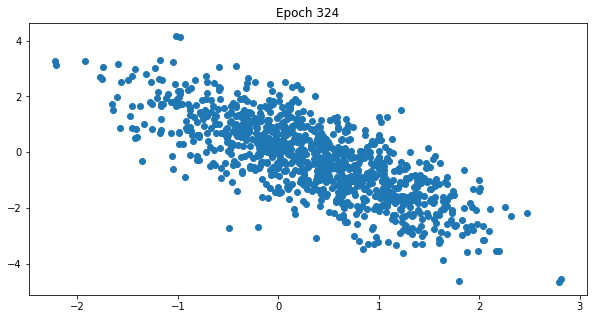

 32%|███▎      | 325/1000 [24:07<50:17,  4.47s/it]

 33%|███▎      | 326/1000 [24:11<49:41,  4.42s/it]

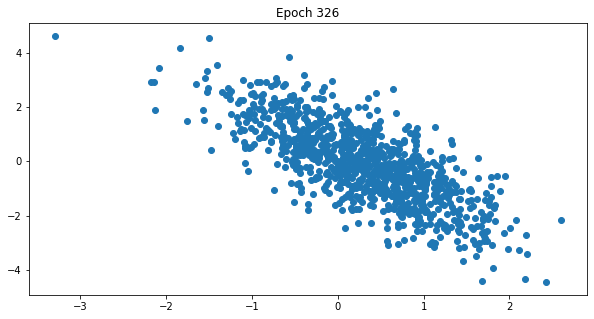

 33%|███▎      | 327/1000 [24:17<52:02,  4.64s/it]

 33%|███▎      | 328/1000 [24:21<50:37,  4.52s/it]

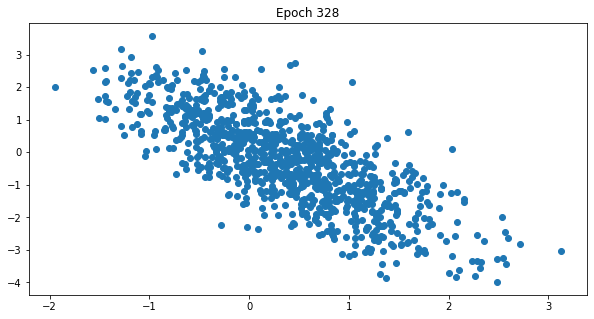

 33%|███▎      | 329/1000 [24:26<51:28,  4.60s/it]

 33%|███▎      | 330/1000 [24:30<50:10,  4.49s/it]

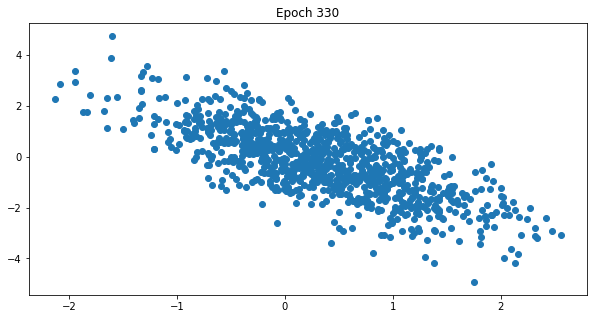

 33%|███▎      | 331/1000 [24:34<50:24,  4.52s/it]

 33%|███▎      | 332/1000 [24:39<49:18,  4.43s/it]

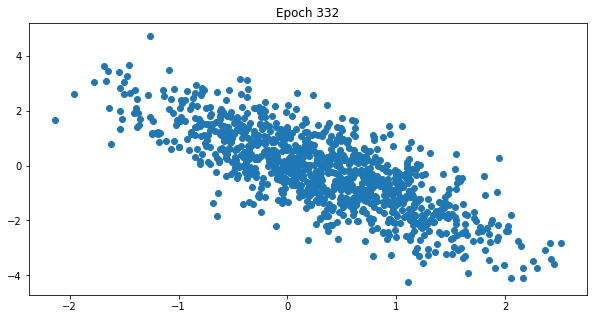

 33%|███▎      | 333/1000 [24:43<49:38,  4.47s/it]

 33%|███▎      | 334/1000 [24:47<48:41,  4.39s/it]

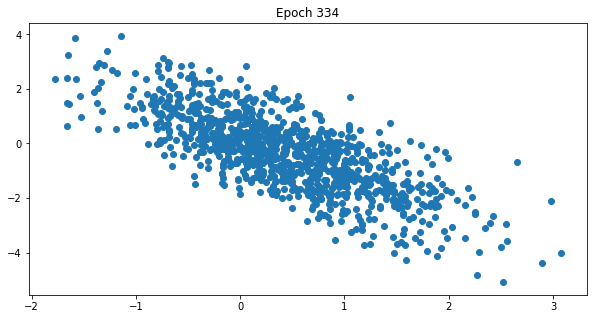

 34%|███▎      | 335/1000 [24:52<49:14,  4.44s/it]

 34%|███▎      | 336/1000 [24:56<48:19,  4.37s/it]

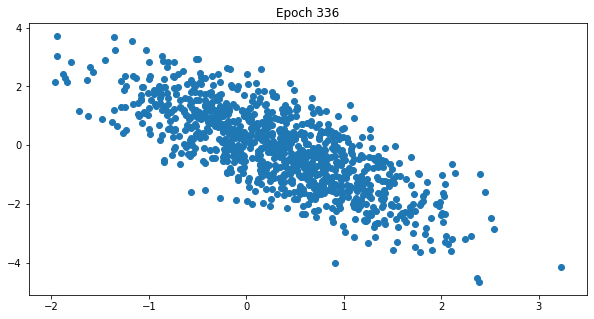

 34%|███▎      | 337/1000 [25:01<49:31,  4.48s/it]

 34%|███▍      | 338/1000 [25:05<48:45,  4.42s/it]

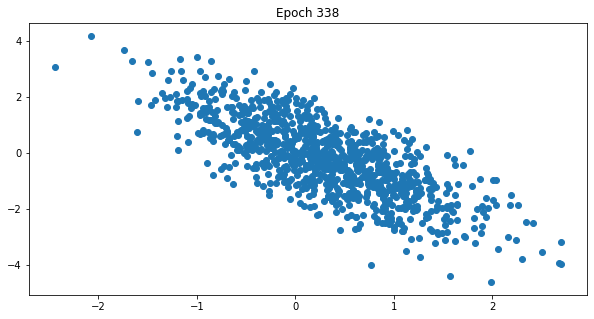

 34%|███▍      | 339/1000 [25:10<49:41,  4.51s/it]

 34%|███▍      | 340/1000 [25:14<48:40,  4.43s/it]

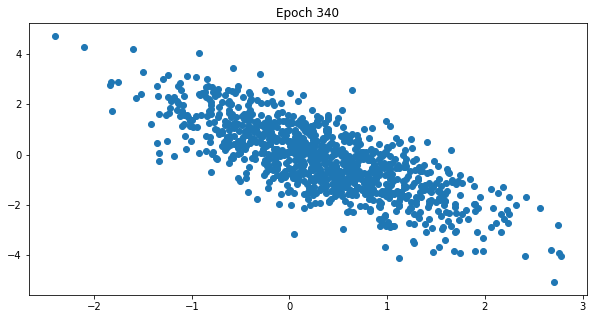

 34%|███▍      | 341/1000 [25:19<49:16,  4.49s/it]

 34%|███▍      | 342/1000 [25:23<48:16,  4.40s/it]

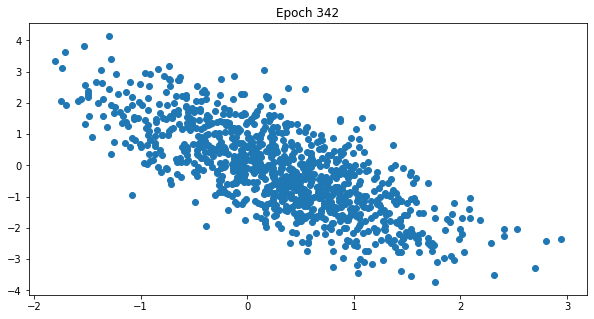

 34%|███▍      | 343/1000 [25:28<48:35,  4.44s/it]

 34%|███▍      | 344/1000 [25:32<47:39,  4.36s/it]

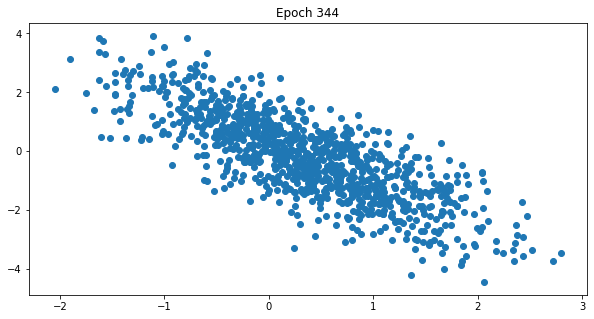

 34%|███▍      | 345/1000 [25:36<48:08,  4.41s/it]

 35%|███▍      | 346/1000 [25:40<47:24,  4.35s/it]

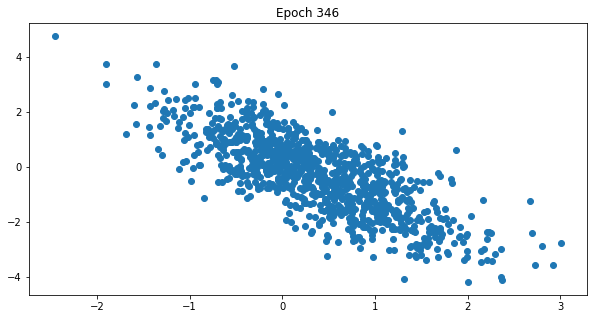

 35%|███▍      | 347/1000 [25:45<48:10,  4.43s/it]

 35%|███▍      | 348/1000 [25:49<47:22,  4.36s/it]

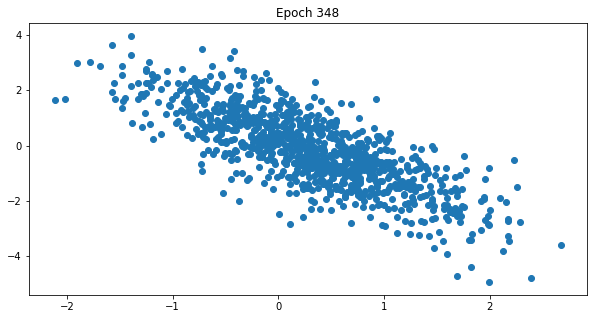

 35%|███▍      | 349/1000 [25:54<48:07,  4.44s/it]

 35%|███▌      | 350/1000 [25:58<47:34,  4.39s/it]

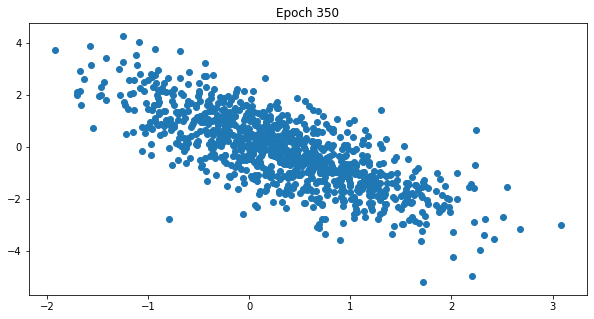

 35%|███▌      | 351/1000 [26:03<48:16,  4.46s/it]

 35%|███▌      | 352/1000 [26:07<47:13,  4.37s/it]

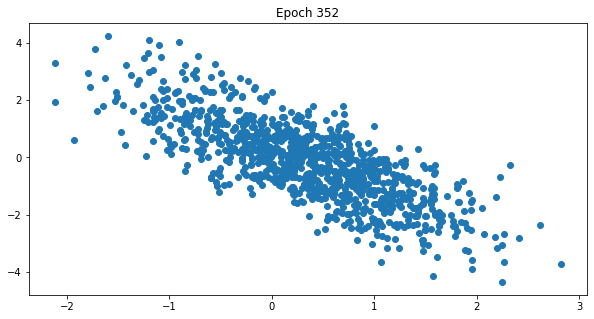

 35%|███▌      | 353/1000 [26:12<48:08,  4.46s/it]

 35%|███▌      | 354/1000 [26:16<47:34,  4.42s/it]

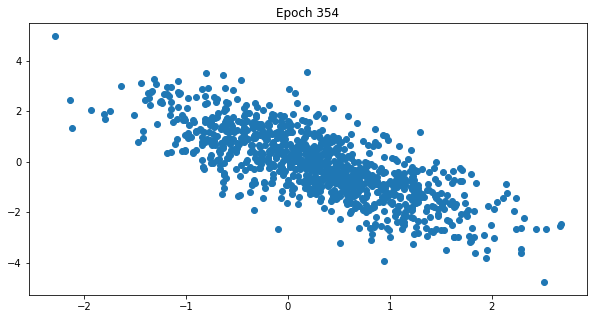

 36%|███▌      | 355/1000 [26:21<49:36,  4.62s/it]

 36%|███▌      | 356/1000 [26:25<48:44,  4.54s/it]

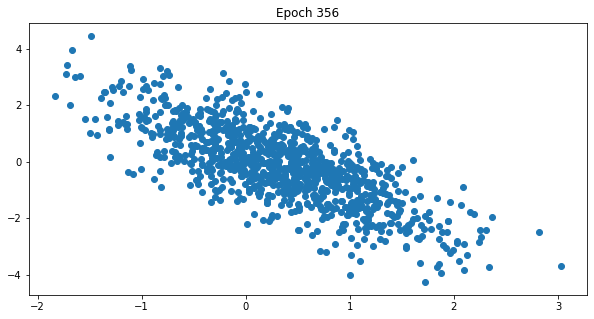

 36%|███▌      | 357/1000 [26:30<48:56,  4.57s/it]

 36%|███▌      | 358/1000 [26:34<47:36,  4.45s/it]

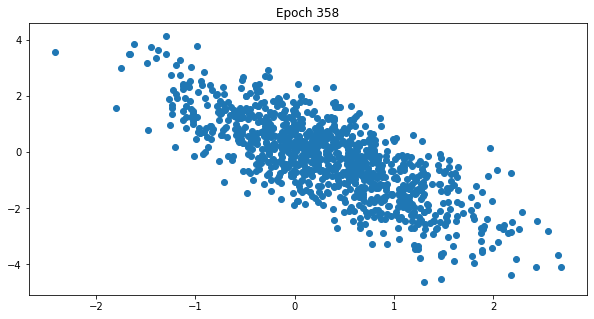

 36%|███▌      | 359/1000 [26:39<47:55,  4.49s/it]

 36%|███▌      | 360/1000 [26:43<46:51,  4.39s/it]

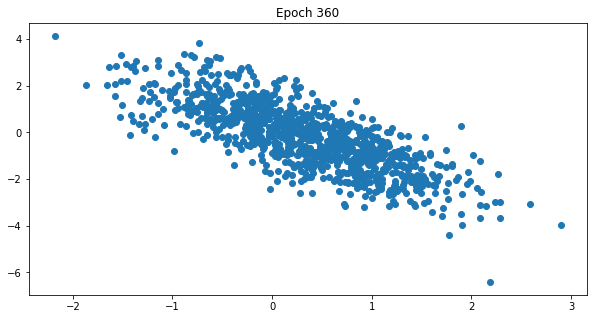

 36%|███▌      | 361/1000 [26:48<47:25,  4.45s/it]

 36%|███▌      | 362/1000 [26:52<46:56,  4.41s/it]

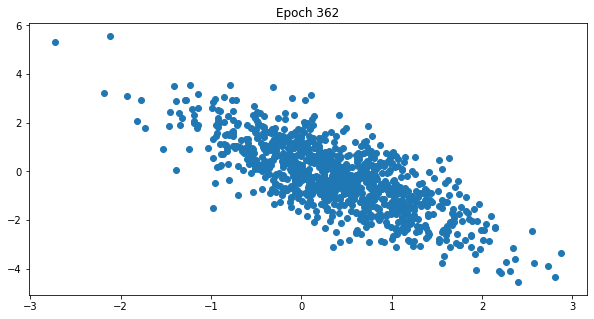

 36%|███▋      | 363/1000 [26:57<49:28,  4.66s/it]

 36%|███▋      | 364/1000 [27:01<48:01,  4.53s/it]

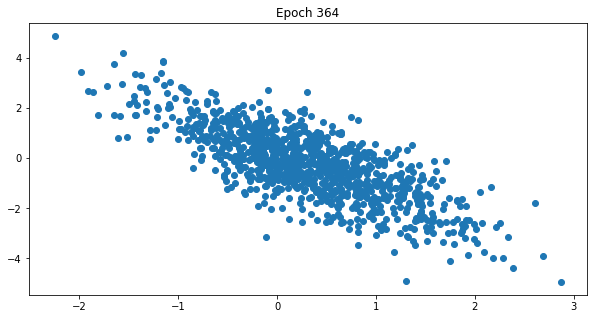

 36%|███▋      | 365/1000 [27:06<48:26,  4.58s/it]

 37%|███▋      | 366/1000 [27:10<47:48,  4.52s/it]

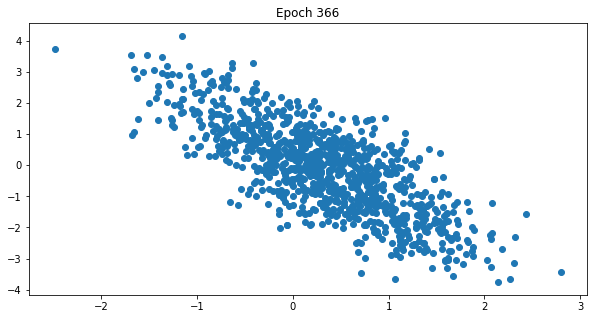

 37%|███▋      | 367/1000 [27:15<48:18,  4.58s/it]

 37%|███▋      | 368/1000 [27:19<47:18,  4.49s/it]

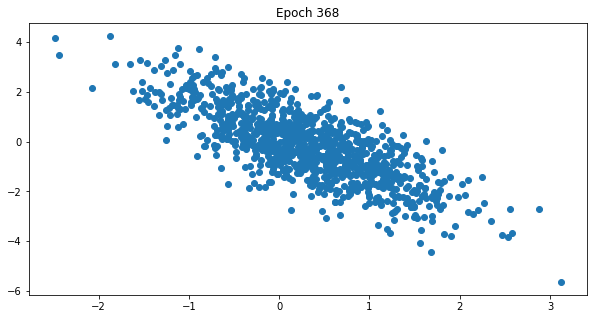

 37%|███▋      | 369/1000 [27:24<47:41,  4.54s/it]

 37%|███▋      | 370/1000 [27:28<46:30,  4.43s/it]

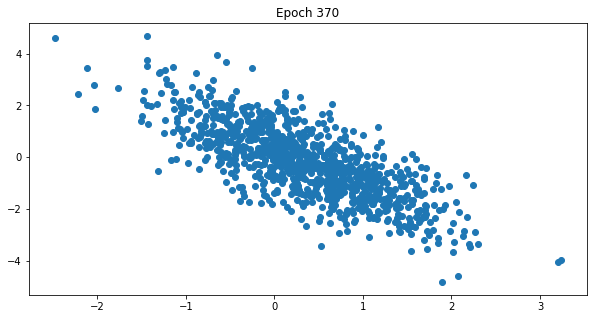

 37%|███▋      | 371/1000 [27:33<46:47,  4.46s/it]

 37%|███▋      | 372/1000 [27:37<45:58,  4.39s/it]

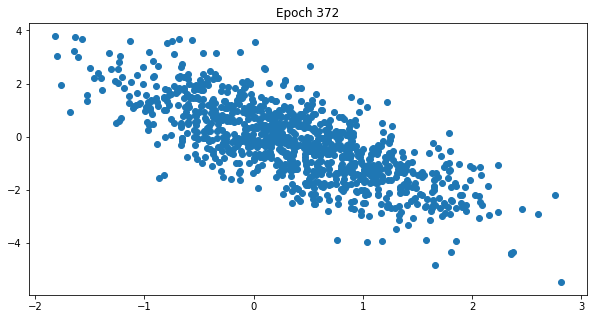

 37%|███▋      | 373/1000 [27:42<46:46,  4.48s/it]

 37%|███▋      | 374/1000 [27:46<46:01,  4.41s/it]

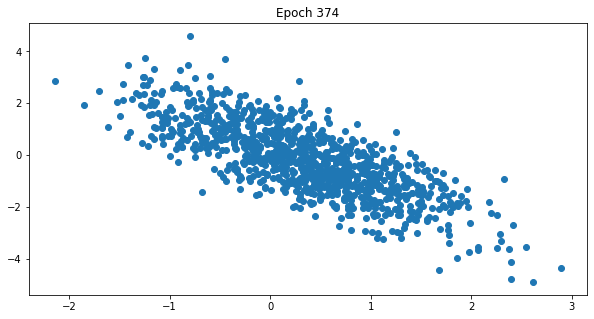

 38%|███▊      | 375/1000 [27:51<48:01,  4.61s/it]

 38%|███▊      | 376/1000 [27:55<46:59,  4.52s/it]

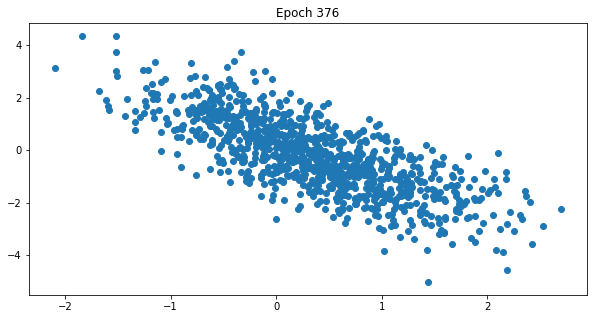

 38%|███▊      | 377/1000 [28:00<48:06,  4.63s/it]

 38%|███▊      | 378/1000 [28:05<47:03,  4.54s/it]

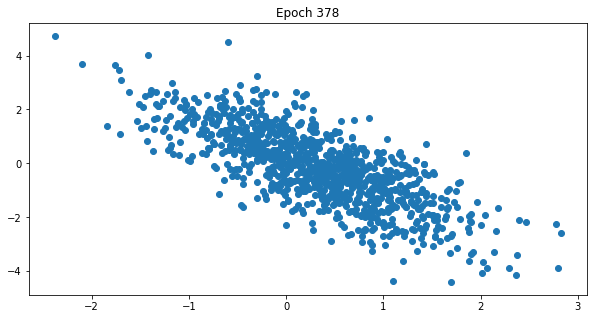

 38%|███▊      | 379/1000 [28:09<46:59,  4.54s/it]

 38%|███▊      | 380/1000 [28:13<46:11,  4.47s/it]

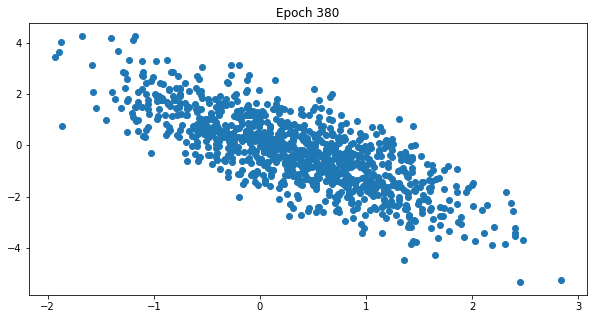

 38%|███▊      | 381/1000 [28:18<46:41,  4.53s/it]

 38%|███▊      | 382/1000 [28:22<45:59,  4.47s/it]

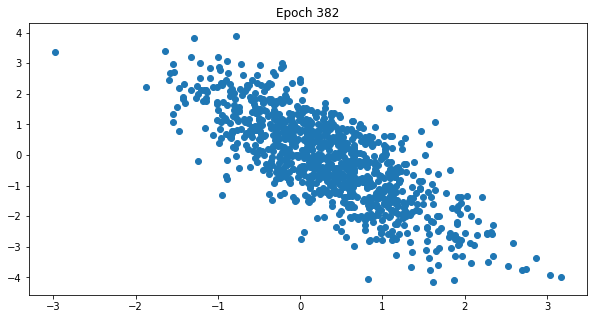

 38%|███▊      | 383/1000 [28:27<46:15,  4.50s/it]

 38%|███▊      | 384/1000 [28:31<45:23,  4.42s/it]

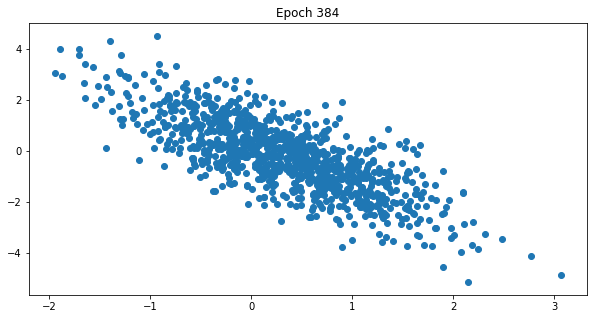

 38%|███▊      | 385/1000 [28:36<45:42,  4.46s/it]

 39%|███▊      | 386/1000 [28:40<44:52,  4.39s/it]

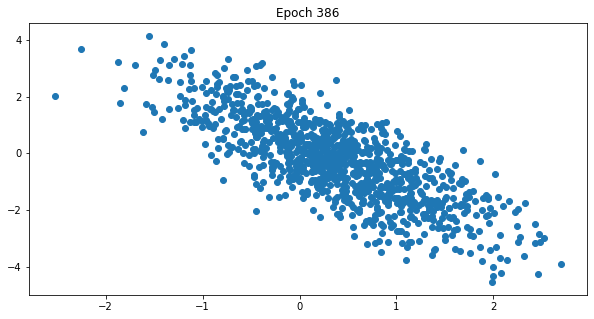

 39%|███▊      | 387/1000 [28:45<47:01,  4.60s/it]

 39%|███▉      | 388/1000 [28:49<46:07,  4.52s/it]

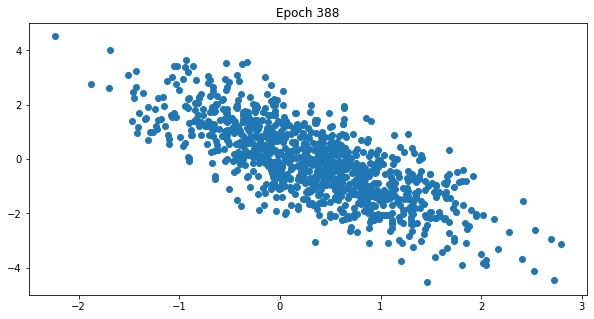

 39%|███▉      | 389/1000 [28:54<46:16,  4.54s/it]

 39%|███▉      | 390/1000 [28:58<45:41,  4.50s/it]

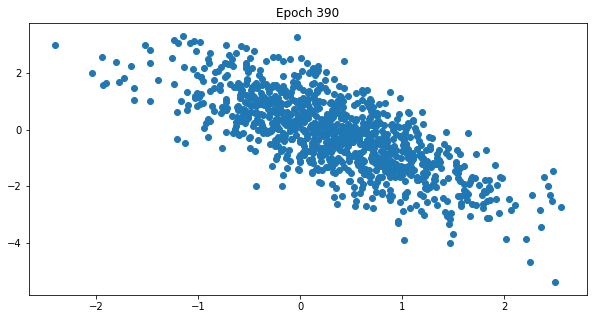

 39%|███▉      | 391/1000 [29:03<46:07,  4.54s/it]

 39%|███▉      | 392/1000 [29:07<45:12,  4.46s/it]

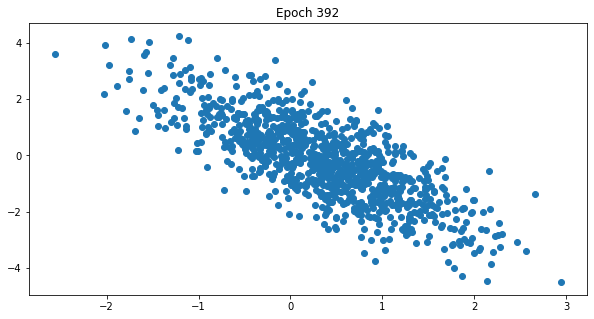

 39%|███▉      | 393/1000 [29:12<45:42,  4.52s/it]

 39%|███▉      | 394/1000 [29:16<45:14,  4.48s/it]

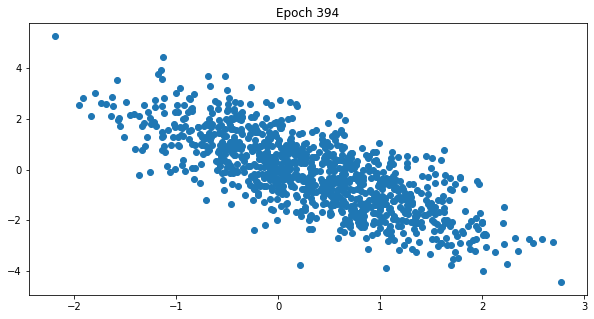

 40%|███▉      | 395/1000 [29:21<45:26,  4.51s/it]

 40%|███▉      | 396/1000 [29:25<44:35,  4.43s/it]

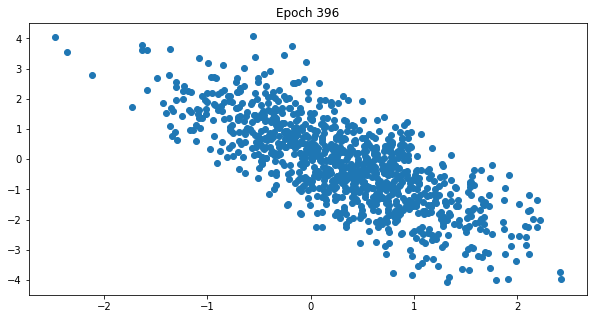

 40%|███▉      | 397/1000 [29:30<45:03,  4.48s/it]

 40%|███▉      | 398/1000 [29:34<44:24,  4.43s/it]

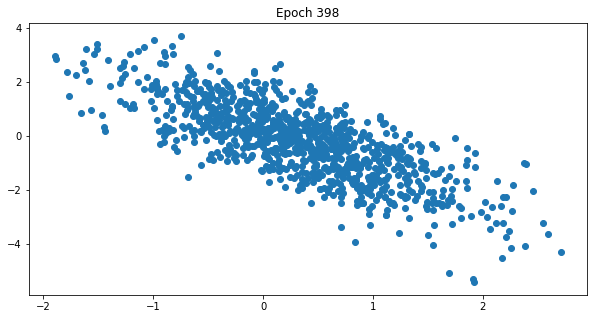

 40%|███▉      | 399/1000 [29:39<46:12,  4.61s/it]

 40%|████      | 400/1000 [29:43<45:08,  4.51s/it]

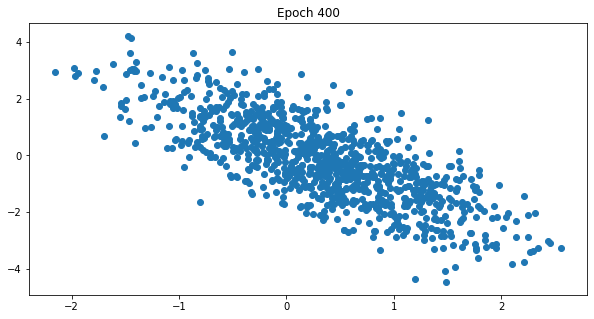

 40%|████      | 401/1000 [29:48<45:29,  4.56s/it]

 40%|████      | 402/1000 [29:52<44:22,  4.45s/it]

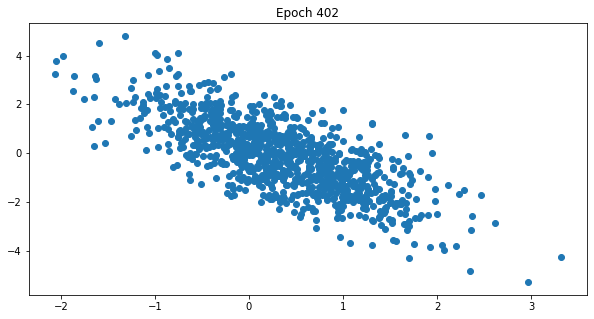

 40%|████      | 403/1000 [29:57<44:29,  4.47s/it]

 40%|████      | 404/1000 [30:01<43:45,  4.41s/it]

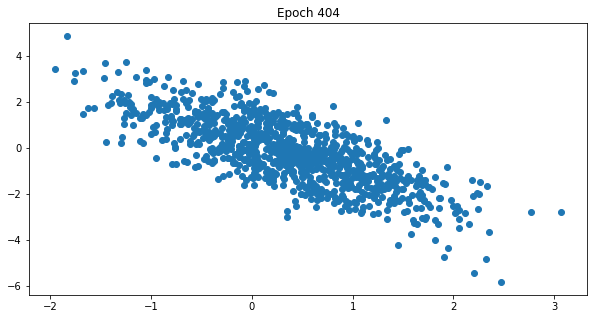

 40%|████      | 405/1000 [30:06<44:07,  4.45s/it]

 41%|████      | 406/1000 [30:10<43:30,  4.40s/it]

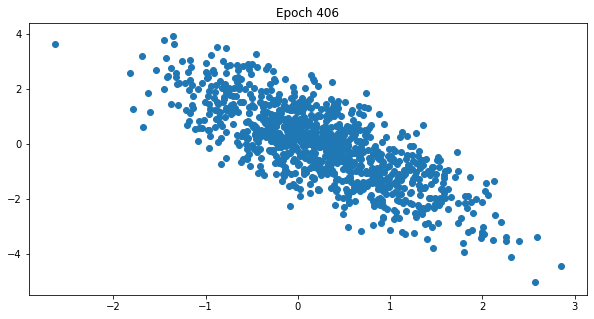

 41%|████      | 407/1000 [30:14<44:05,  4.46s/it]

 41%|████      | 408/1000 [30:19<43:15,  4.39s/it]

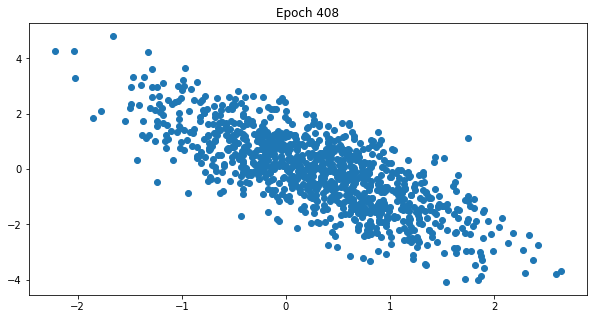

 41%|████      | 409/1000 [30:23<43:49,  4.45s/it]

 41%|████      | 410/1000 [30:27<43:05,  4.38s/it]

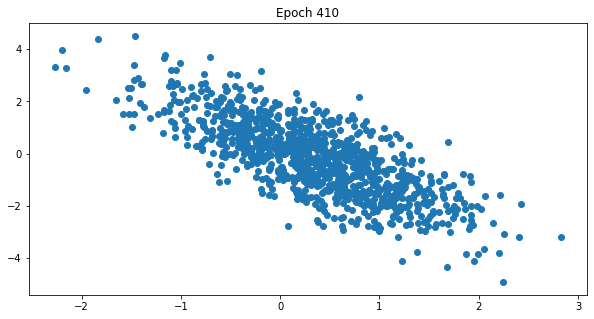

 41%|████      | 411/1000 [30:32<43:47,  4.46s/it]

 41%|████      | 412/1000 [30:36<42:59,  4.39s/it]

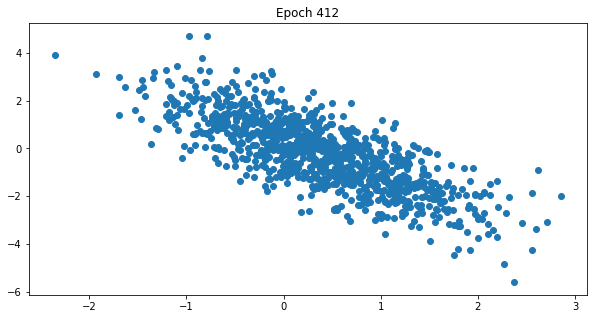

 41%|████▏     | 413/1000 [30:41<43:39,  4.46s/it]

 41%|████▏     | 414/1000 [30:45<42:56,  4.40s/it]

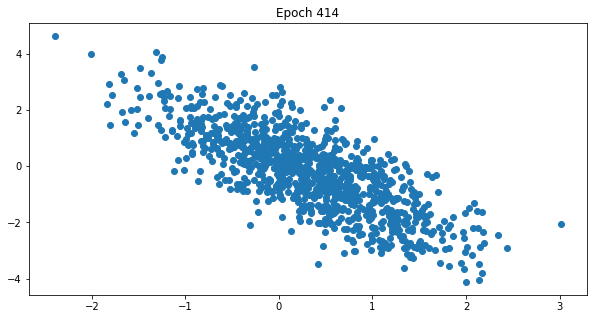

 42%|████▏     | 415/1000 [30:50<43:51,  4.50s/it]

 42%|████▏     | 416/1000 [30:54<43:04,  4.43s/it]

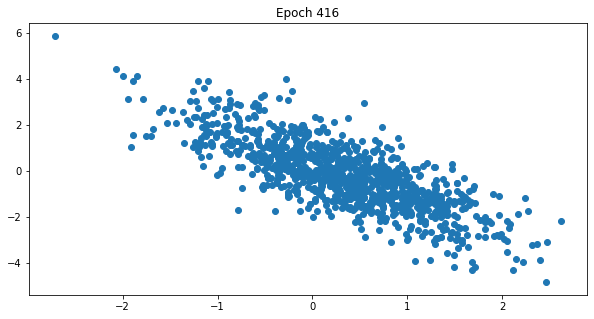

 42%|████▏     | 417/1000 [30:59<45:03,  4.64s/it]

 42%|████▏     | 418/1000 [31:04<43:58,  4.53s/it]

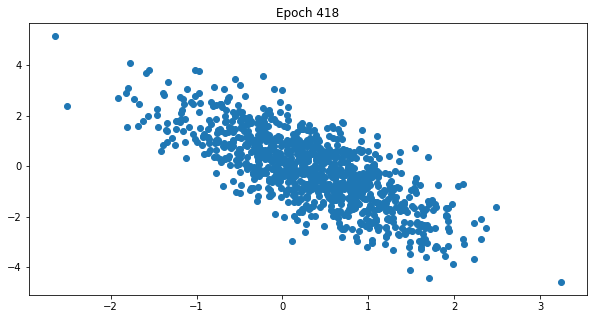

 42%|████▏     | 419/1000 [31:08<44:28,  4.59s/it]

 42%|████▏     | 420/1000 [31:13<43:21,  4.48s/it]

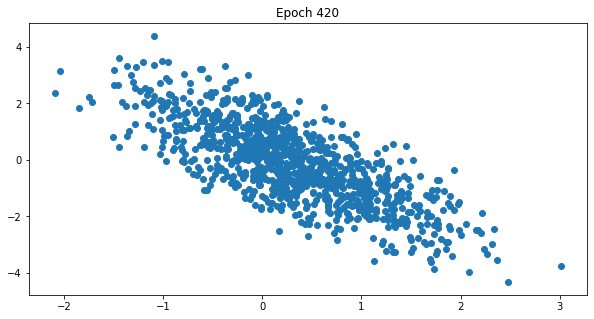

 42%|████▏     | 421/1000 [31:17<43:33,  4.51s/it]

 42%|████▏     | 422/1000 [31:21<42:30,  4.41s/it]

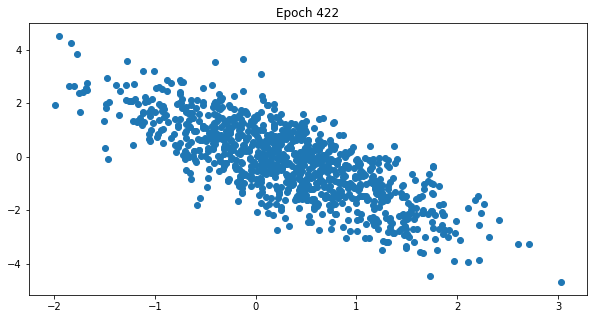

 42%|████▏     | 423/1000 [31:26<42:56,  4.47s/it]

 42%|████▏     | 424/1000 [31:30<42:11,  4.40s/it]

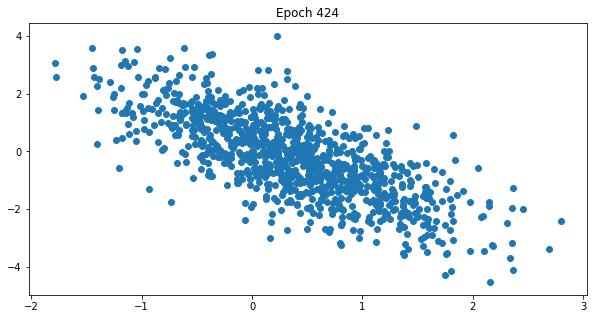

 42%|████▎     | 425/1000 [31:35<43:01,  4.49s/it]

 43%|████▎     | 426/1000 [31:39<42:14,  4.42s/it]

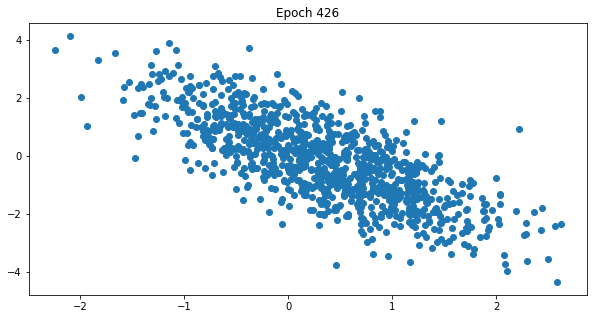

 43%|████▎     | 427/1000 [31:44<42:32,  4.46s/it]

 43%|████▎     | 428/1000 [31:48<42:01,  4.41s/it]

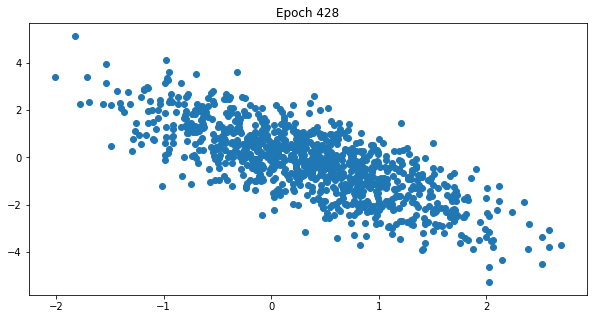

 43%|████▎     | 429/1000 [31:53<42:39,  4.48s/it]

 43%|████▎     | 430/1000 [31:57<42:10,  4.44s/it]

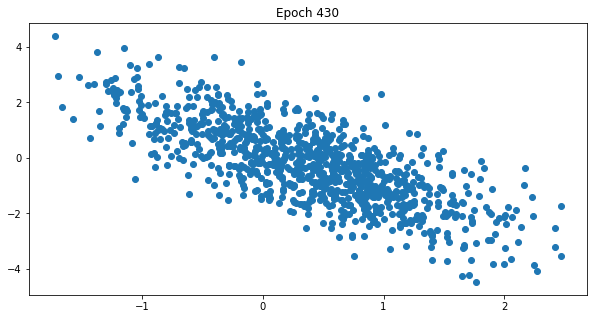

 43%|████▎     | 431/1000 [32:02<44:03,  4.65s/it]

 43%|████▎     | 432/1000 [32:06<42:44,  4.52s/it]

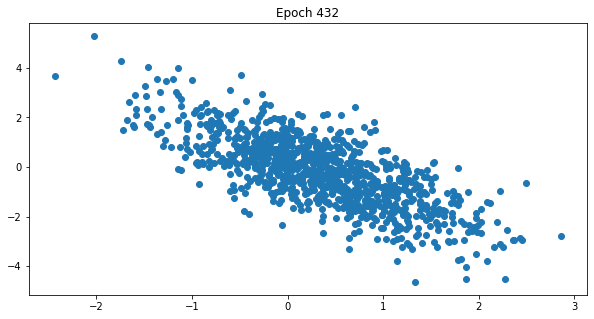

 43%|████▎     | 433/1000 [32:11<43:05,  4.56s/it]

 43%|████▎     | 434/1000 [32:15<42:00,  4.45s/it]

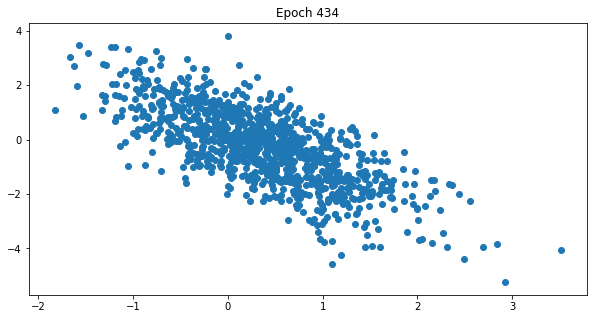

 44%|████▎     | 435/1000 [32:20<42:26,  4.51s/it]

 44%|████▎     | 436/1000 [32:24<41:41,  4.43s/it]

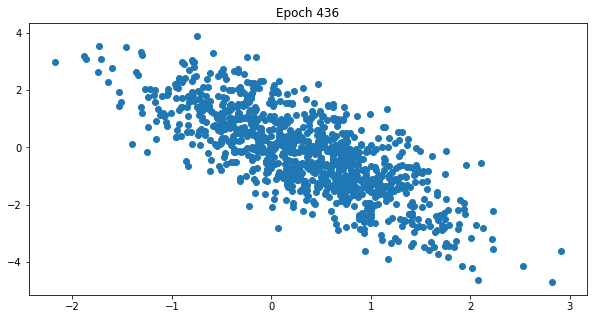

 44%|████▎     | 437/1000 [32:29<42:19,  4.51s/it]

 44%|████▍     | 438/1000 [32:33<41:29,  4.43s/it]

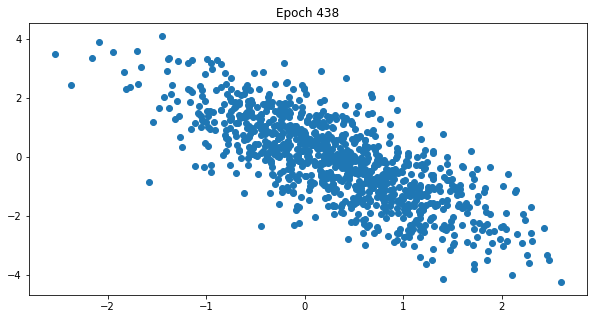

 44%|████▍     | 439/1000 [32:38<41:52,  4.48s/it]

 44%|████▍     | 440/1000 [32:42<41:12,  4.42s/it]

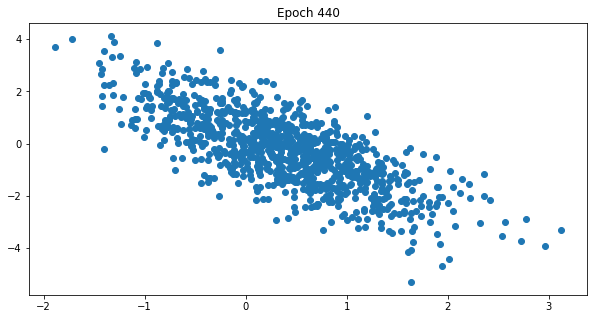

 44%|████▍     | 441/1000 [32:46<41:49,  4.49s/it]

 44%|████▍     | 442/1000 [32:51<41:05,  4.42s/it]

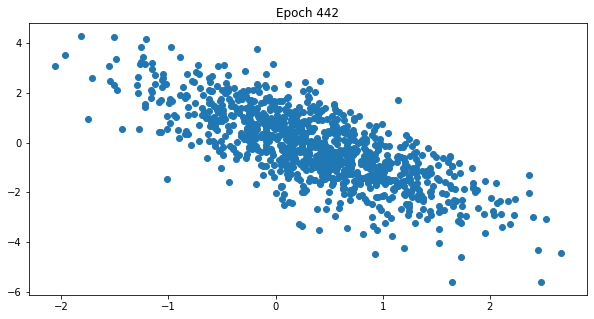

 44%|████▍     | 443/1000 [32:56<42:50,  4.61s/it]

 44%|████▍     | 444/1000 [33:00<41:46,  4.51s/it]

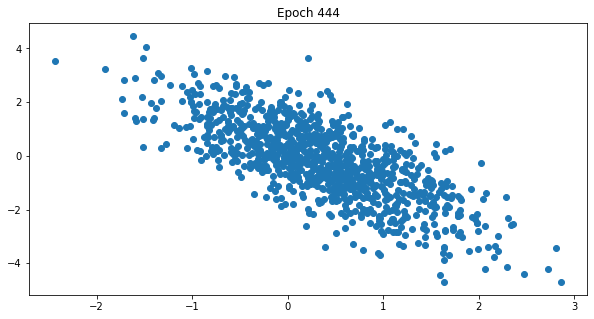

 44%|████▍     | 445/1000 [33:05<41:59,  4.54s/it]

 45%|████▍     | 446/1000 [33:09<40:59,  4.44s/it]

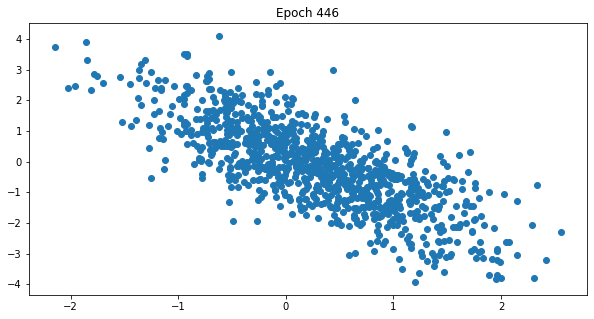

 45%|████▍     | 447/1000 [33:14<41:34,  4.51s/it]

 45%|████▍     | 448/1000 [33:18<41:14,  4.48s/it]

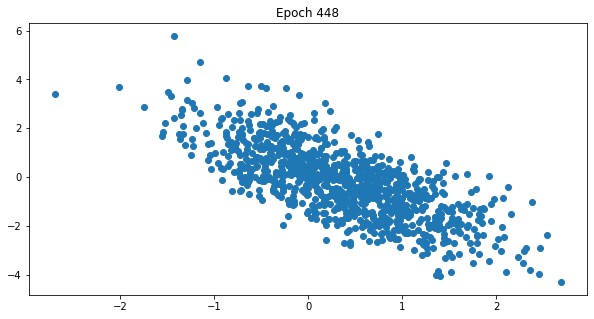

 45%|████▍     | 449/1000 [33:23<41:45,  4.55s/it]

 45%|████▌     | 450/1000 [33:27<40:54,  4.46s/it]

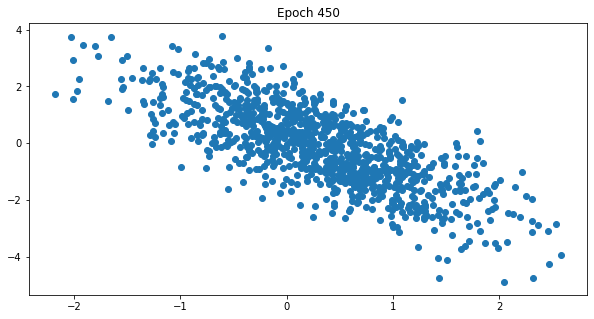

 45%|████▌     | 451/1000 [33:32<41:21,  4.52s/it]

 45%|████▌     | 452/1000 [33:36<40:25,  4.43s/it]

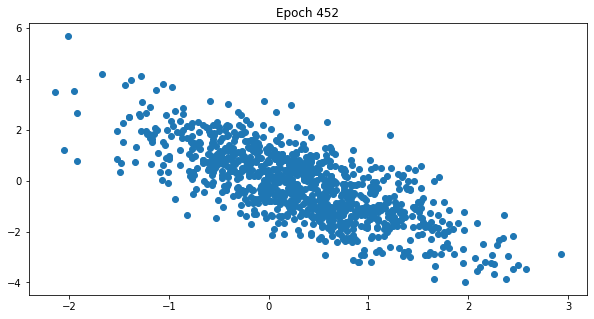

 45%|████▌     | 453/1000 [33:40<40:40,  4.46s/it]

 45%|████▌     | 454/1000 [33:45<39:51,  4.38s/it]

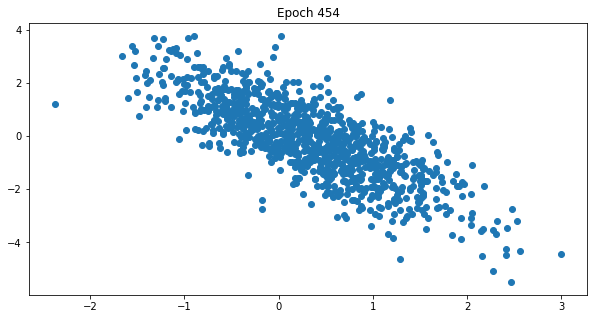

 46%|████▌     | 455/1000 [33:49<40:42,  4.48s/it]

 46%|████▌     | 456/1000 [33:54<39:57,  4.41s/it]

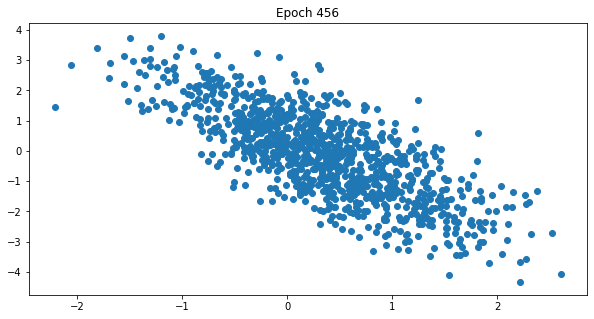

 46%|████▌     | 457/1000 [33:59<42:14,  4.67s/it]

 46%|████▌     | 458/1000 [34:03<41:01,  4.54s/it]

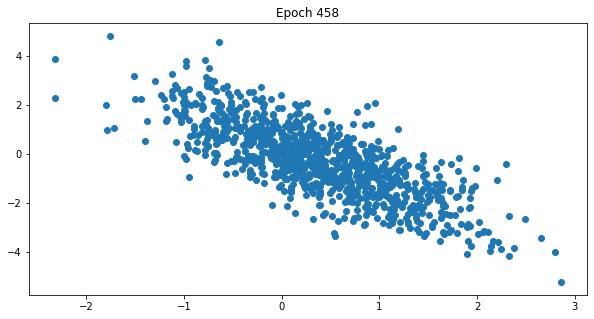

 46%|████▌     | 459/1000 [34:08<41:14,  4.57s/it]

 46%|████▌     | 460/1000 [34:12<40:19,  4.48s/it]

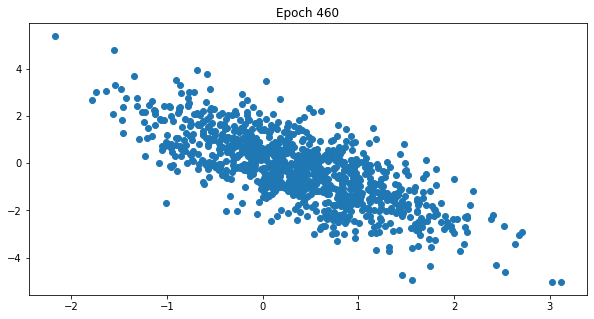

 46%|████▌     | 461/1000 [34:17<40:37,  4.52s/it]

 46%|████▌     | 462/1000 [34:21<39:55,  4.45s/it]

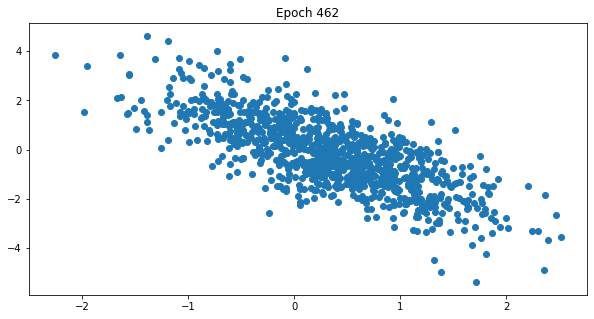

 46%|████▋     | 463/1000 [34:26<40:24,  4.52s/it]

 46%|████▋     | 464/1000 [34:30<39:46,  4.45s/it]

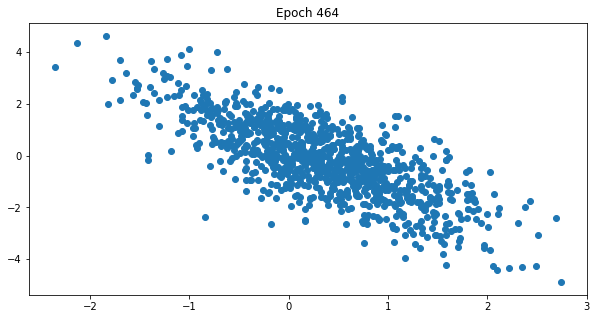

 46%|████▋     | 465/1000 [34:34<39:53,  4.47s/it]

 47%|████▋     | 466/1000 [34:39<39:07,  4.40s/it]

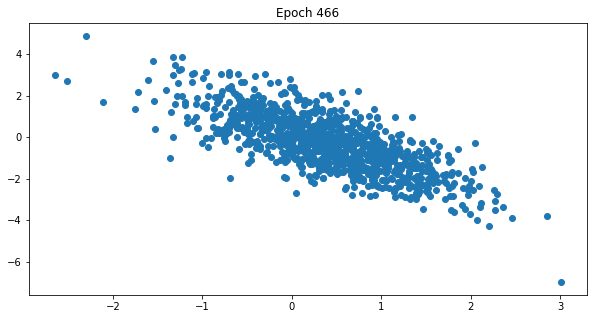

 47%|████▋     | 467/1000 [34:43<39:33,  4.45s/it]

 47%|████▋     | 468/1000 [34:47<38:54,  4.39s/it]

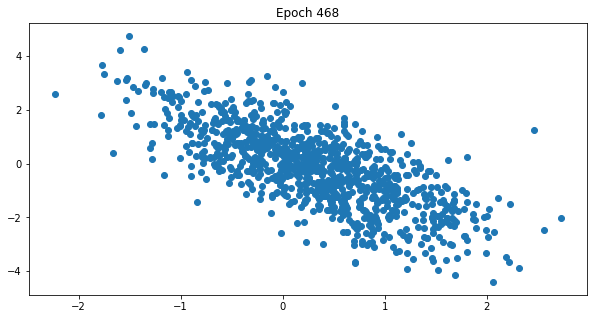

 47%|████▋     | 469/1000 [34:52<39:07,  4.42s/it]

 47%|████▋     | 470/1000 [34:56<38:24,  4.35s/it]

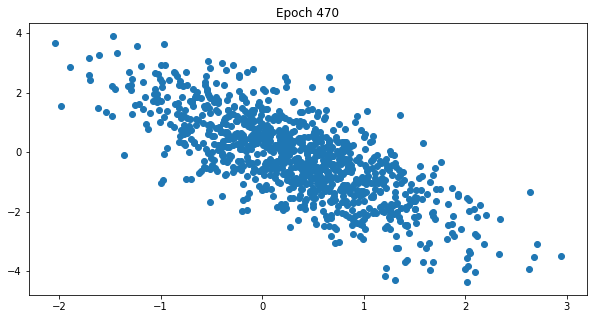

 47%|████▋     | 471/1000 [35:01<38:57,  4.42s/it]

 47%|████▋     | 472/1000 [35:05<38:30,  4.38s/it]

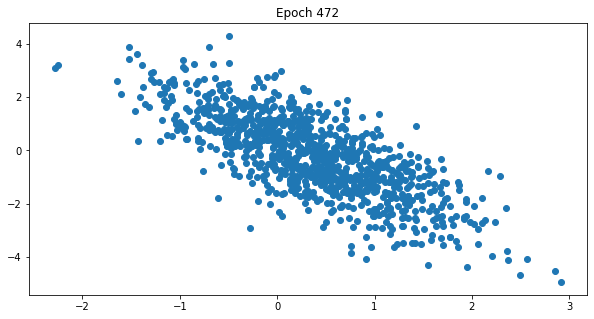

 47%|████▋     | 473/1000 [35:09<38:53,  4.43s/it]

 47%|████▋     | 474/1000 [35:14<38:19,  4.37s/it]

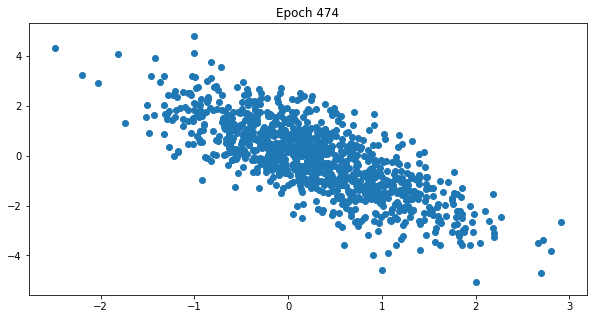

 48%|████▊     | 475/1000 [35:18<38:59,  4.46s/it]

 48%|████▊     | 476/1000 [35:23<38:08,  4.37s/it]

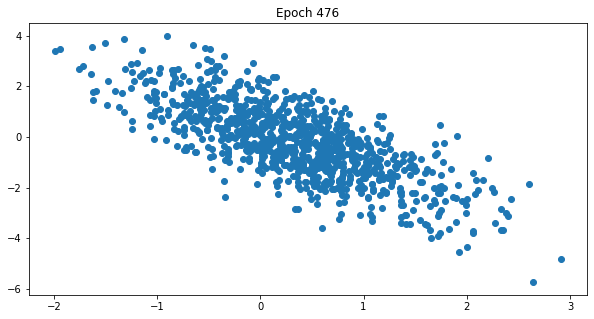

 48%|████▊     | 477/1000 [35:27<38:35,  4.43s/it]

 48%|████▊     | 478/1000 [35:31<38:08,  4.38s/it]

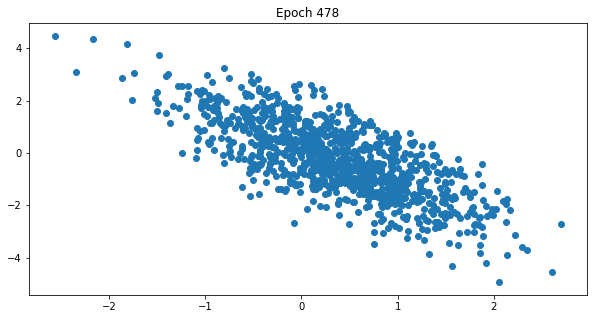

 48%|████▊     | 479/1000 [35:36<38:37,  4.45s/it]

 48%|████▊     | 480/1000 [35:40<38:29,  4.44s/it]

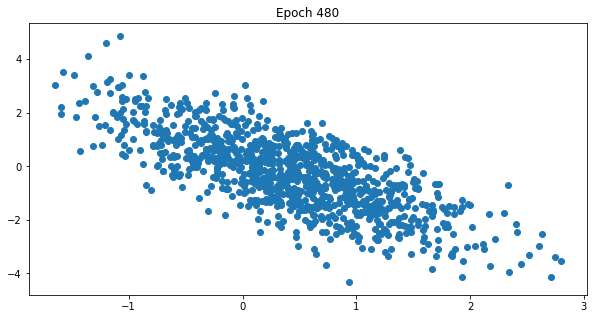

 48%|████▊     | 481/1000 [35:45<39:54,  4.61s/it]

 48%|████▊     | 482/1000 [35:50<39:04,  4.53s/it]

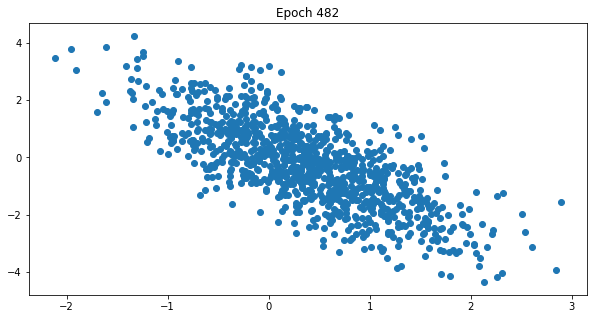

 48%|████▊     | 483/1000 [35:54<39:09,  4.54s/it]

 48%|████▊     | 484/1000 [35:59<38:26,  4.47s/it]

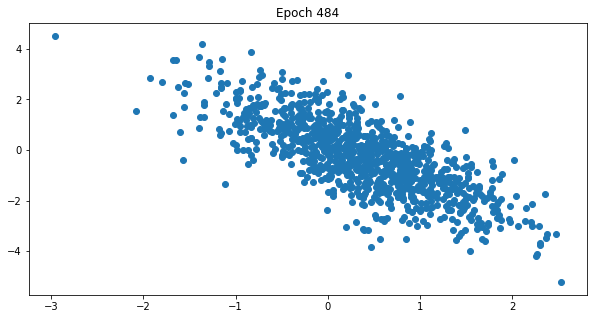

 48%|████▊     | 485/1000 [36:03<38:53,  4.53s/it]

 49%|████▊     | 486/1000 [36:08<38:02,  4.44s/it]

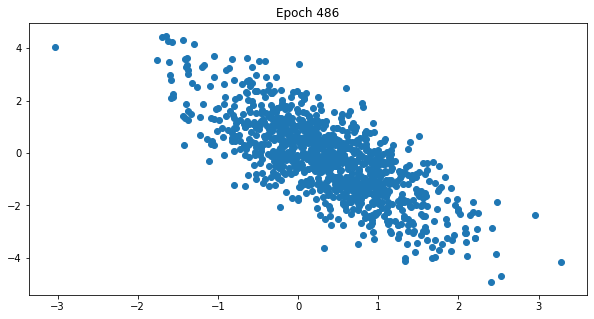

 49%|████▊     | 487/1000 [36:12<38:36,  4.52s/it]

 49%|████▉     | 488/1000 [36:16<37:58,  4.45s/it]

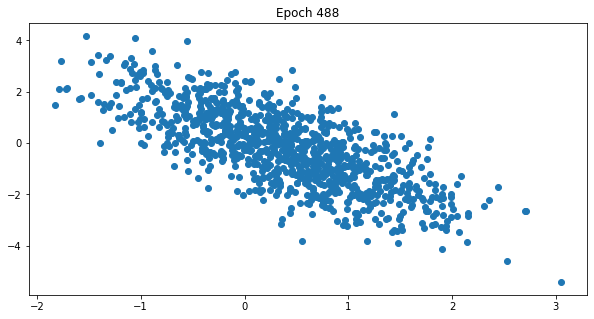

 49%|████▉     | 489/1000 [36:21<38:23,  4.51s/it]

 49%|████▉     | 490/1000 [36:25<37:41,  4.43s/it]

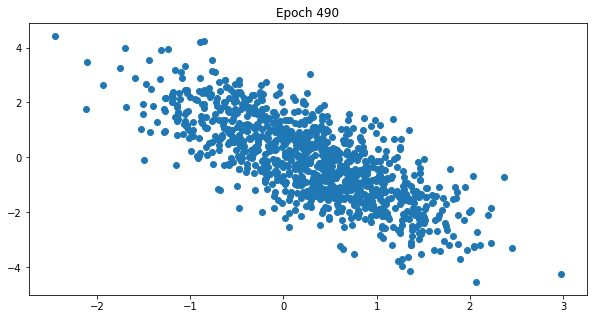

 49%|████▉     | 491/1000 [36:30<38:17,  4.51s/it]

 49%|████▉     | 492/1000 [36:34<37:30,  4.43s/it]

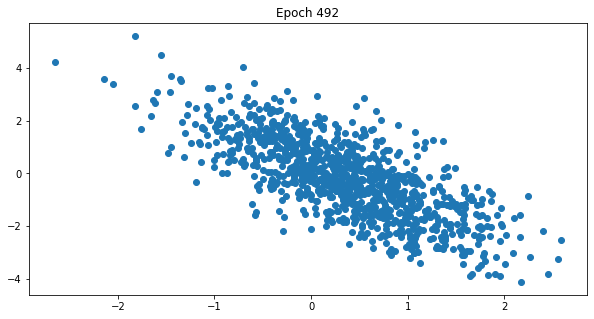

 49%|████▉     | 493/1000 [36:39<39:06,  4.63s/it]

 49%|████▉     | 494/1000 [36:44<38:12,  4.53s/it]

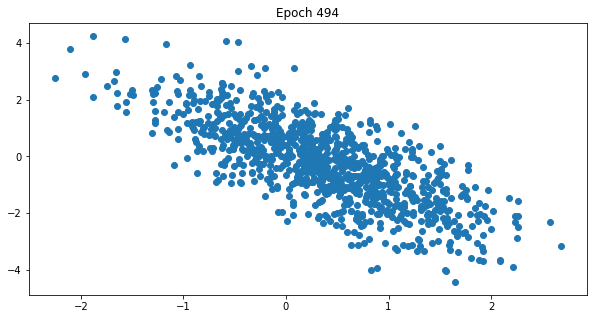

 50%|████▉     | 495/1000 [36:49<38:52,  4.62s/it]

 50%|████▉     | 496/1000 [36:53<37:53,  4.51s/it]

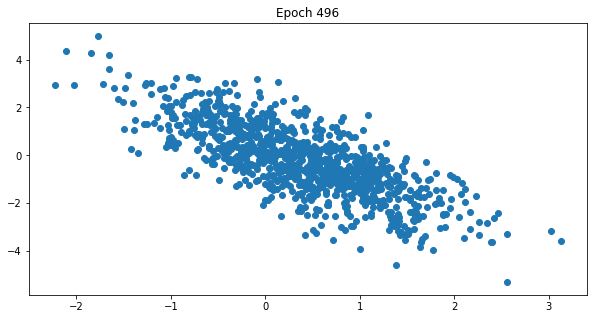

 50%|████▉     | 497/1000 [36:57<38:08,  4.55s/it]

 50%|████▉     | 498/1000 [37:02<37:23,  4.47s/it]

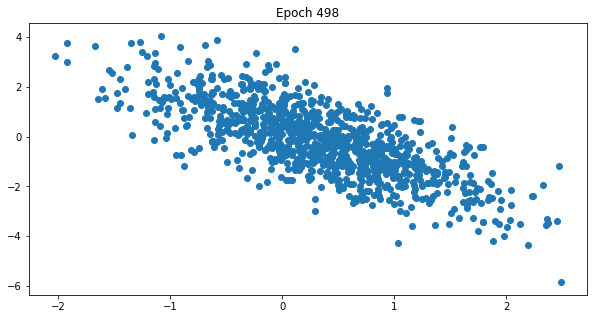

 50%|████▉     | 499/1000 [37:06<37:26,  4.49s/it]

 50%|█████     | 500/1000 [37:11<36:59,  4.44s/it]

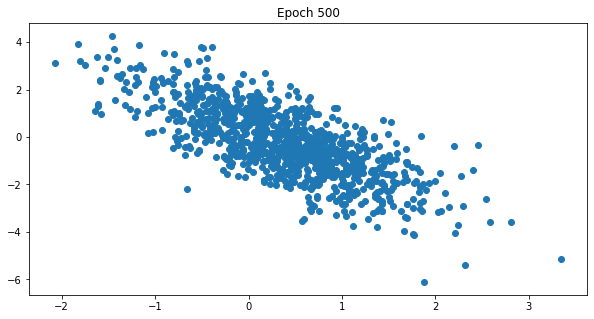

 50%|█████     | 501/1000 [37:15<37:16,  4.48s/it]

 50%|█████     | 502/1000 [37:19<36:37,  4.41s/it]

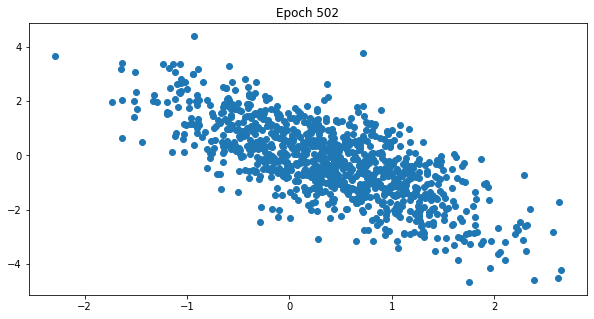

 50%|█████     | 503/1000 [37:24<37:09,  4.49s/it]

 50%|█████     | 504/1000 [37:28<36:37,  4.43s/it]

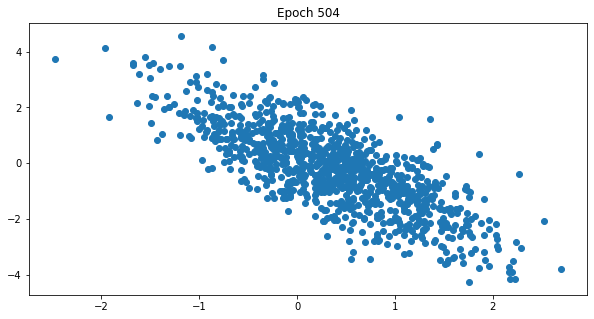

 50%|█████     | 505/1000 [37:34<38:20,  4.65s/it]

 51%|█████     | 506/1000 [37:38<37:32,  4.56s/it]

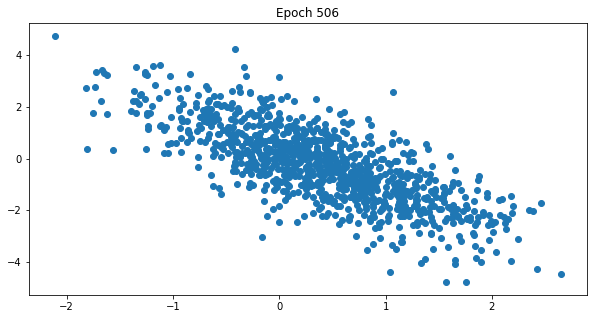

 51%|█████     | 507/1000 [37:42<37:21,  4.55s/it]

 51%|█████     | 508/1000 [37:47<36:31,  4.45s/it]

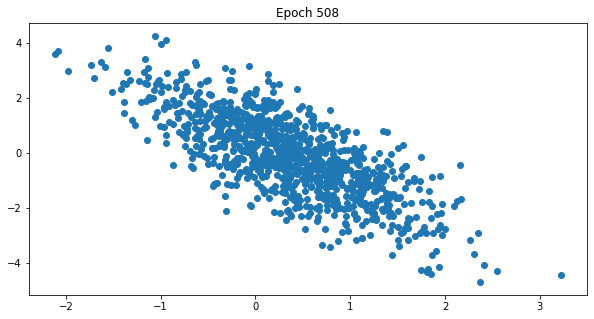

 51%|█████     | 509/1000 [37:51<37:01,  4.53s/it]

 51%|█████     | 510/1000 [37:56<36:42,  4.50s/it]

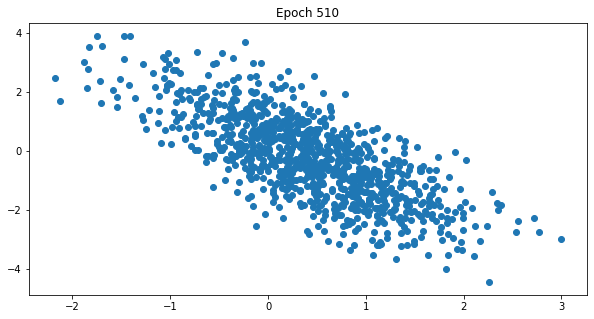

 51%|█████     | 511/1000 [38:01<37:21,  4.58s/it]

 51%|█████     | 512/1000 [38:05<36:49,  4.53s/it]

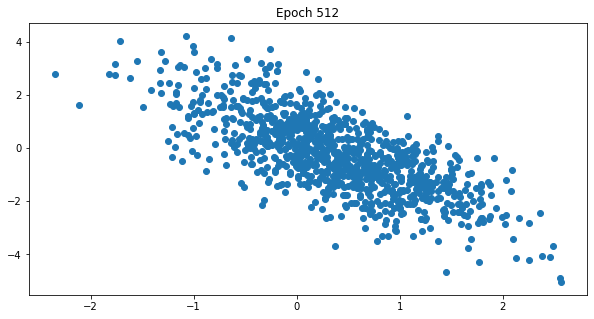

 51%|█████▏    | 513/1000 [38:10<37:40,  4.64s/it]

 51%|█████▏    | 514/1000 [38:14<37:02,  4.57s/it]

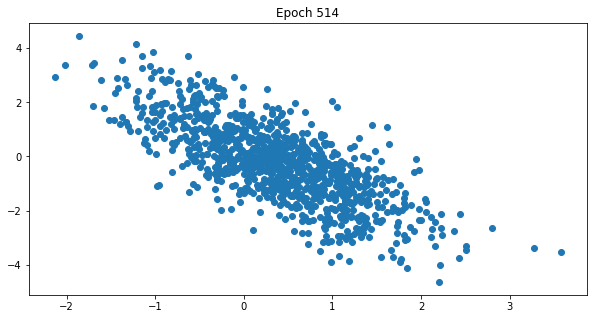

 52%|█████▏    | 515/1000 [38:20<38:41,  4.79s/it]

 52%|█████▏    | 516/1000 [38:24<37:46,  4.68s/it]

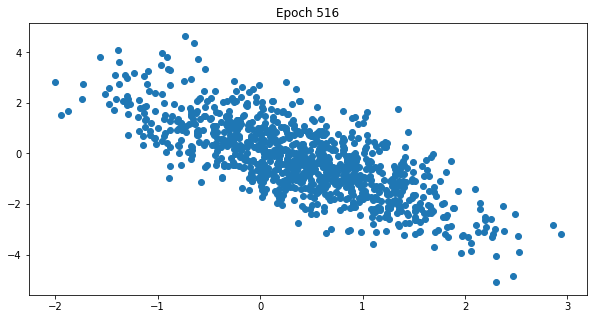

 52%|█████▏    | 517/1000 [38:29<38:04,  4.73s/it]

 52%|█████▏    | 518/1000 [38:33<36:54,  4.59s/it]

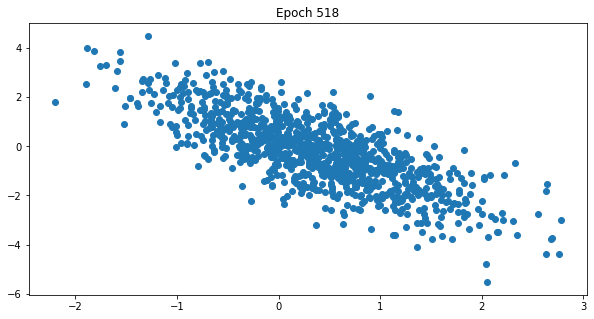

 52%|█████▏    | 519/1000 [38:38<37:05,  4.63s/it]

 52%|█████▏    | 520/1000 [38:42<36:11,  4.52s/it]

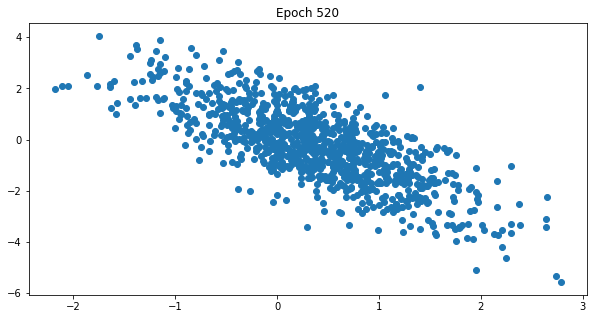

 52%|█████▏    | 521/1000 [38:47<36:14,  4.54s/it]

 52%|█████▏    | 522/1000 [38:51<35:35,  4.47s/it]

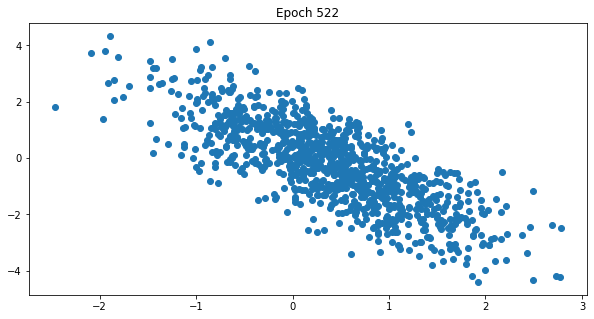

 52%|█████▏    | 523/1000 [38:56<36:02,  4.53s/it]

 52%|█████▏    | 524/1000 [39:00<35:29,  4.47s/it]

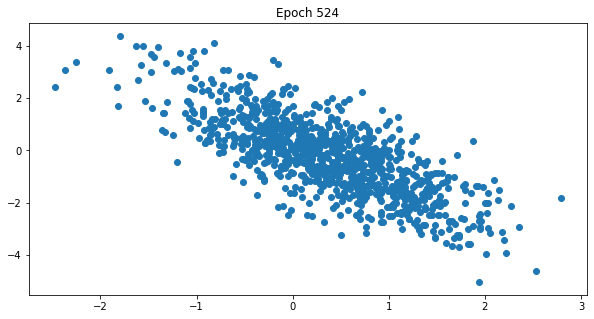

 52%|█████▎    | 525/1000 [39:05<37:03,  4.68s/it]

 53%|█████▎    | 526/1000 [39:09<36:08,  4.57s/it]

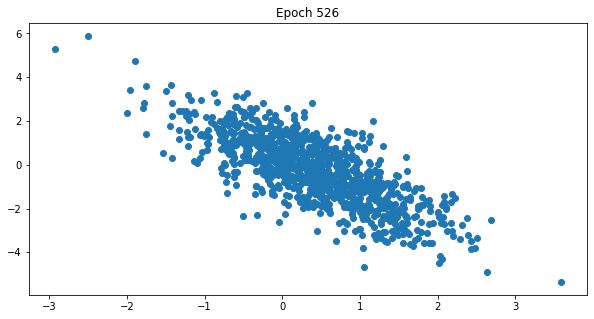

 53%|█████▎    | 527/1000 [39:14<36:03,  4.57s/it]

 53%|█████▎    | 528/1000 [39:18<35:22,  4.50s/it]

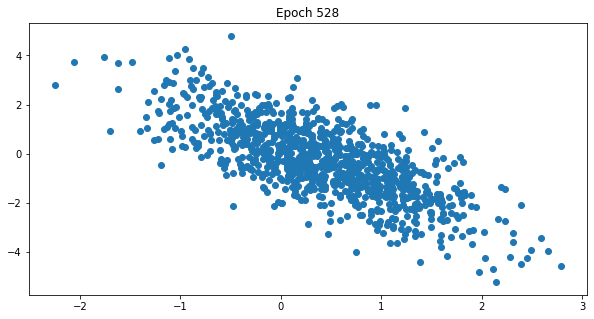

 53%|█████▎    | 529/1000 [39:23<35:31,  4.53s/it]

 53%|█████▎    | 530/1000 [39:27<34:50,  4.45s/it]

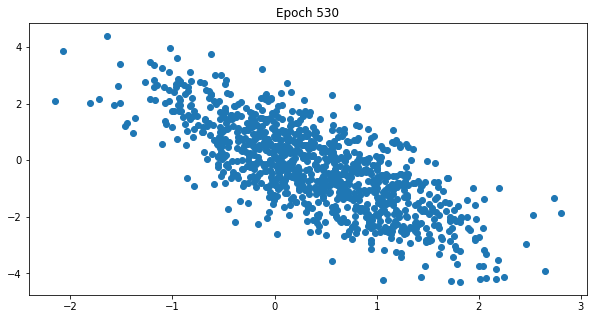

 53%|█████▎    | 531/1000 [39:32<35:08,  4.50s/it]

 53%|█████▎    | 532/1000 [39:36<34:33,  4.43s/it]

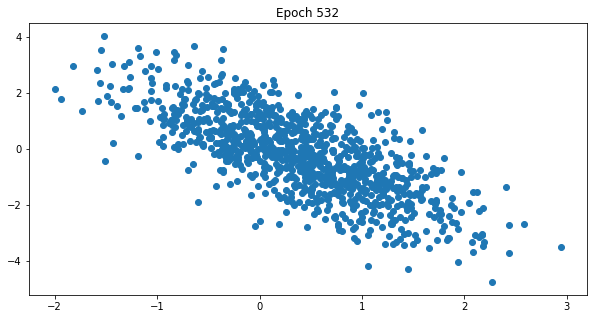

 53%|█████▎    | 533/1000 [39:41<35:56,  4.62s/it]

 53%|█████▎    | 534/1000 [39:45<35:03,  4.51s/it]

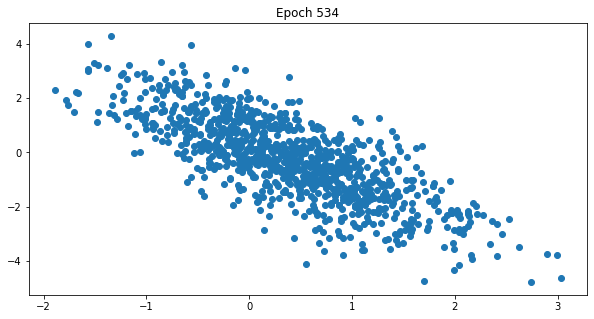

 54%|█████▎    | 535/1000 [39:50<35:19,  4.56s/it]

 54%|█████▎    | 536/1000 [39:54<34:29,  4.46s/it]

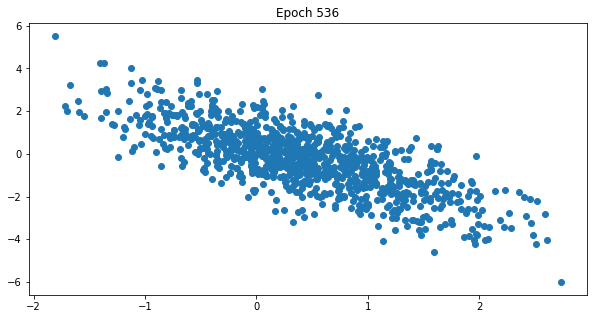

 54%|█████▎    | 537/1000 [39:59<35:09,  4.56s/it]

 54%|█████▍    | 538/1000 [40:03<34:28,  4.48s/it]

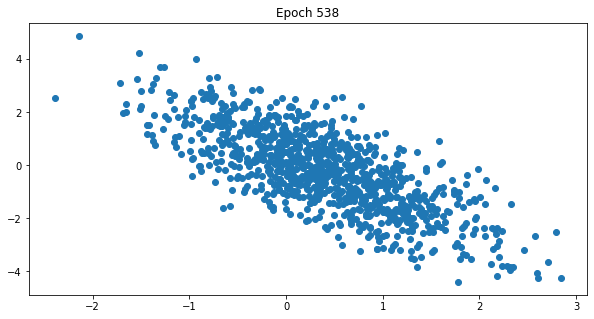

 54%|█████▍    | 539/1000 [40:08<34:37,  4.51s/it]

 54%|█████▍    | 540/1000 [40:12<33:55,  4.43s/it]

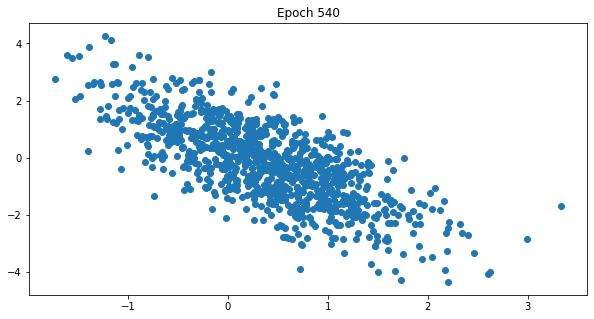

 54%|█████▍    | 541/1000 [40:17<34:26,  4.50s/it]

 54%|█████▍    | 542/1000 [40:21<34:01,  4.46s/it]

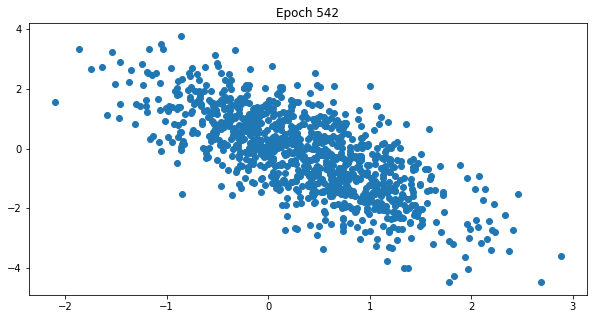

 54%|█████▍    | 543/1000 [40:26<34:20,  4.51s/it]

 54%|█████▍    | 544/1000 [40:30<33:45,  4.44s/it]

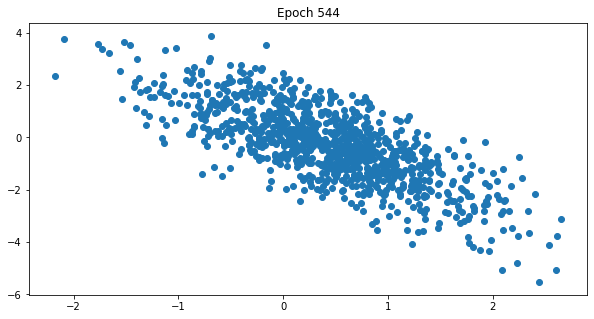

 55%|█████▍    | 545/1000 [40:35<34:12,  4.51s/it]

 55%|█████▍    | 546/1000 [40:39<33:29,  4.43s/it]

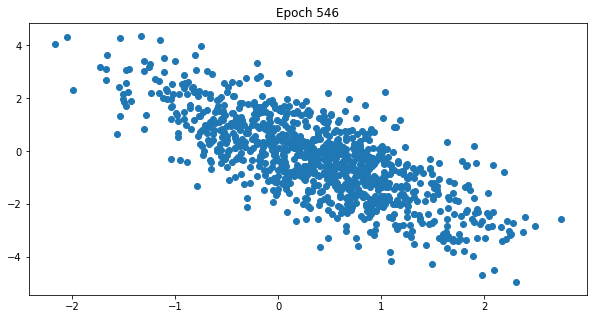

 55%|█████▍    | 547/1000 [40:44<33:35,  4.45s/it]

 55%|█████▍    | 548/1000 [40:48<33:07,  4.40s/it]

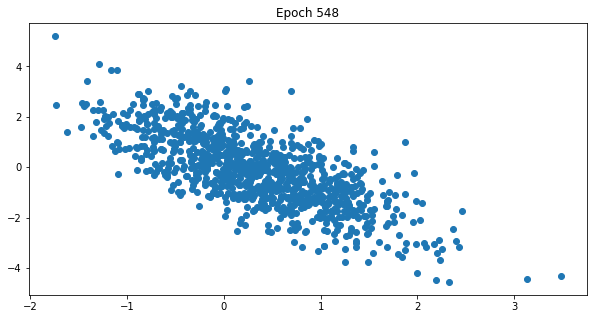

 55%|█████▍    | 549/1000 [40:52<33:30,  4.46s/it]

 55%|█████▌    | 550/1000 [40:57<33:02,  4.41s/it]

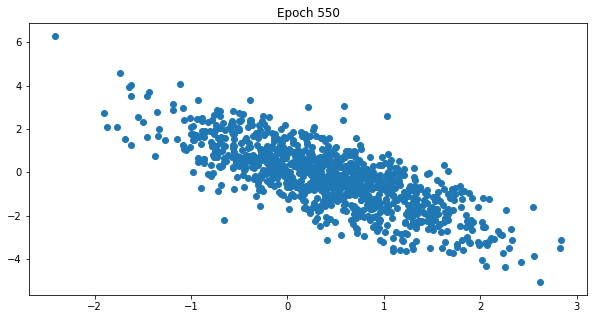

 55%|█████▌    | 551/1000 [41:01<33:36,  4.49s/it]

 55%|█████▌    | 552/1000 [41:06<33:20,  4.47s/it]

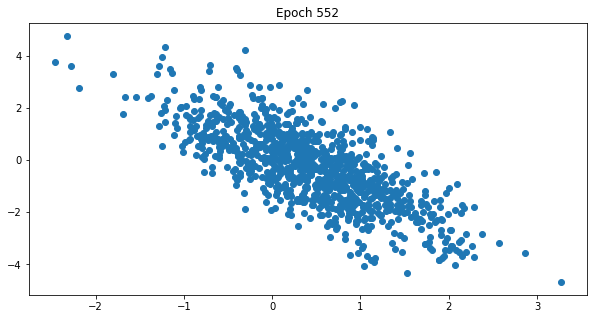

 55%|█████▌    | 553/1000 [41:11<34:34,  4.64s/it]

 55%|█████▌    | 554/1000 [41:15<33:45,  4.54s/it]

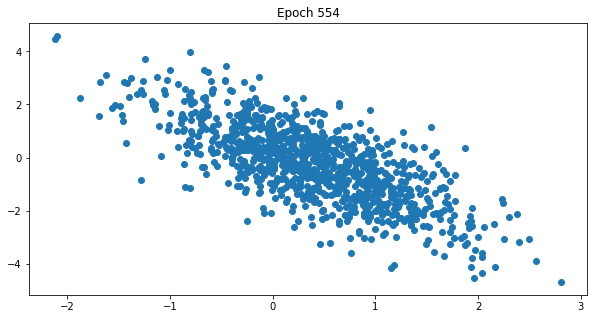

 56%|█████▌    | 555/1000 [41:20<34:02,  4.59s/it]

 56%|█████▌    | 556/1000 [41:24<33:15,  4.49s/it]

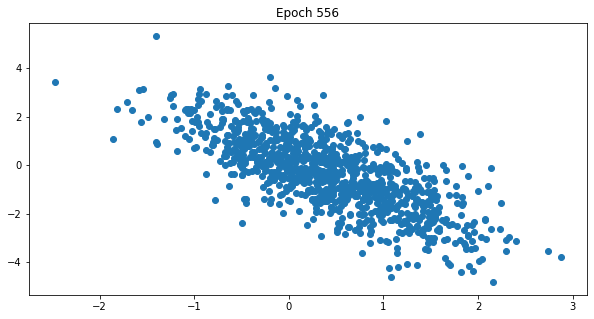

 56%|█████▌    | 557/1000 [41:29<33:32,  4.54s/it]

 56%|█████▌    | 558/1000 [41:33<32:46,  4.45s/it]

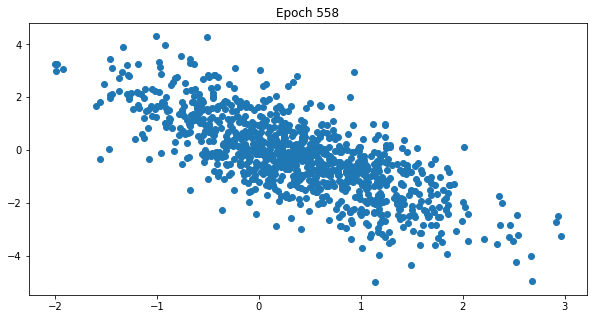

 56%|█████▌    | 559/1000 [41:38<33:12,  4.52s/it]

 56%|█████▌    | 560/1000 [41:42<32:36,  4.45s/it]

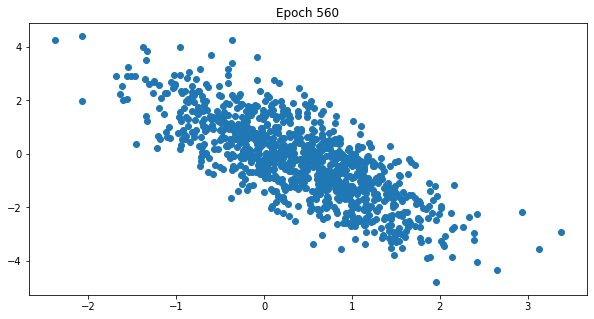

 56%|█████▌    | 561/1000 [41:47<32:41,  4.47s/it]

 56%|█████▌    | 562/1000 [41:51<32:02,  4.39s/it]

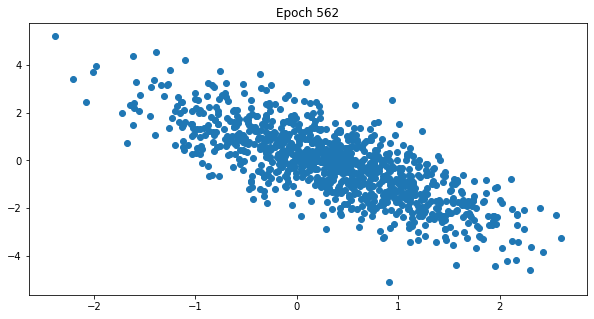

 56%|█████▋    | 563/1000 [41:55<32:33,  4.47s/it]

 56%|█████▋    | 564/1000 [42:00<32:11,  4.43s/it]

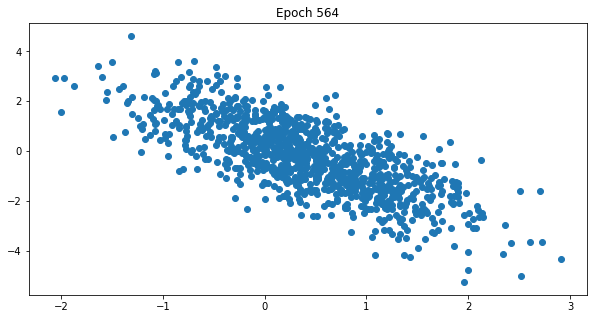

 56%|█████▋    | 565/1000 [42:04<32:27,  4.48s/it]

 57%|█████▋    | 566/1000 [42:09<32:04,  4.43s/it]

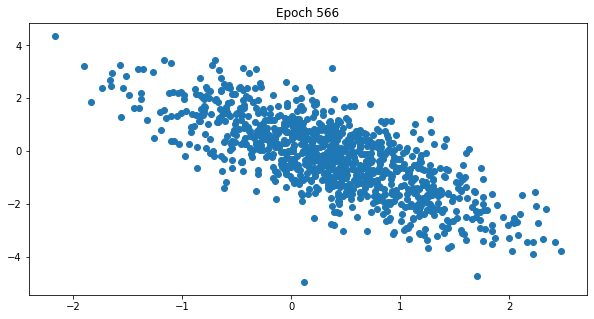

 57%|█████▋    | 567/1000 [42:14<33:21,  4.62s/it]

 57%|█████▋    | 568/1000 [42:18<32:45,  4.55s/it]

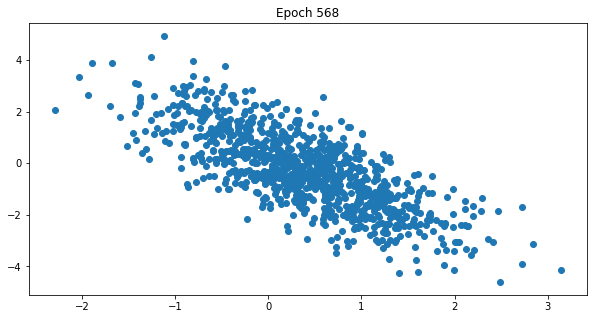

 57%|█████▋    | 569/1000 [42:23<32:48,  4.57s/it]

 57%|█████▋    | 570/1000 [42:27<32:04,  4.48s/it]

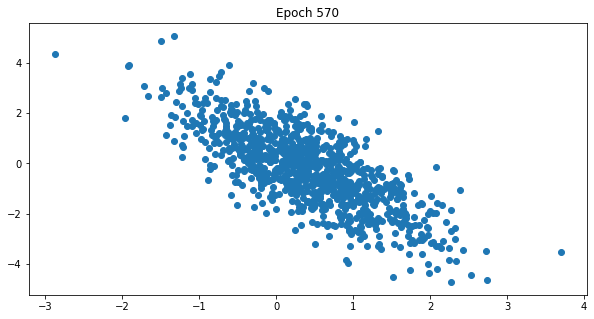

 57%|█████▋    | 571/1000 [42:32<33:38,  4.71s/it]

 57%|█████▋    | 572/1000 [42:37<32:44,  4.59s/it]

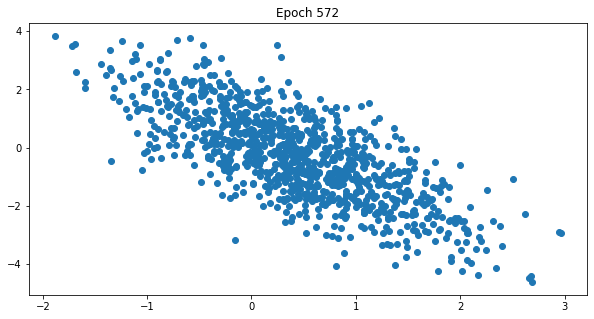

 57%|█████▋    | 573/1000 [42:41<32:31,  4.57s/it]

 57%|█████▋    | 574/1000 [42:45<31:35,  4.45s/it]

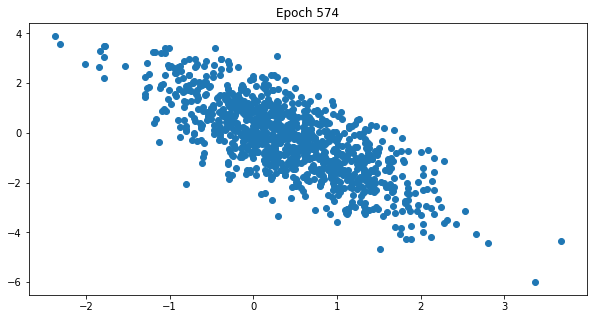

 57%|█████▊    | 575/1000 [42:50<31:42,  4.48s/it]

 58%|█████▊    | 576/1000 [42:54<31:05,  4.40s/it]

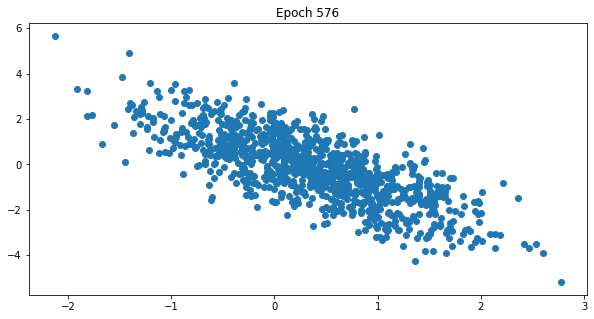

 58%|█████▊    | 577/1000 [42:59<31:34,  4.48s/it]

 58%|█████▊    | 578/1000 [43:03<31:02,  4.41s/it]

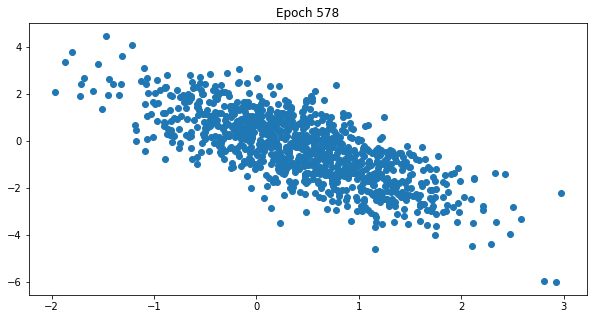

 58%|█████▊    | 579/1000 [43:08<31:52,  4.54s/it]

 58%|█████▊    | 580/1000 [43:12<31:13,  4.46s/it]

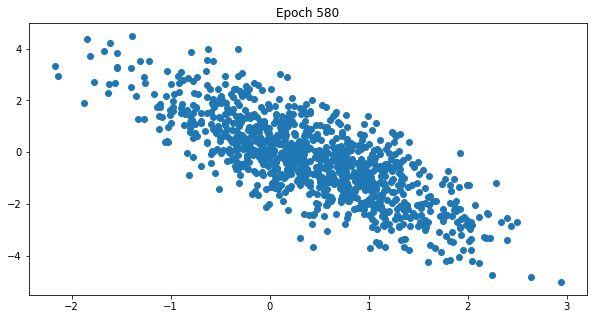

 58%|█████▊    | 581/1000 [43:17<31:24,  4.50s/it]

 58%|█████▊    | 582/1000 [43:21<30:53,  4.43s/it]

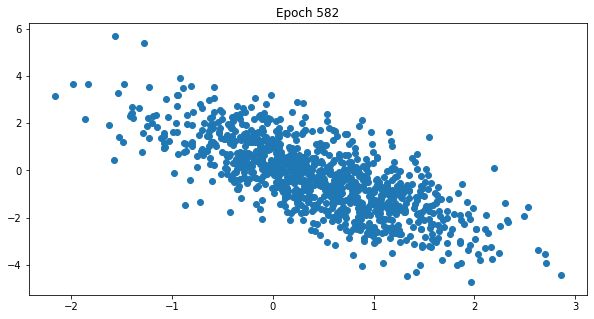

 58%|█████▊    | 583/1000 [43:25<31:12,  4.49s/it]

 58%|█████▊    | 584/1000 [43:30<30:35,  4.41s/it]

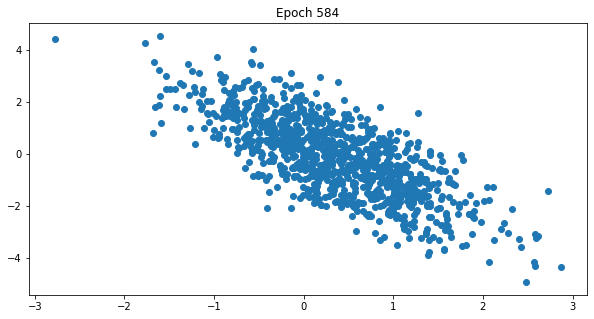

 58%|█████▊    | 585/1000 [43:34<31:05,  4.50s/it]

 59%|█████▊    | 586/1000 [43:39<30:20,  4.40s/it]

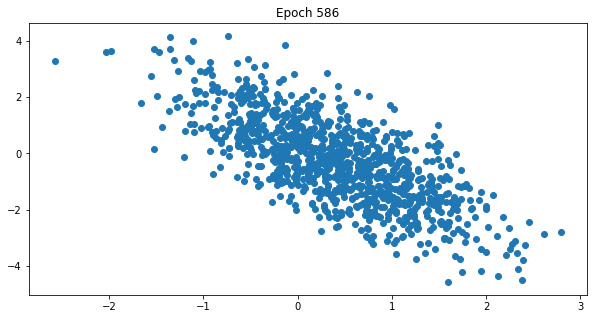

 59%|█████▊    | 587/1000 [43:43<30:37,  4.45s/it]

 59%|█████▉    | 588/1000 [43:47<29:58,  4.37s/it]

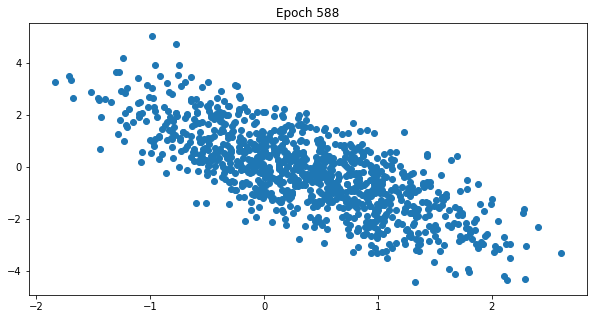

 59%|█████▉    | 589/1000 [43:52<30:30,  4.45s/it]

 59%|█████▉    | 590/1000 [43:56<30:02,  4.40s/it]

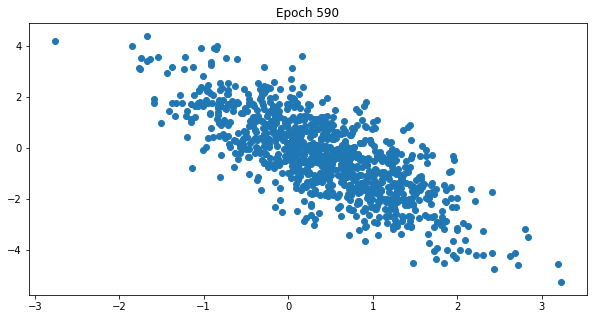

 59%|█████▉    | 591/1000 [44:01<31:26,  4.61s/it]

 59%|█████▉    | 592/1000 [44:06<30:54,  4.54s/it]

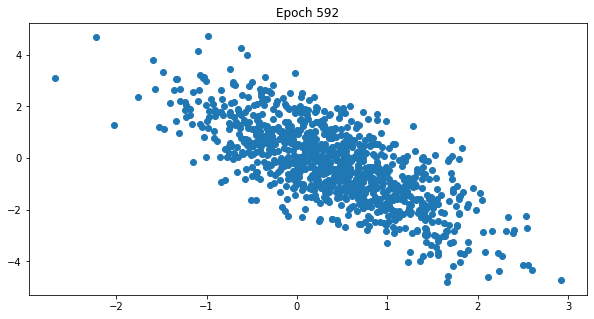

 59%|█████▉    | 593/1000 [44:10<31:03,  4.58s/it]

 59%|█████▉    | 594/1000 [44:15<30:30,  4.51s/it]

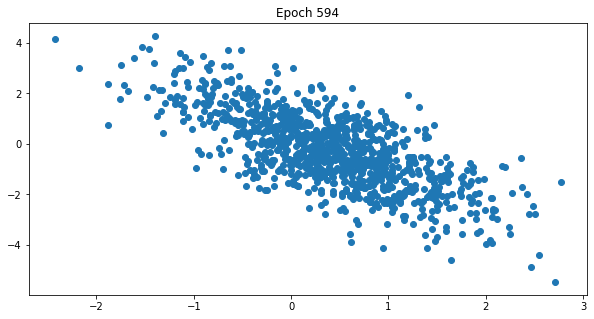

 60%|█████▉    | 595/1000 [44:19<30:31,  4.52s/it]

 60%|█████▉    | 596/1000 [44:24<30:04,  4.47s/it]

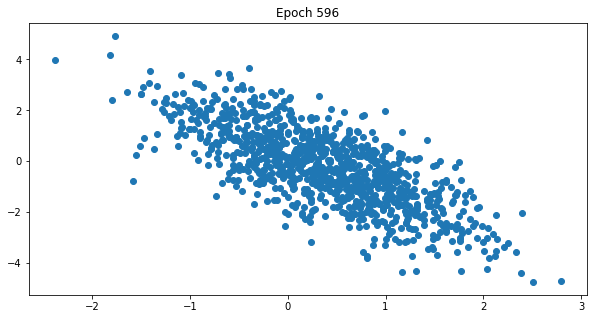

 60%|█████▉    | 597/1000 [44:28<30:24,  4.53s/it]

 60%|█████▉    | 598/1000 [44:33<29:53,  4.46s/it]

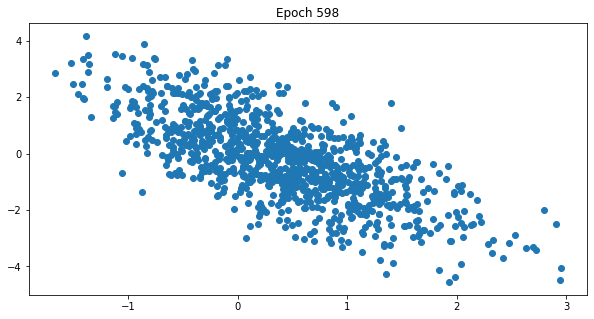

 60%|█████▉    | 599/1000 [44:38<30:53,  4.62s/it]

 60%|██████    | 600/1000 [44:42<30:08,  4.52s/it]

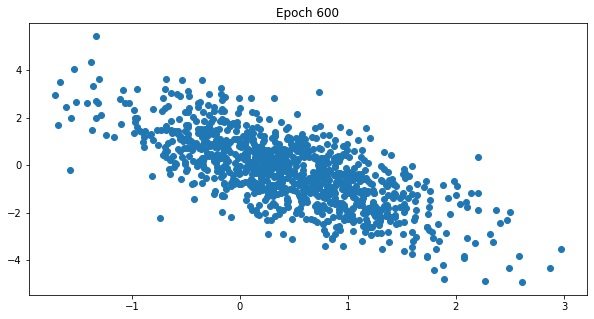

 60%|██████    | 601/1000 [44:46<30:10,  4.54s/it]

 60%|██████    | 602/1000 [44:51<29:37,  4.47s/it]

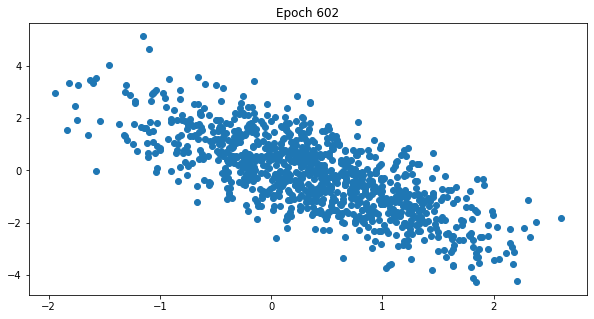

 60%|██████    | 603/1000 [44:55<29:52,  4.52s/it]

 60%|██████    | 604/1000 [45:00<29:21,  4.45s/it]

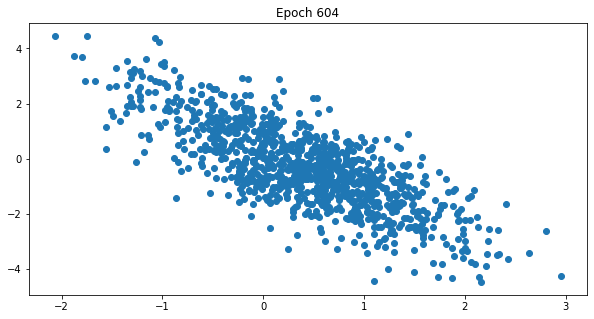

 60%|██████    | 605/1000 [45:04<29:29,  4.48s/it]

 61%|██████    | 606/1000 [45:09<29:05,  4.43s/it]

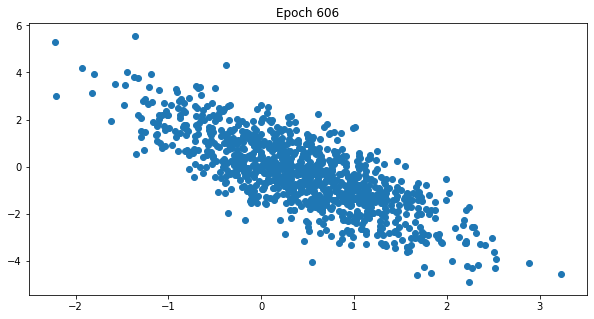

 61%|██████    | 607/1000 [45:13<29:25,  4.49s/it]

 61%|██████    | 608/1000 [45:17<28:55,  4.43s/it]

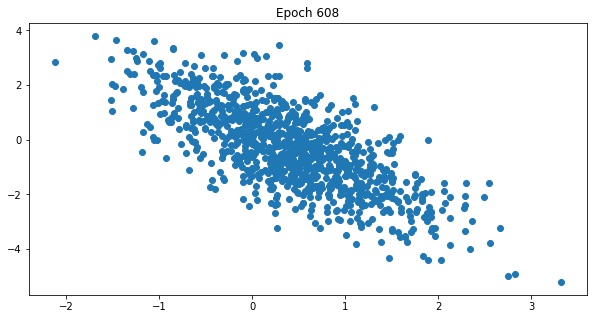

 61%|██████    | 609/1000 [45:23<30:09,  4.63s/it]

 61%|██████    | 610/1000 [45:27<29:22,  4.52s/it]

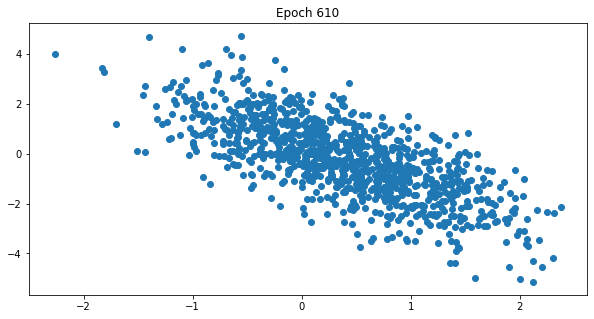

 61%|██████    | 611/1000 [45:32<29:36,  4.57s/it]

 61%|██████    | 612/1000 [45:36<28:55,  4.47s/it]

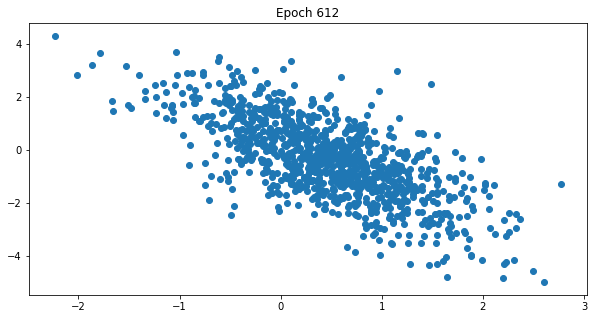

 61%|██████▏   | 613/1000 [45:40<29:14,  4.53s/it]

 61%|██████▏   | 614/1000 [45:45<28:35,  4.44s/it]

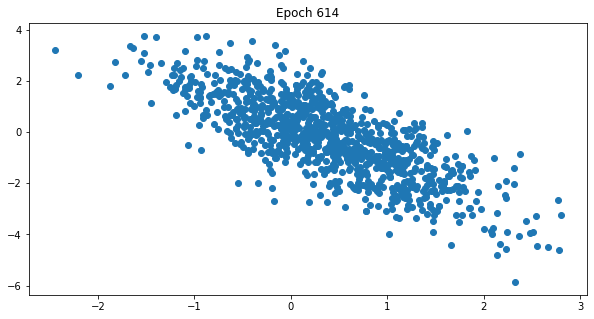

 62%|██████▏   | 615/1000 [45:50<29:38,  4.62s/it]

 62%|██████▏   | 616/1000 [45:54<28:58,  4.53s/it]

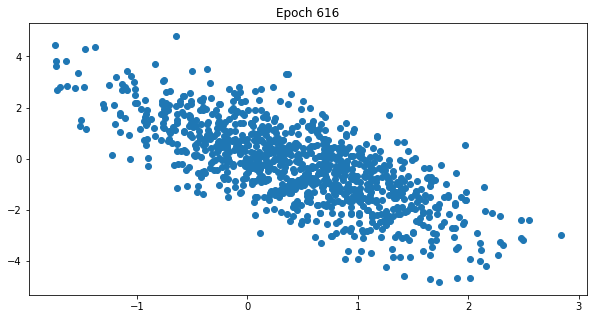

 62%|██████▏   | 617/1000 [45:59<29:00,  4.54s/it]

 62%|██████▏   | 618/1000 [46:03<28:23,  4.46s/it]

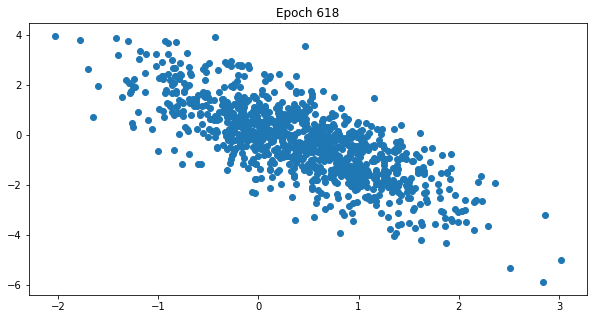

 62%|██████▏   | 619/1000 [46:08<28:40,  4.51s/it]

 62%|██████▏   | 620/1000 [46:12<28:06,  4.44s/it]

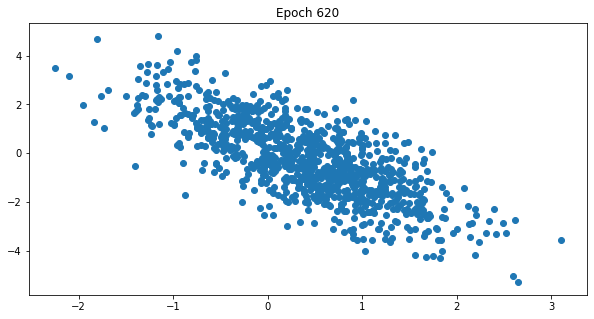

 62%|██████▏   | 621/1000 [46:16<28:35,  4.53s/it]

 62%|██████▏   | 622/1000 [46:21<28:01,  4.45s/it]

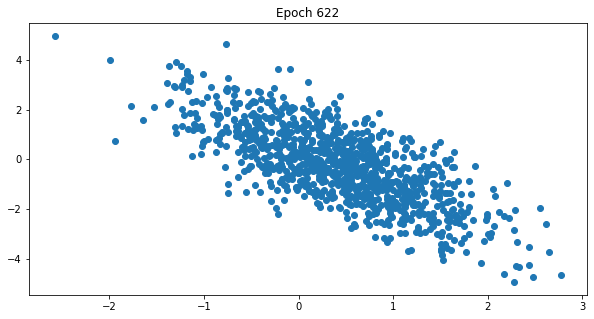

 62%|██████▏   | 623/1000 [46:25<28:16,  4.50s/it]

 62%|██████▏   | 624/1000 [46:30<27:44,  4.43s/it]

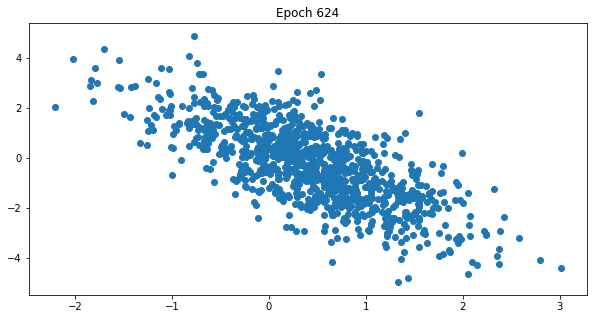

 62%|██████▎   | 625/1000 [46:35<28:56,  4.63s/it]

 63%|██████▎   | 626/1000 [46:39<28:22,  4.55s/it]

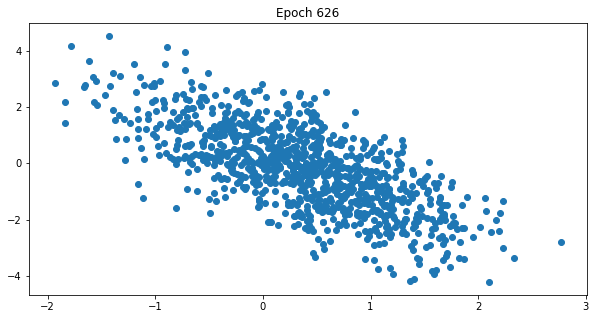

 63%|██████▎   | 627/1000 [46:44<28:13,  4.54s/it]

 63%|██████▎   | 628/1000 [46:48<27:37,  4.46s/it]

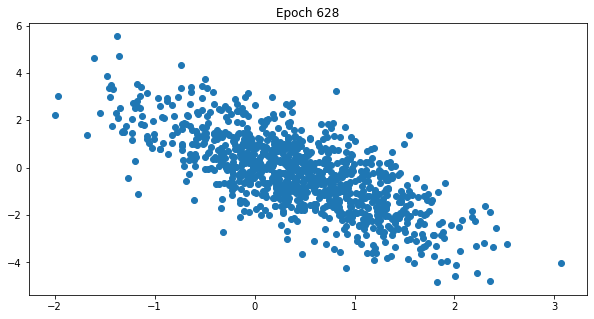

 63%|██████▎   | 629/1000 [46:53<27:58,  4.52s/it]

 63%|██████▎   | 630/1000 [46:57<27:34,  4.47s/it]

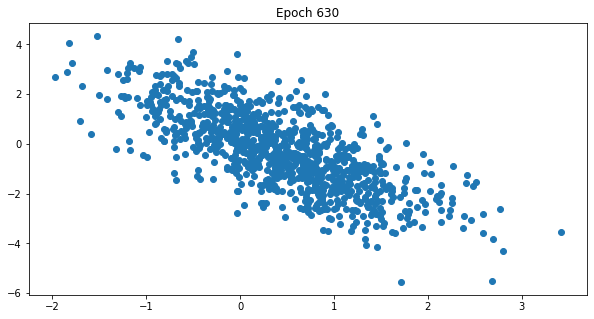

 63%|██████▎   | 631/1000 [47:02<28:54,  4.70s/it]

 63%|██████▎   | 632/1000 [47:07<28:12,  4.60s/it]

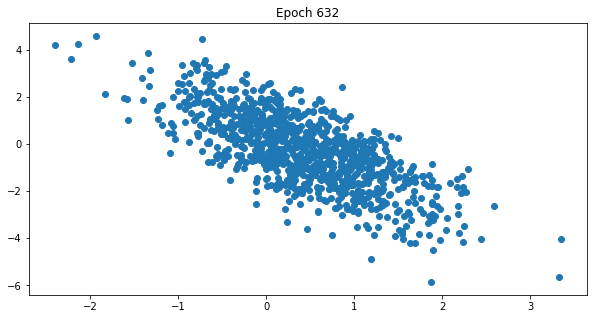

 63%|██████▎   | 633/1000 [47:11<28:10,  4.61s/it]

 63%|██████▎   | 634/1000 [47:15<27:22,  4.49s/it]

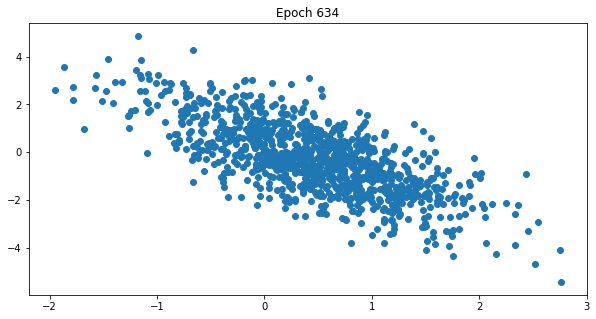

 64%|██████▎   | 635/1000 [47:20<27:34,  4.53s/it]

 64%|██████▎   | 636/1000 [47:24<27:04,  4.46s/it]

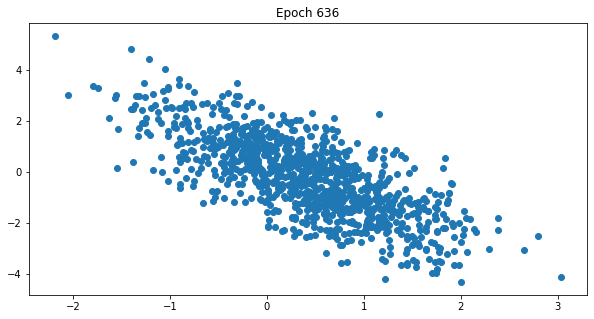

 64%|██████▎   | 637/1000 [47:29<27:23,  4.53s/it]

 64%|██████▍   | 638/1000 [47:33<26:56,  4.47s/it]

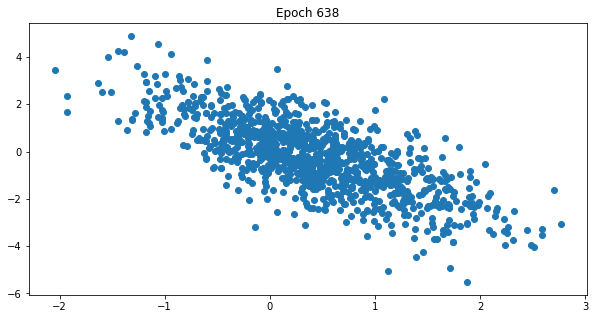

 64%|██████▍   | 639/1000 [47:38<27:55,  4.64s/it]

 64%|██████▍   | 640/1000 [47:43<27:17,  4.55s/it]

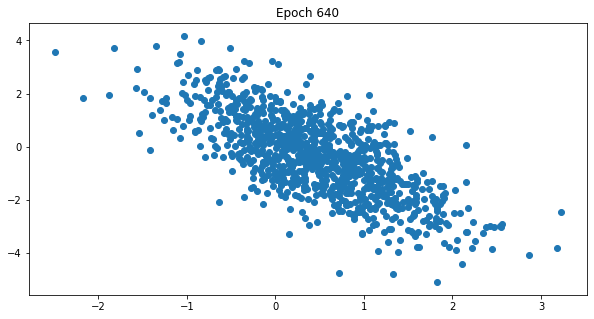

 64%|██████▍   | 641/1000 [47:47<27:29,  4.60s/it]

 64%|██████▍   | 642/1000 [47:52<26:54,  4.51s/it]

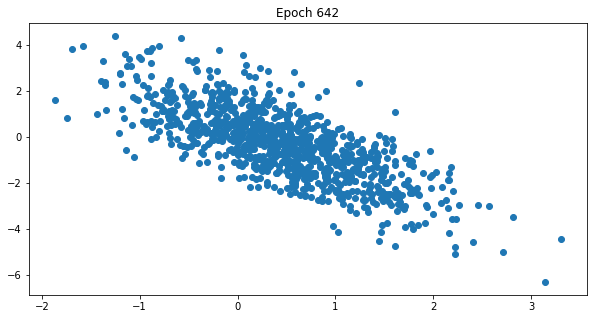

 64%|██████▍   | 643/1000 [47:56<27:11,  4.57s/it]

 64%|██████▍   | 644/1000 [48:01<26:40,  4.49s/it]

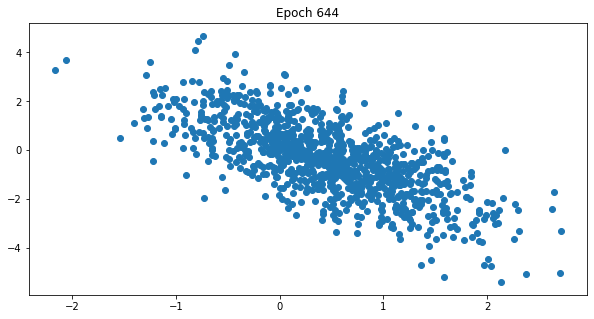

 64%|██████▍   | 645/1000 [48:06<27:46,  4.70s/it]

 65%|██████▍   | 646/1000 [48:10<26:59,  4.58s/it]

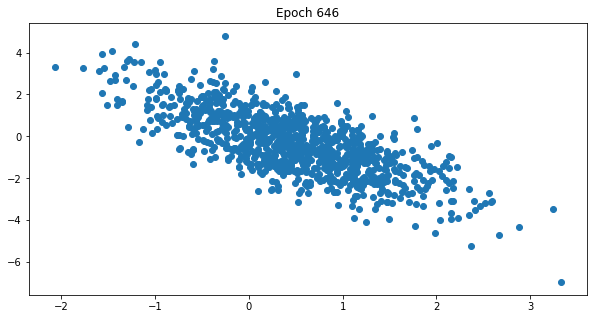

 65%|██████▍   | 647/1000 [48:15<27:05,  4.61s/it]

 65%|██████▍   | 648/1000 [48:19<26:30,  4.52s/it]

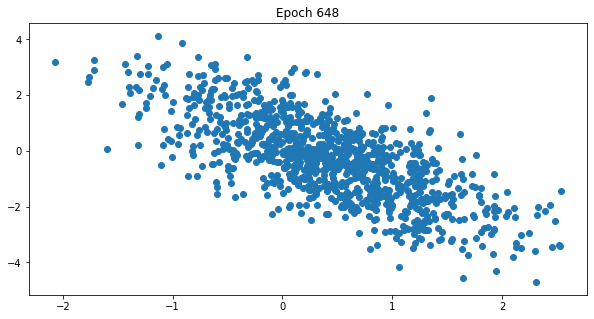

 65%|██████▍   | 649/1000 [48:24<27:39,  4.73s/it]

 65%|██████▌   | 650/1000 [48:29<26:59,  4.63s/it]

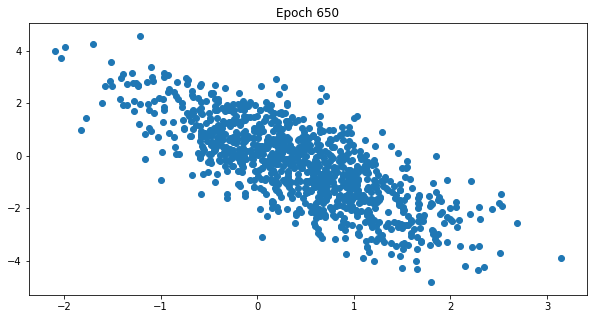

 65%|██████▌   | 651/1000 [48:33<26:57,  4.64s/it]

 65%|██████▌   | 652/1000 [48:38<26:10,  4.51s/it]

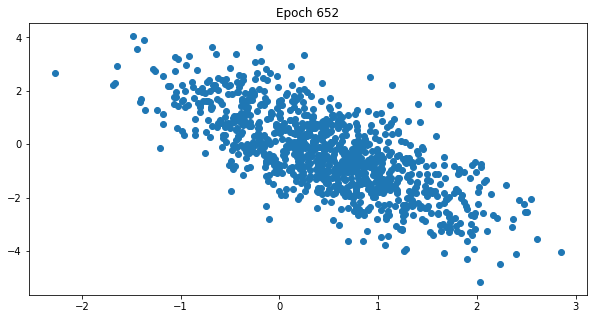

 65%|██████▌   | 653/1000 [48:42<26:22,  4.56s/it]

 65%|██████▌   | 654/1000 [48:47<25:49,  4.48s/it]

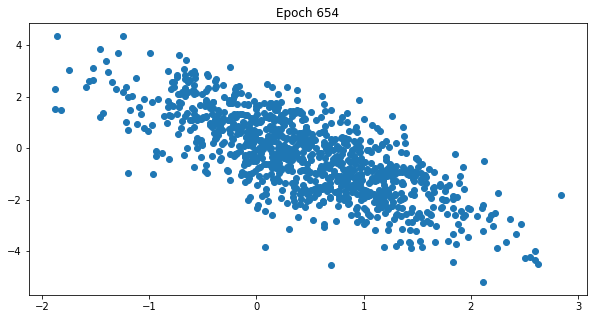

 66%|██████▌   | 655/1000 [48:51<25:49,  4.49s/it]

 66%|██████▌   | 656/1000 [48:55<25:17,  4.41s/it]

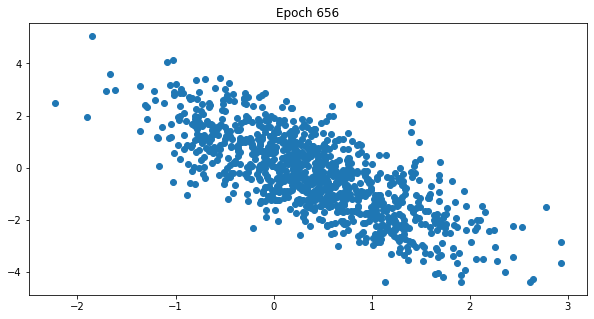

 66%|██████▌   | 657/1000 [49:00<25:31,  4.46s/it]

 66%|██████▌   | 658/1000 [49:04<25:03,  4.40s/it]

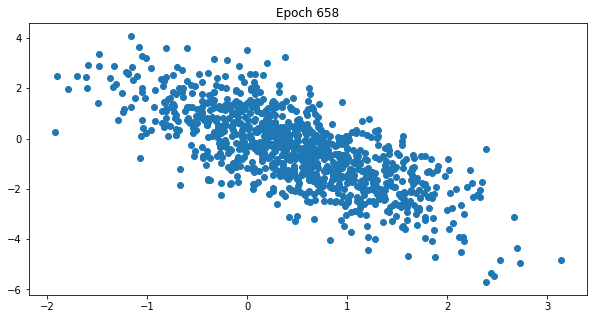

 66%|██████▌   | 659/1000 [49:09<25:31,  4.49s/it]

 66%|██████▌   | 660/1000 [49:13<24:54,  4.40s/it]

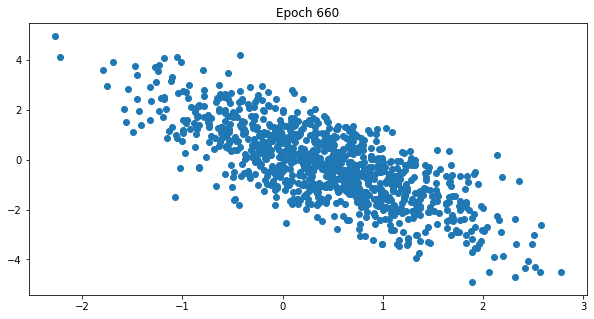

 66%|██████▌   | 661/1000 [49:18<25:05,  4.44s/it]

 66%|██████▌   | 662/1000 [49:22<24:48,  4.40s/it]

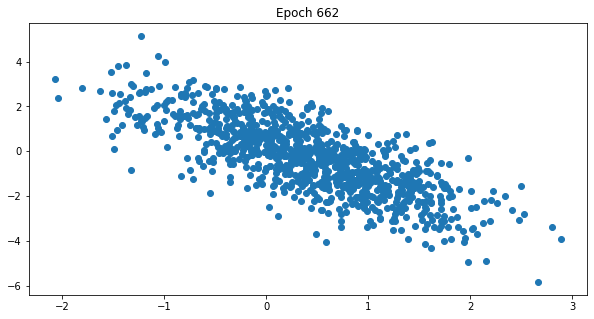

 66%|██████▋   | 663/1000 [49:27<25:43,  4.58s/it]

 66%|██████▋   | 664/1000 [49:31<25:04,  4.48s/it]

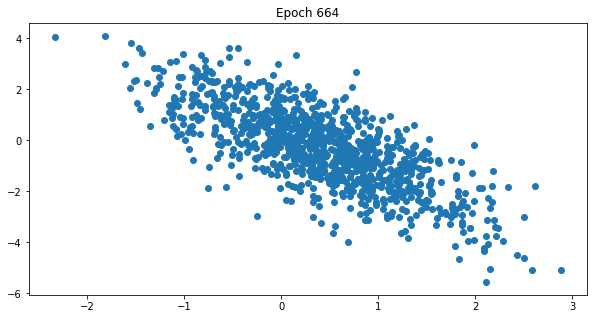

 66%|██████▋   | 665/1000 [49:36<25:33,  4.58s/it]

 67%|██████▋   | 666/1000 [49:40<25:00,  4.49s/it]

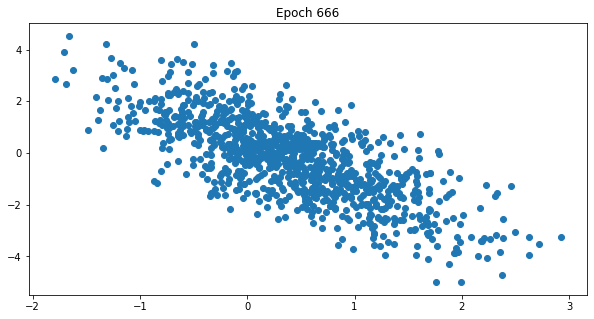

 67%|██████▋   | 667/1000 [49:45<25:07,  4.53s/it]

 67%|██████▋   | 668/1000 [49:49<24:43,  4.47s/it]

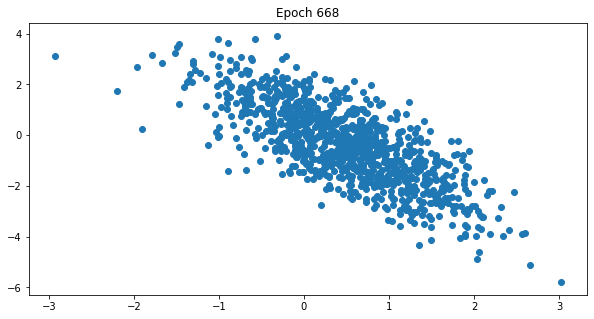

 67%|██████▋   | 669/1000 [49:54<25:48,  4.68s/it]

 67%|██████▋   | 670/1000 [49:59<25:01,  4.55s/it]

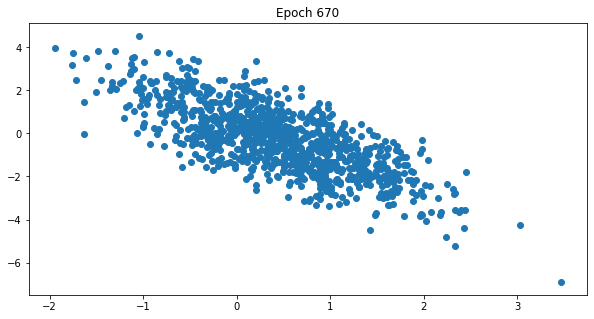

 67%|██████▋   | 671/1000 [50:03<25:02,  4.57s/it]

 67%|██████▋   | 672/1000 [50:08<24:31,  4.49s/it]

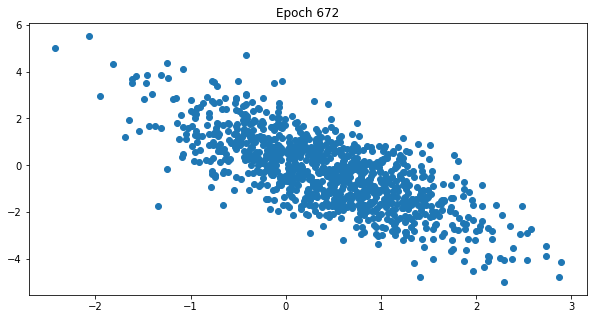

 67%|██████▋   | 673/1000 [50:12<24:43,  4.54s/it]

 67%|██████▋   | 674/1000 [50:17<24:17,  4.47s/it]

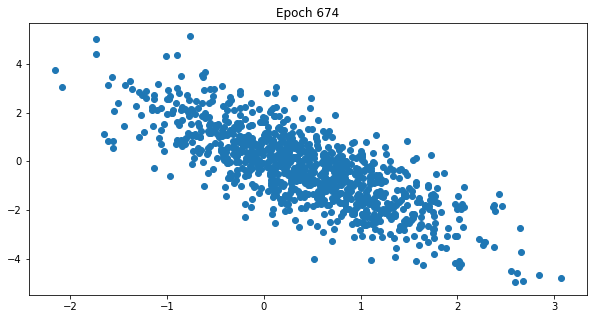

 68%|██████▊   | 675/1000 [50:21<24:22,  4.50s/it]

 68%|██████▊   | 676/1000 [50:25<24:07,  4.47s/it]

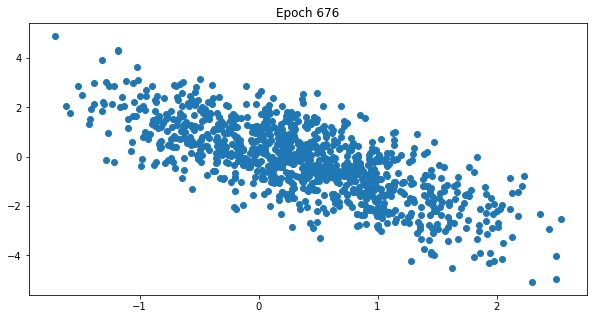

 68%|██████▊   | 677/1000 [50:30<24:14,  4.50s/it]

 68%|██████▊   | 678/1000 [50:34<23:50,  4.44s/it]

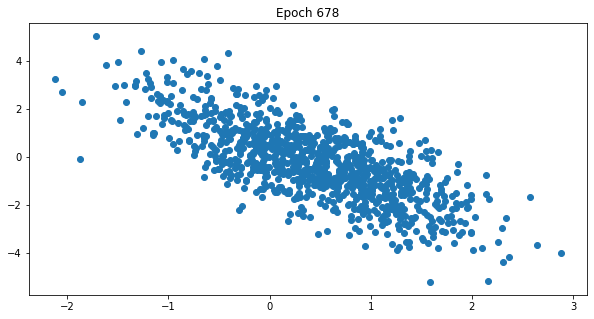

 68%|██████▊   | 679/1000 [50:39<24:01,  4.49s/it]

 68%|██████▊   | 680/1000 [50:43<23:35,  4.42s/it]

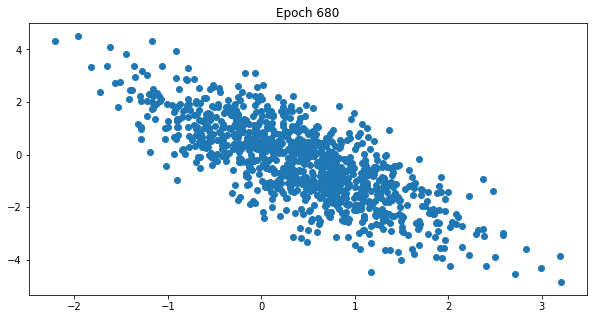

 68%|██████▊   | 681/1000 [50:48<23:44,  4.46s/it]

 68%|██████▊   | 682/1000 [50:52<23:22,  4.41s/it]

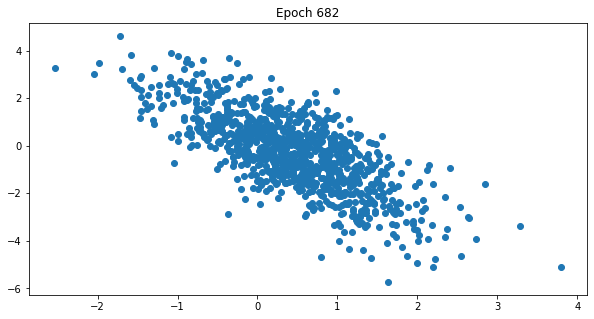

 68%|██████▊   | 683/1000 [50:57<23:39,  4.48s/it]

 68%|██████▊   | 684/1000 [51:01<23:06,  4.39s/it]

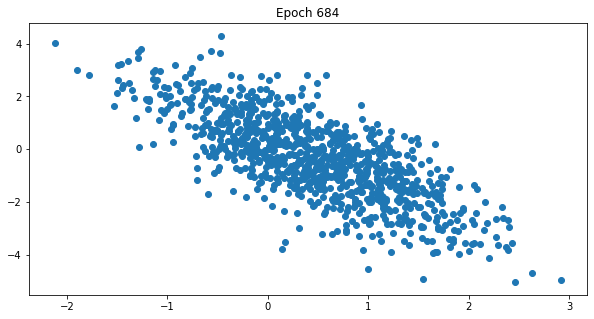

 68%|██████▊   | 685/1000 [51:06<23:25,  4.46s/it]

 69%|██████▊   | 686/1000 [51:10<22:54,  4.38s/it]

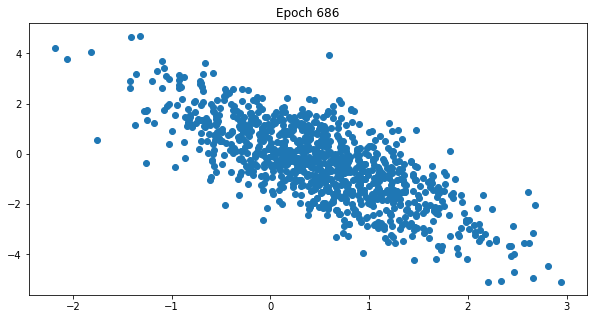

 69%|██████▊   | 687/1000 [51:14<23:08,  4.44s/it]

 69%|██████▉   | 688/1000 [51:19<22:54,  4.40s/it]

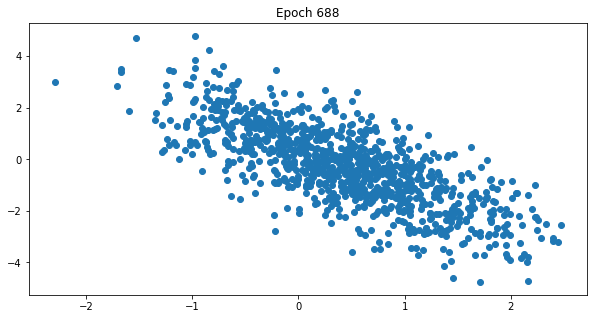

 69%|██████▉   | 689/1000 [51:24<23:44,  4.58s/it]

 69%|██████▉   | 690/1000 [51:28<23:12,  4.49s/it]

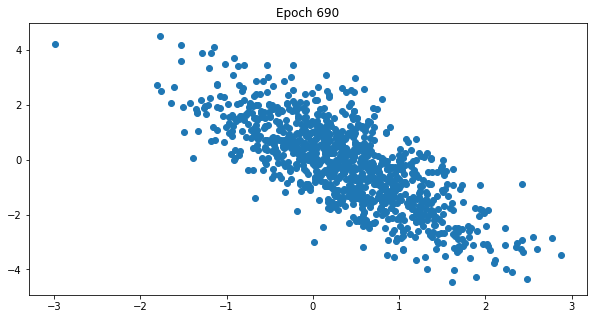

 69%|██████▉   | 691/1000 [51:32<23:15,  4.52s/it]

 69%|██████▉   | 692/1000 [51:37<22:50,  4.45s/it]

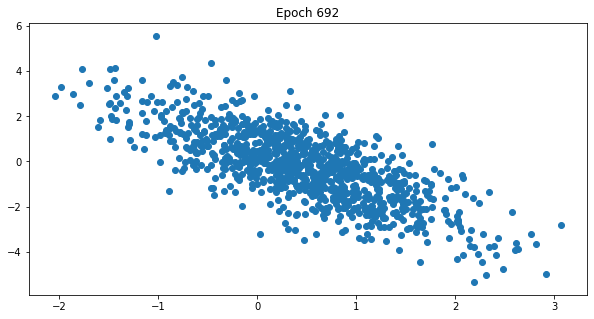

 69%|██████▉   | 693/1000 [51:41<23:07,  4.52s/it]

 69%|██████▉   | 694/1000 [51:46<22:45,  4.46s/it]

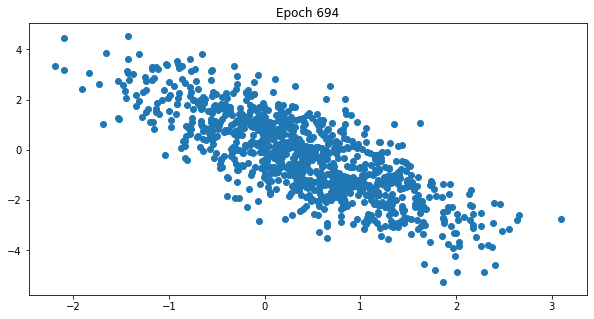

 70%|██████▉   | 695/1000 [51:50<22:54,  4.51s/it]

 70%|██████▉   | 696/1000 [51:55<22:25,  4.43s/it]

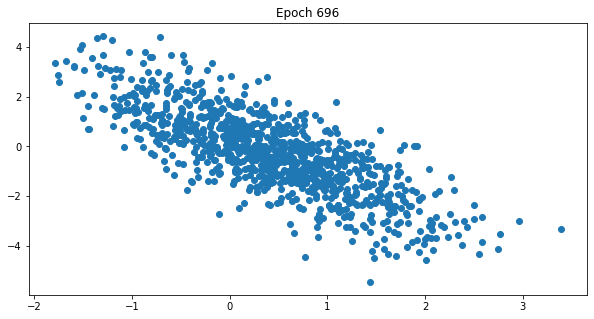

 70%|██████▉   | 697/1000 [51:59<22:47,  4.51s/it]

 70%|██████▉   | 698/1000 [52:04<22:23,  4.45s/it]

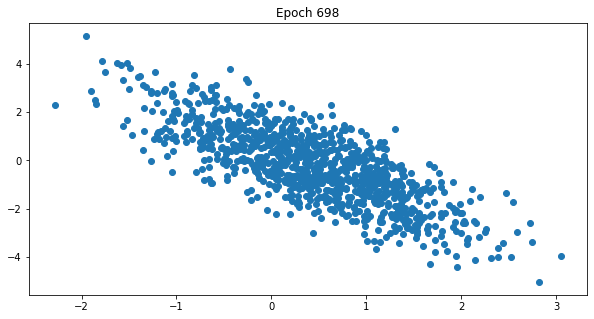

 70%|██████▉   | 699/1000 [52:08<22:36,  4.51s/it]

 70%|███████   | 700/1000 [52:13<22:20,  4.47s/it]

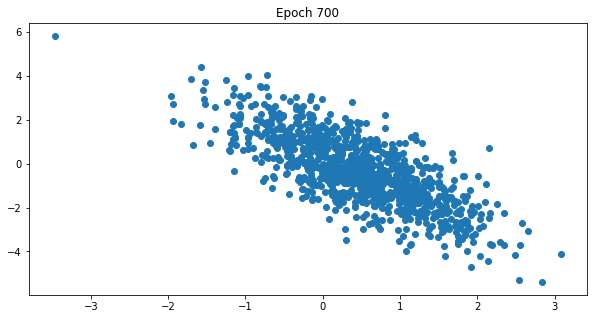

 70%|███████   | 701/1000 [52:17<22:27,  4.51s/it]

 70%|███████   | 702/1000 [52:21<21:54,  4.41s/it]

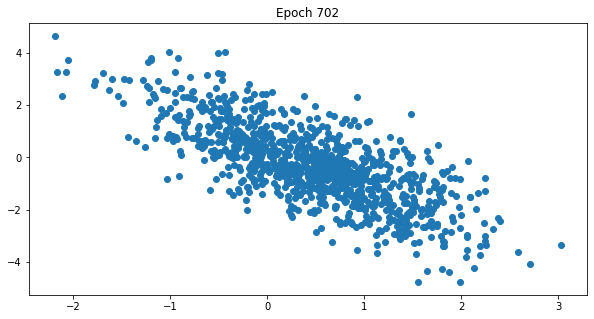

 70%|███████   | 703/1000 [52:26<22:06,  4.47s/it]

 70%|███████   | 704/1000 [52:30<21:46,  4.41s/it]

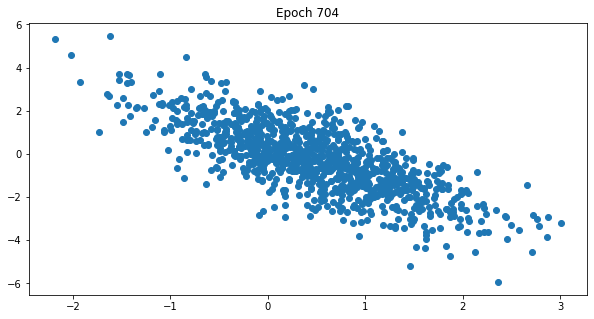

 70%|███████   | 705/1000 [52:35<22:49,  4.64s/it]

 71%|███████   | 706/1000 [52:40<22:17,  4.55s/it]

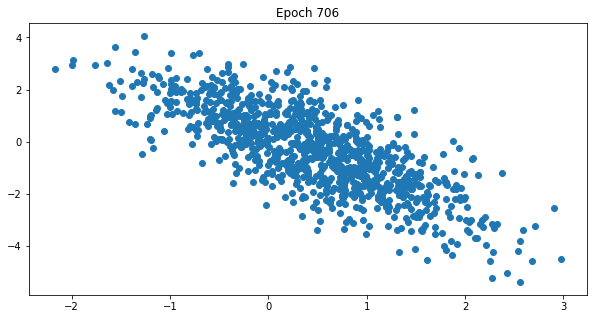

 71%|███████   | 707/1000 [52:44<22:14,  4.56s/it]

 71%|███████   | 708/1000 [52:49<21:53,  4.50s/it]

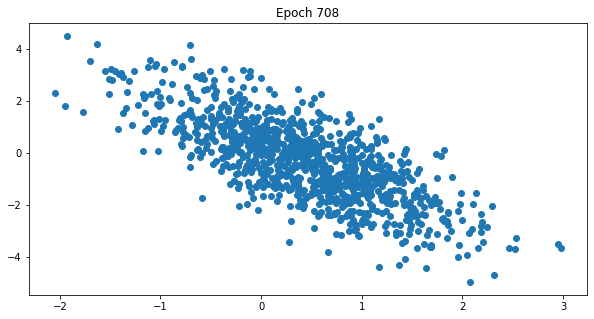

 71%|███████   | 709/1000 [52:54<22:15,  4.59s/it]

 71%|███████   | 710/1000 [52:58<21:33,  4.46s/it]

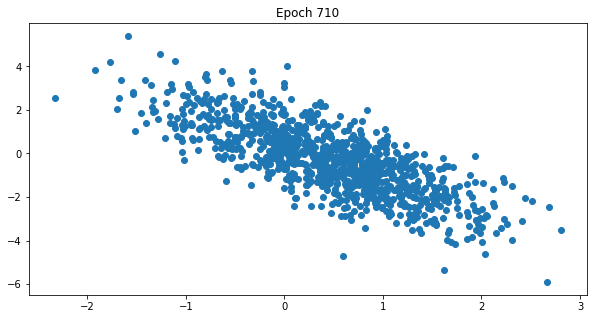

 71%|███████   | 711/1000 [53:03<22:31,  4.68s/it]

 71%|███████   | 712/1000 [53:07<21:57,  4.57s/it]

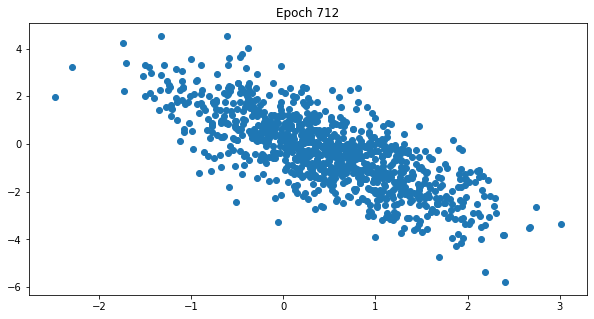

 71%|███████▏  | 713/1000 [53:12<21:46,  4.55s/it]

 71%|███████▏  | 714/1000 [53:16<21:11,  4.44s/it]

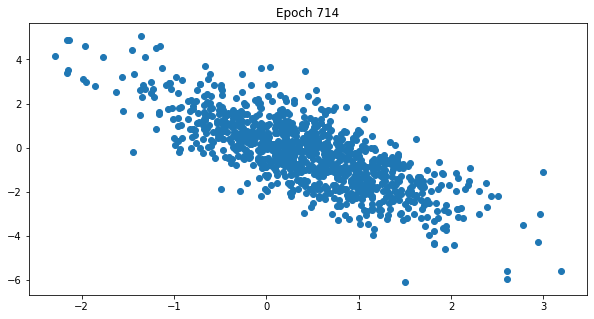

 72%|███████▏  | 715/1000 [53:21<21:18,  4.49s/it]

 72%|███████▏  | 716/1000 [53:25<20:56,  4.42s/it]

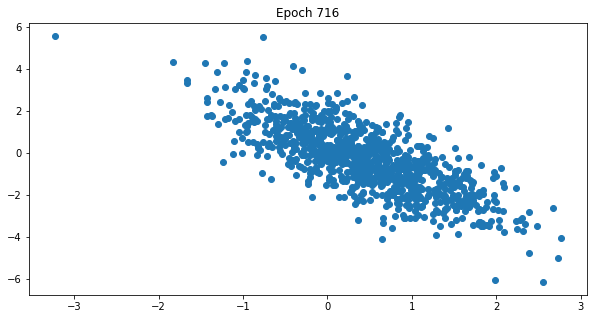

 72%|███████▏  | 717/1000 [53:30<21:16,  4.51s/it]

 72%|███████▏  | 718/1000 [53:34<20:47,  4.42s/it]

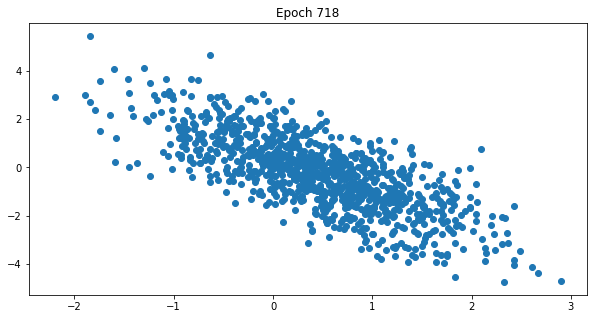

 72%|███████▏  | 719/1000 [53:39<21:53,  4.68s/it]

 72%|███████▏  | 720/1000 [53:43<21:11,  4.54s/it]

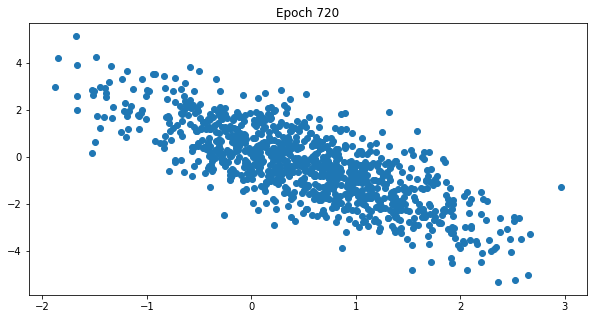

 72%|███████▏  | 721/1000 [53:48<21:17,  4.58s/it]

 72%|███████▏  | 722/1000 [53:52<20:45,  4.48s/it]

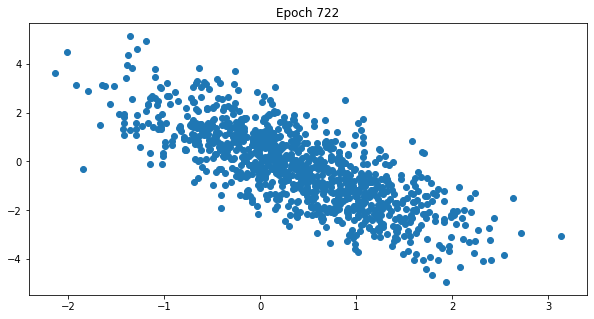

 72%|███████▏  | 723/1000 [53:57<20:58,  4.54s/it]

 72%|███████▏  | 724/1000 [54:01<20:33,  4.47s/it]

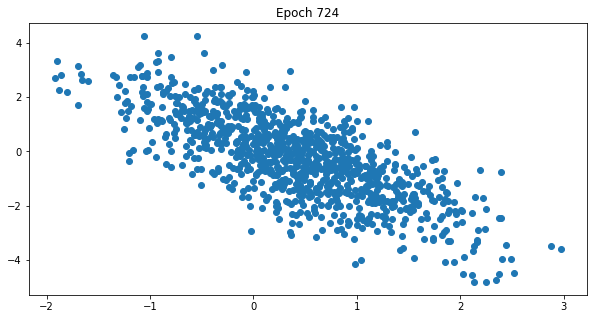

 72%|███████▎  | 725/1000 [54:06<20:43,  4.52s/it]

 73%|███████▎  | 726/1000 [54:10<20:23,  4.46s/it]

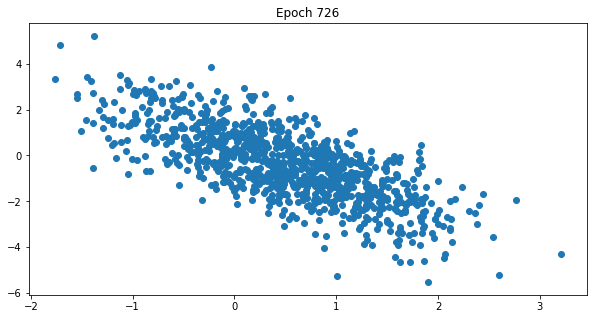

 73%|███████▎  | 727/1000 [54:15<20:35,  4.53s/it]

 73%|███████▎  | 728/1000 [54:19<20:03,  4.42s/it]

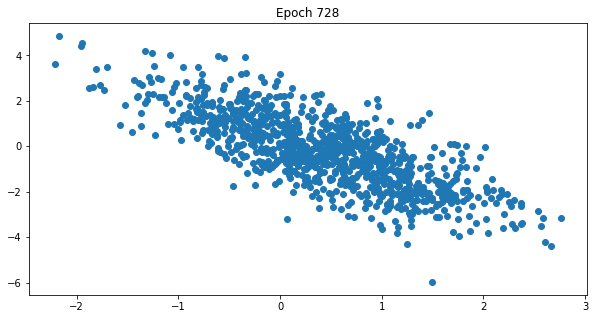

 73%|███████▎  | 729/1000 [54:24<20:14,  4.48s/it]

 73%|███████▎  | 730/1000 [54:28<19:49,  4.41s/it]

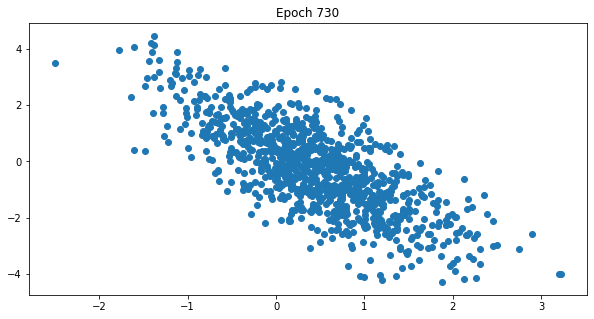

 73%|███████▎  | 731/1000 [54:33<20:49,  4.65s/it]

 73%|███████▎  | 732/1000 [54:37<20:20,  4.55s/it]

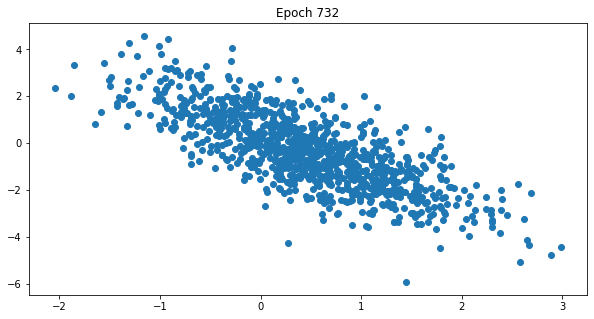

 73%|███████▎  | 733/1000 [54:42<20:20,  4.57s/it]

 73%|███████▎  | 734/1000 [54:46<19:49,  4.47s/it]

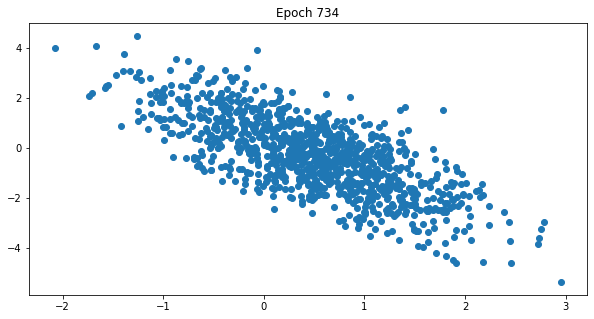

 74%|███████▎  | 735/1000 [54:51<20:05,  4.55s/it]

 74%|███████▎  | 736/1000 [54:55<19:36,  4.45s/it]

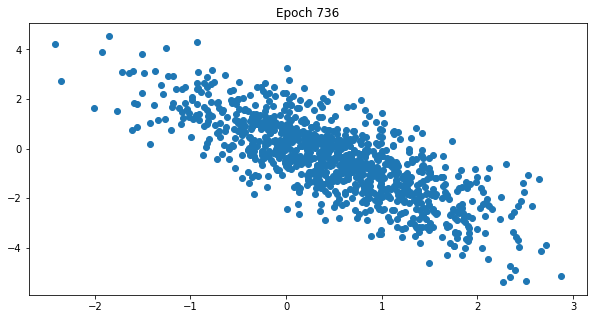

 74%|███████▎  | 737/1000 [55:00<19:44,  4.50s/it]

 74%|███████▍  | 738/1000 [55:04<19:23,  4.44s/it]

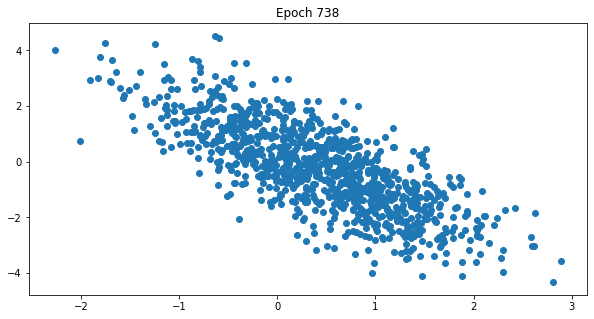

 74%|███████▍  | 739/1000 [55:09<19:26,  4.47s/it]

 74%|███████▍  | 740/1000 [55:13<19:03,  4.40s/it]

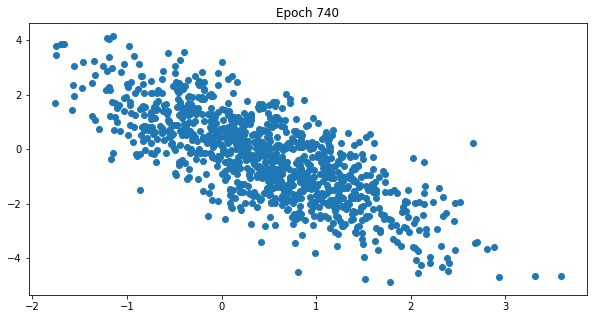

 74%|███████▍  | 741/1000 [55:17<19:14,  4.46s/it]

 74%|███████▍  | 742/1000 [55:22<18:59,  4.42s/it]

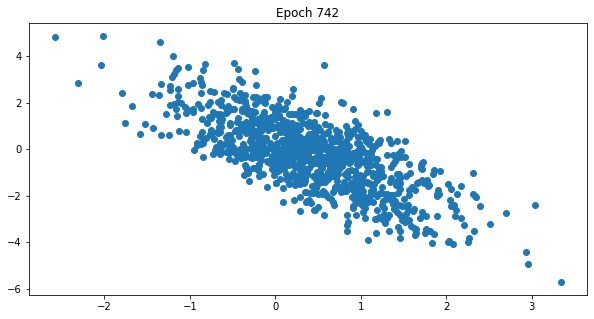

 74%|███████▍  | 743/1000 [55:26<19:11,  4.48s/it]

 74%|███████▍  | 744/1000 [55:31<18:50,  4.42s/it]

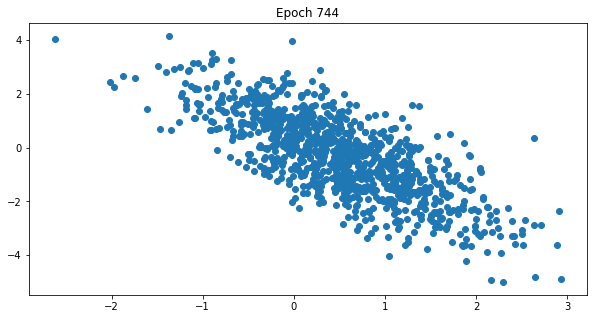

 74%|███████▍  | 745/1000 [55:36<19:41,  4.63s/it]

 75%|███████▍  | 746/1000 [55:40<19:08,  4.52s/it]

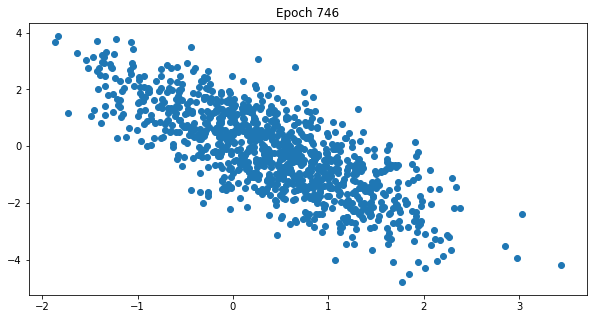

 75%|███████▍  | 747/1000 [55:45<19:09,  4.54s/it]

 75%|███████▍  | 748/1000 [55:49<18:47,  4.47s/it]

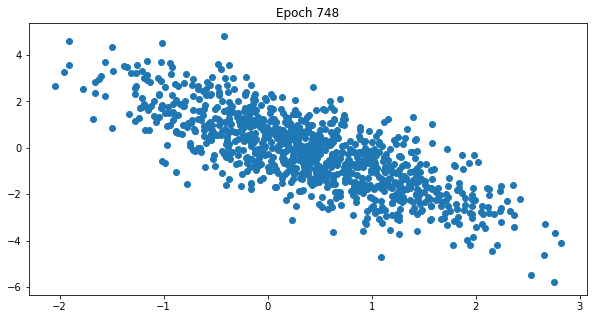

 75%|███████▍  | 749/1000 [55:54<18:56,  4.53s/it]

 75%|███████▌  | 750/1000 [55:58<18:35,  4.46s/it]

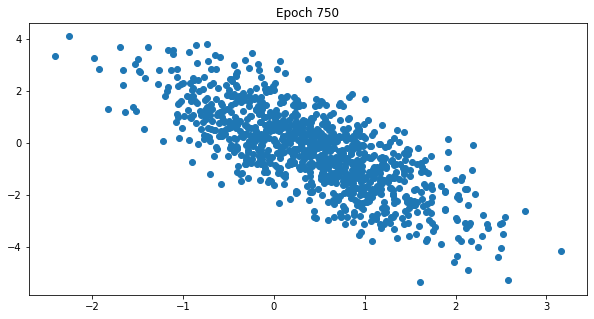

 75%|███████▌  | 751/1000 [56:03<18:43,  4.51s/it]

 75%|███████▌  | 752/1000 [56:07<18:26,  4.46s/it]

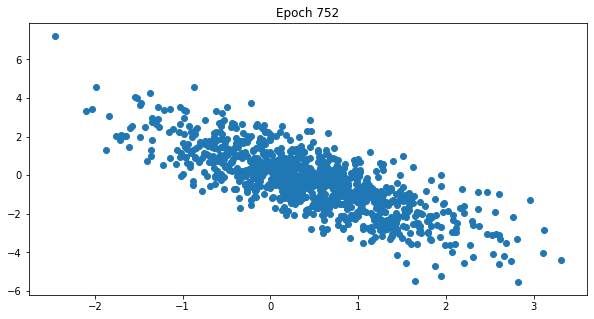

 75%|███████▌  | 753/1000 [56:12<18:45,  4.56s/it]

 75%|███████▌  | 754/1000 [56:16<18:21,  4.48s/it]

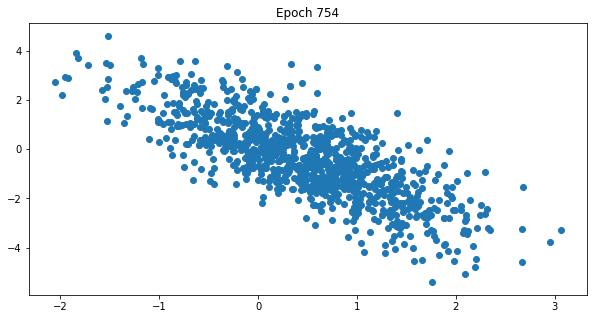

 76%|███████▌  | 755/1000 [56:21<18:44,  4.59s/it]

 76%|███████▌  | 756/1000 [56:25<18:14,  4.49s/it]

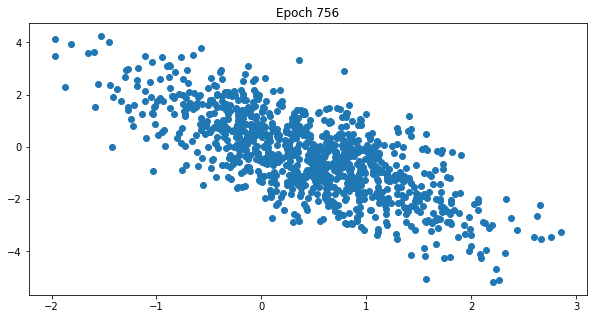

 76%|███████▌  | 757/1000 [56:30<18:18,  4.52s/it]

 76%|███████▌  | 758/1000 [56:34<17:47,  4.41s/it]

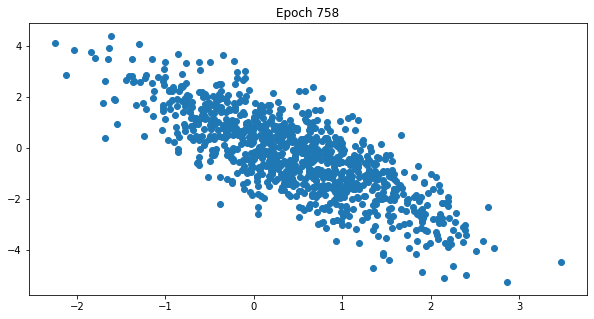

 76%|███████▌  | 759/1000 [56:39<18:08,  4.52s/it]

 76%|███████▌  | 760/1000 [56:43<17:46,  4.44s/it]

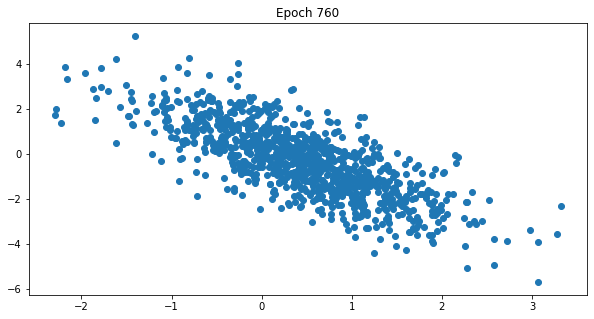

 76%|███████▌  | 761/1000 [56:48<17:57,  4.51s/it]

 76%|███████▌  | 762/1000 [56:52<17:40,  4.46s/it]

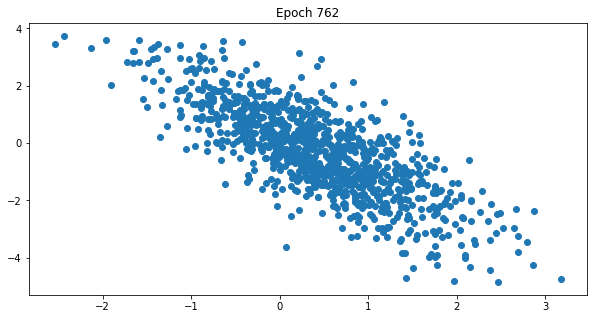

 76%|███████▋  | 763/1000 [56:56<17:44,  4.49s/it]

 76%|███████▋  | 764/1000 [57:01<17:24,  4.43s/it]

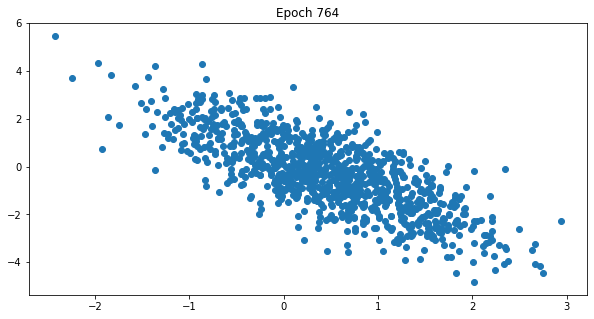

 76%|███████▋  | 765/1000 [57:05<17:32,  4.48s/it]

 77%|███████▋  | 766/1000 [57:10<17:12,  4.41s/it]

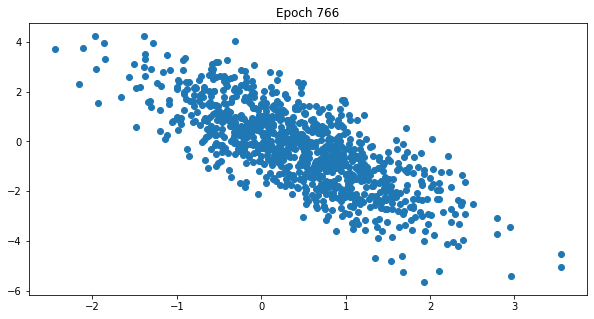

 77%|███████▋  | 767/1000 [57:14<17:21,  4.47s/it]

 77%|███████▋  | 768/1000 [57:18<16:57,  4.38s/it]

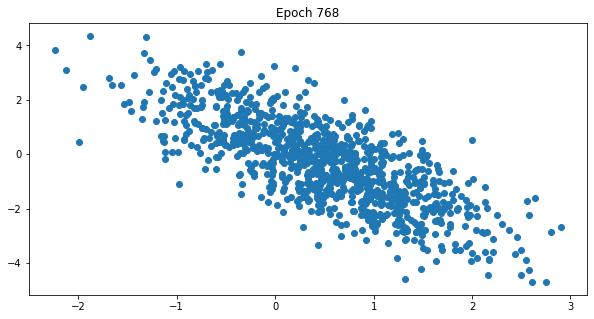

 77%|███████▋  | 769/1000 [57:23<17:14,  4.48s/it]

 77%|███████▋  | 770/1000 [57:27<16:58,  4.43s/it]

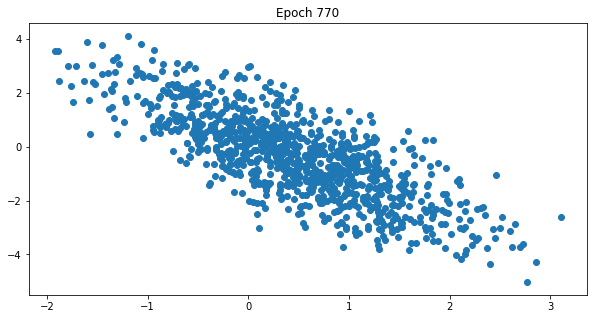

 77%|███████▋  | 771/1000 [57:33<17:44,  4.65s/it]

 77%|███████▋  | 772/1000 [57:37<17:13,  4.53s/it]

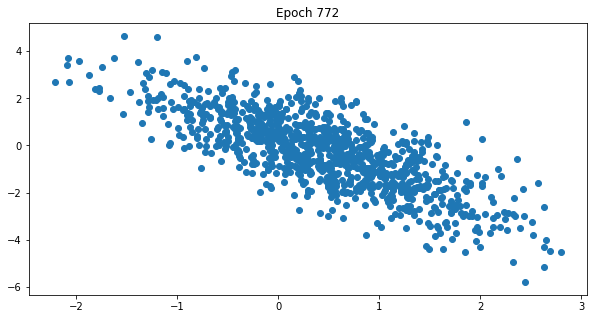

 77%|███████▋  | 773/1000 [57:41<17:16,  4.57s/it]

 77%|███████▋  | 774/1000 [57:46<16:47,  4.46s/it]

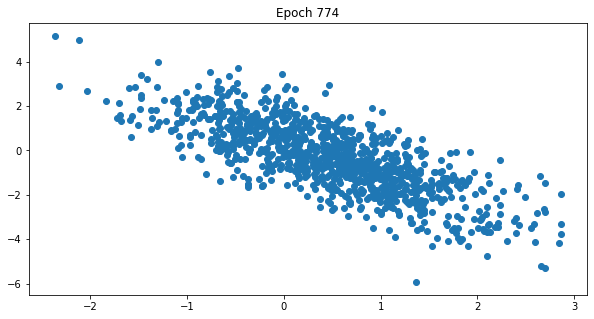

 78%|███████▊  | 775/1000 [57:50<16:49,  4.49s/it]

 78%|███████▊  | 776/1000 [57:55<16:33,  4.44s/it]

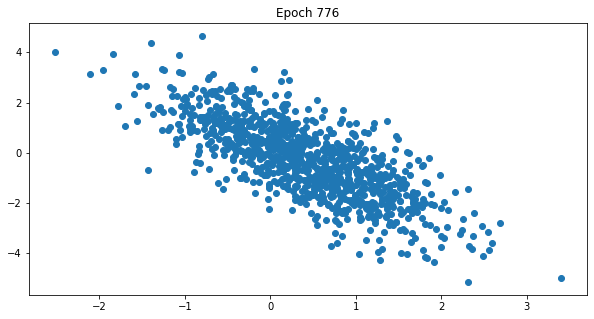

 78%|███████▊  | 777/1000 [57:59<16:46,  4.52s/it]

 78%|███████▊  | 778/1000 [58:03<16:26,  4.44s/it]

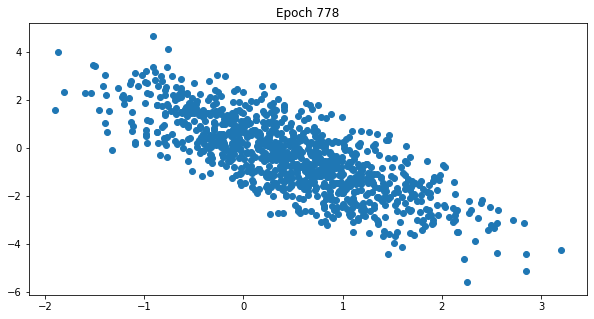

 78%|███████▊  | 779/1000 [58:08<16:35,  4.50s/it]

 78%|███████▊  | 780/1000 [58:12<16:12,  4.42s/it]

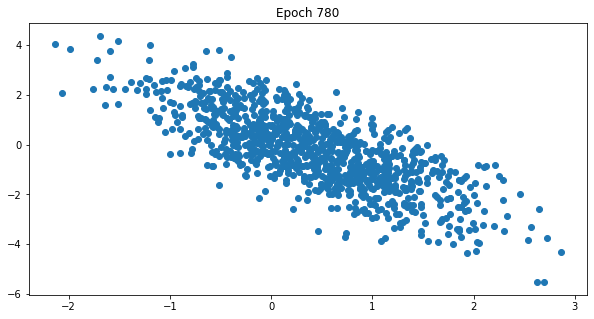

 78%|███████▊  | 781/1000 [58:17<16:19,  4.47s/it]

 78%|███████▊  | 782/1000 [58:21<15:58,  4.40s/it]

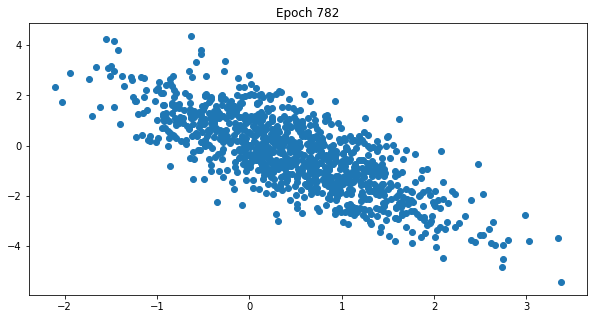

 78%|███████▊  | 783/1000 [58:26<16:46,  4.64s/it]

 78%|███████▊  | 784/1000 [58:31<16:34,  4.60s/it]

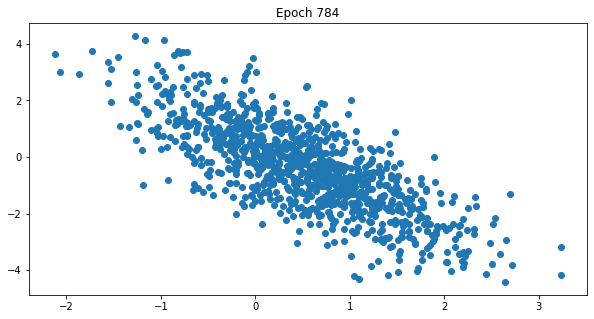

 78%|███████▊  | 785/1000 [58:36<16:36,  4.63s/it]

 79%|███████▊  | 786/1000 [58:40<16:05,  4.51s/it]

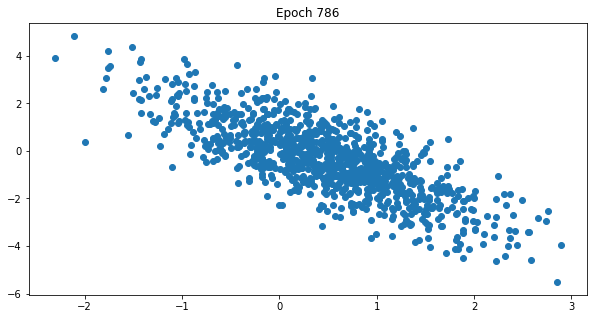

 79%|███████▊  | 787/1000 [58:45<16:38,  4.69s/it]

 79%|███████▉  | 788/1000 [58:49<16:12,  4.59s/it]

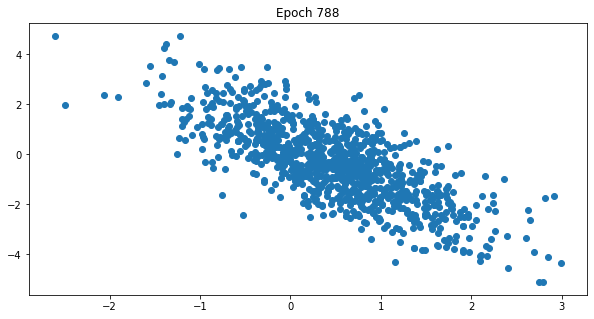

 79%|███████▉  | 789/1000 [58:54<16:11,  4.60s/it]

 79%|███████▉  | 790/1000 [58:58<15:51,  4.53s/it]

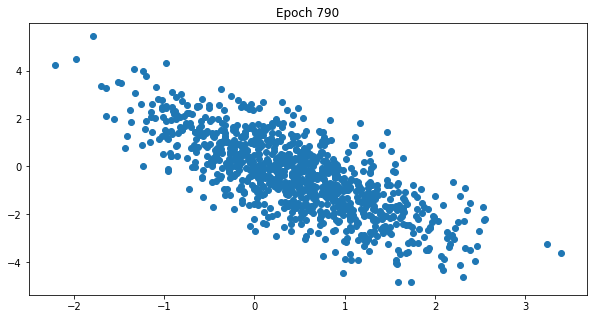

 79%|███████▉  | 791/1000 [59:03<15:49,  4.55s/it]

 79%|███████▉  | 792/1000 [59:07<15:28,  4.46s/it]

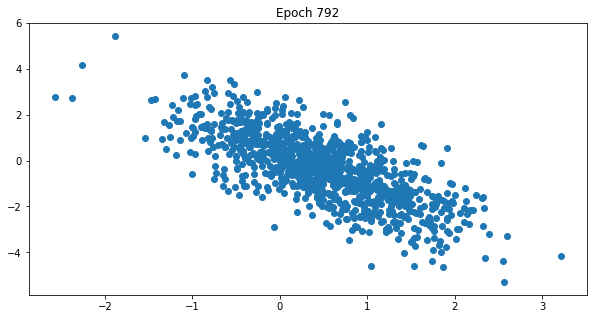

 79%|███████▉  | 793/1000 [59:12<15:33,  4.51s/it]

 79%|███████▉  | 794/1000 [59:16<15:13,  4.43s/it]

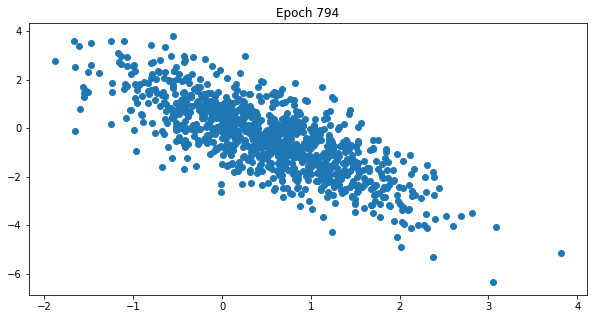

 80%|███████▉  | 795/1000 [59:21<15:20,  4.49s/it]

 80%|███████▉  | 796/1000 [59:25<14:56,  4.39s/it]

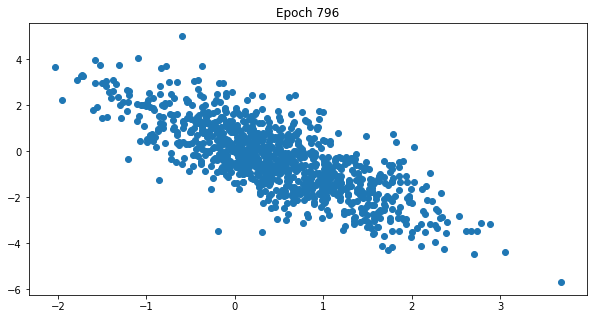

 80%|███████▉  | 797/1000 [59:29<15:01,  4.44s/it]

 80%|███████▉  | 798/1000 [59:34<14:42,  4.37s/it]

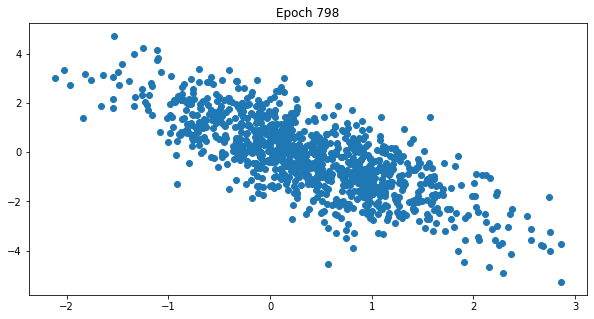

 80%|███████▉  | 799/1000 [59:38<15:06,  4.51s/it]

 80%|████████  | 800/1000 [59:43<14:49,  4.45s/it]

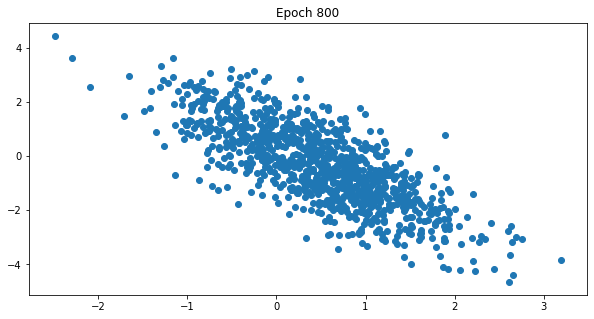

 80%|████████  | 801/1000 [59:48<15:16,  4.60s/it]

 80%|████████  | 802/1000 [59:52<14:51,  4.50s/it]

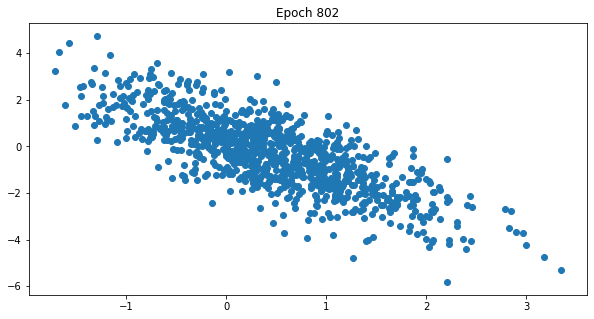

 80%|████████  | 803/1000 [59:57<14:55,  4.54s/it]

 80%|████████  | 804/1000 [1:00:01<14:38,  4.48s/it]

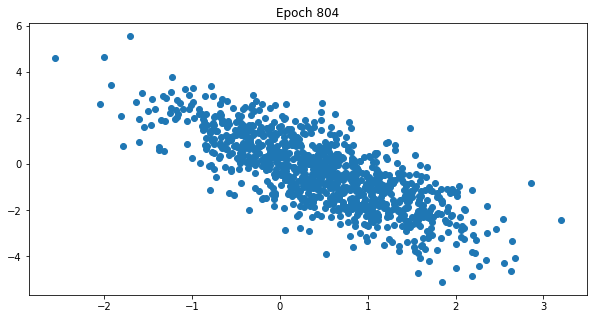

 80%|████████  | 805/1000 [1:00:05<14:40,  4.52s/it]

 81%|████████  | 806/1000 [1:00:10<14:22,  4.44s/it]

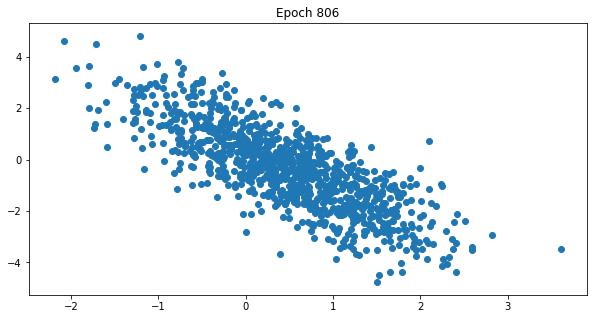

 81%|████████  | 807/1000 [1:00:14<14:32,  4.52s/it]

 81%|████████  | 808/1000 [1:00:19<14:14,  4.45s/it]

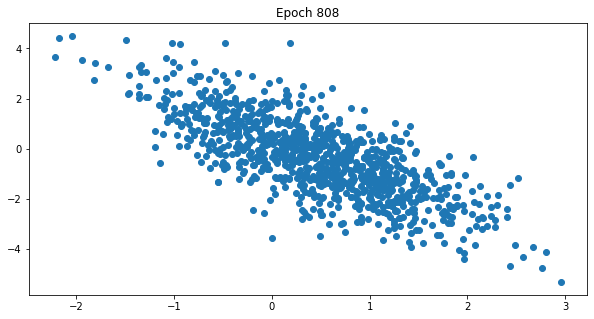

 81%|████████  | 809/1000 [1:00:24<14:57,  4.70s/it]

 81%|████████  | 810/1000 [1:00:28<14:35,  4.61s/it]

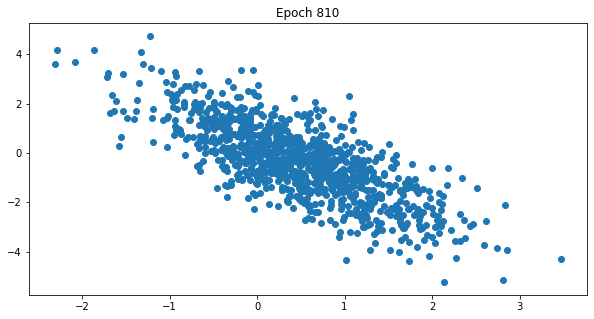

 81%|████████  | 811/1000 [1:00:33<14:28,  4.60s/it]

 81%|████████  | 812/1000 [1:00:37<14:07,  4.51s/it]

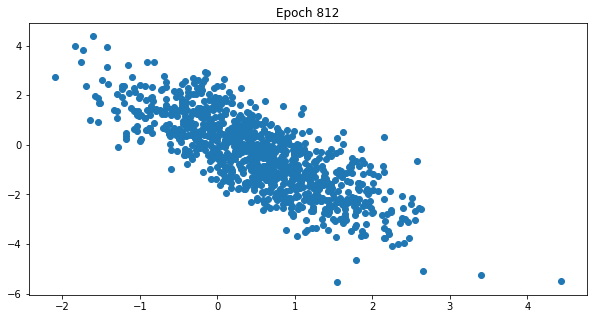

 81%|████████▏ | 813/1000 [1:00:42<14:11,  4.55s/it]

 81%|████████▏ | 814/1000 [1:00:46<13:56,  4.50s/it]

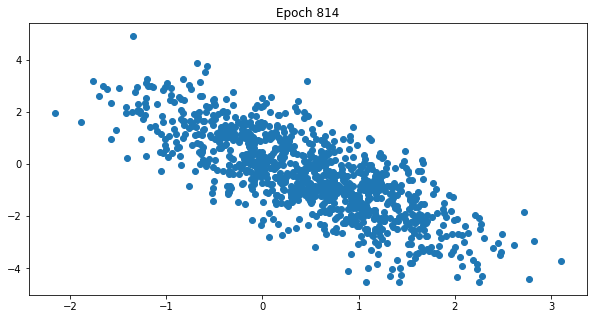

 82%|████████▏ | 815/1000 [1:00:51<14:25,  4.68s/it]

 82%|████████▏ | 816/1000 [1:00:56<14:01,  4.57s/it]

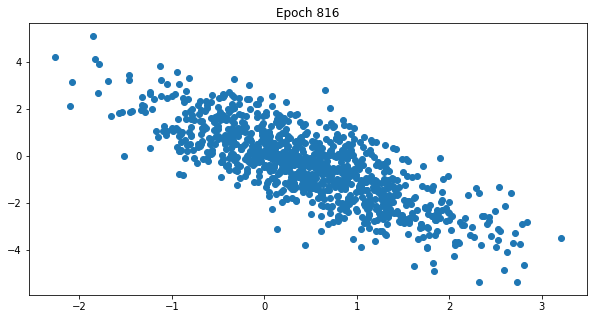

 82%|████████▏ | 817/1000 [1:01:00<13:57,  4.58s/it]

 82%|████████▏ | 818/1000 [1:01:05<13:40,  4.51s/it]

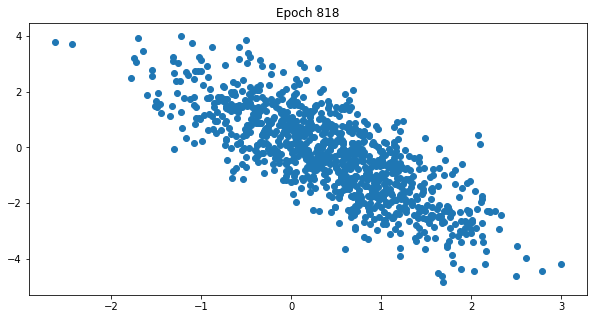

 82%|████████▏ | 819/1000 [1:01:09<13:42,  4.54s/it]

 82%|████████▏ | 820/1000 [1:01:14<13:30,  4.50s/it]

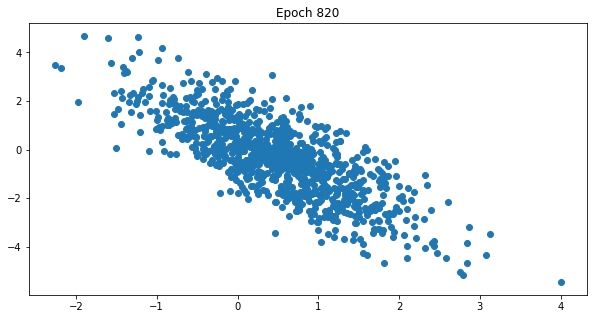

 82%|████████▏ | 821/1000 [1:01:19<13:44,  4.60s/it]

 82%|████████▏ | 822/1000 [1:01:23<13:21,  4.50s/it]

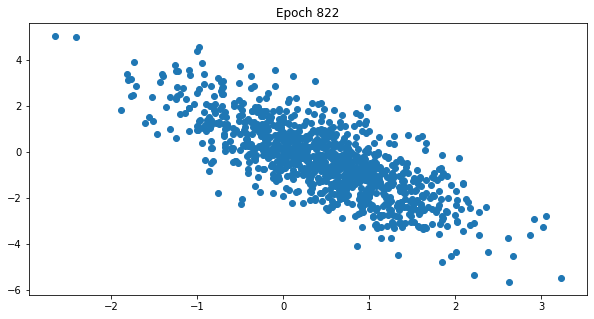

 82%|████████▏ | 823/1000 [1:01:28<13:54,  4.72s/it]

 82%|████████▏ | 824/1000 [1:01:32<13:24,  4.57s/it]

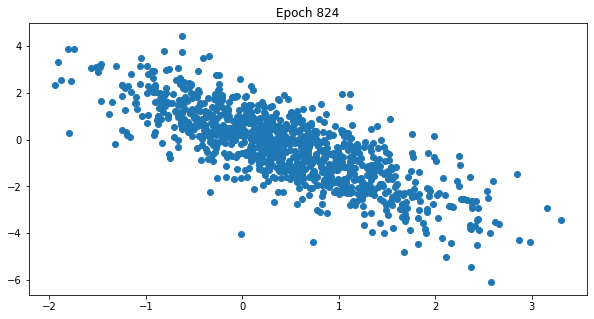

 82%|████████▎ | 825/1000 [1:01:37<13:20,  4.57s/it]

 83%|████████▎ | 826/1000 [1:01:41<13:05,  4.52s/it]

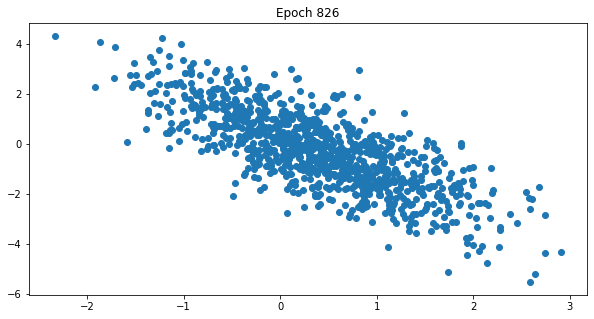

 83%|████████▎ | 827/1000 [1:01:46<13:06,  4.55s/it]

 83%|████████▎ | 828/1000 [1:01:50<12:46,  4.46s/it]

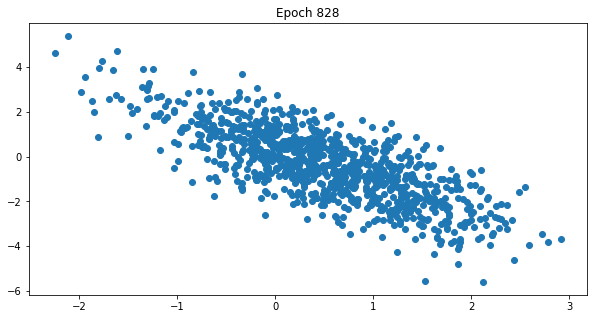

 83%|████████▎ | 829/1000 [1:01:55<12:54,  4.53s/it]

 83%|████████▎ | 830/1000 [1:01:59<12:39,  4.47s/it]

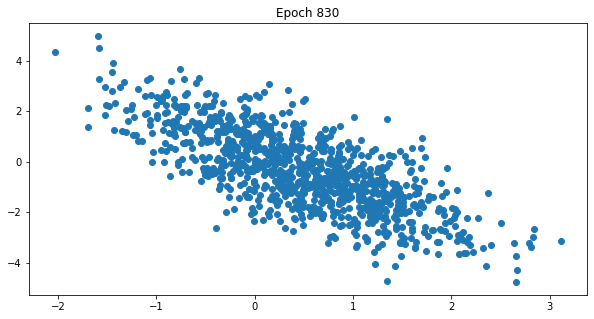

 83%|████████▎ | 831/1000 [1:02:04<13:16,  4.72s/it]

 83%|████████▎ | 832/1000 [1:02:09<12:54,  4.61s/it]

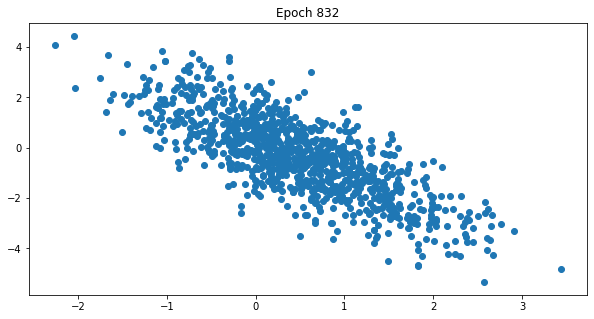

 83%|████████▎ | 833/1000 [1:02:13<12:49,  4.61s/it]

 83%|████████▎ | 834/1000 [1:02:18<12:28,  4.51s/it]

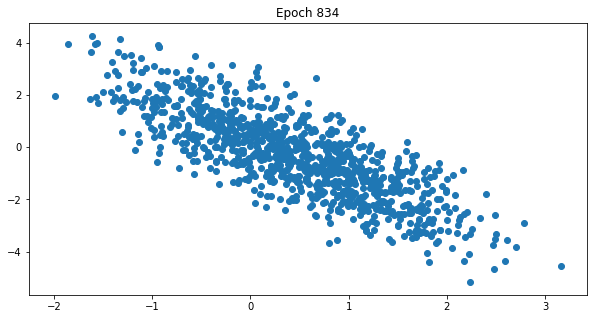

 84%|████████▎ | 835/1000 [1:02:22<12:30,  4.55s/it]

 84%|████████▎ | 836/1000 [1:02:27<12:15,  4.48s/it]

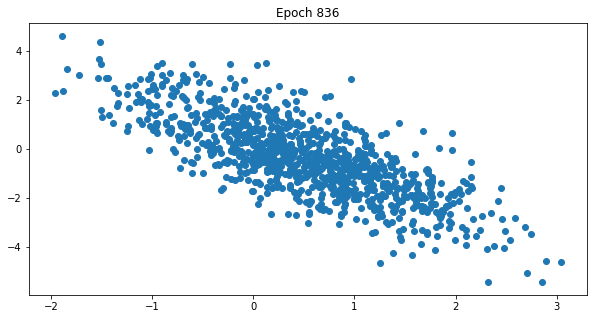

 84%|████████▎ | 837/1000 [1:02:32<12:44,  4.69s/it]

 84%|████████▍ | 838/1000 [1:02:36<12:21,  4.58s/it]

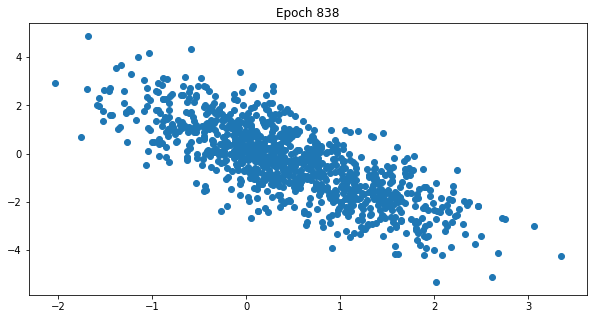

 84%|████████▍ | 839/1000 [1:02:41<12:19,  4.59s/it]

 84%|████████▍ | 840/1000 [1:02:45<12:02,  4.52s/it]

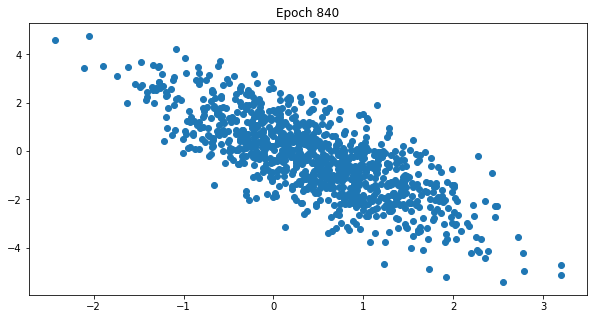

 84%|████████▍ | 841/1000 [1:02:50<12:04,  4.56s/it]

 84%|████████▍ | 842/1000 [1:02:54<11:45,  4.46s/it]

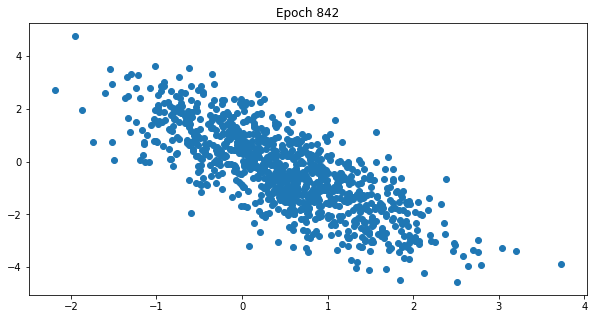

 84%|████████▍ | 843/1000 [1:02:59<11:49,  4.52s/it]

 84%|████████▍ | 844/1000 [1:03:03<11:36,  4.47s/it]

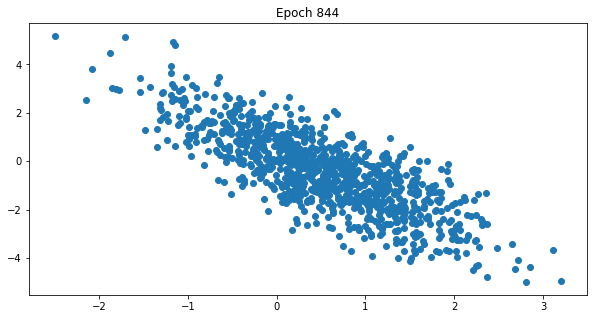

 84%|████████▍ | 845/1000 [1:03:08<11:48,  4.57s/it]

 85%|████████▍ | 846/1000 [1:03:12<11:31,  4.49s/it]

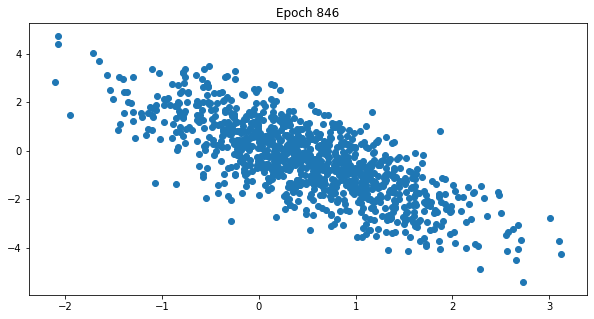

 85%|████████▍ | 847/1000 [1:03:17<11:55,  4.68s/it]

 85%|████████▍ | 848/1000 [1:03:21<11:29,  4.54s/it]

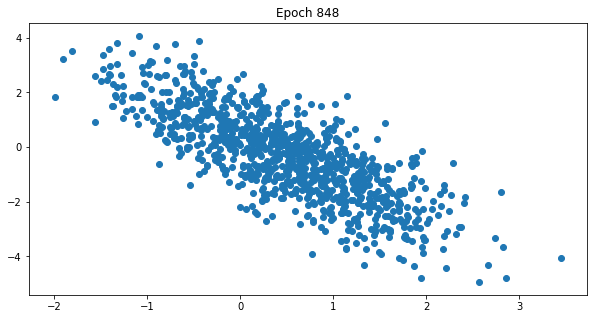

 85%|████████▍ | 849/1000 [1:03:26<11:33,  4.60s/it]

 85%|████████▌ | 850/1000 [1:03:30<11:16,  4.51s/it]

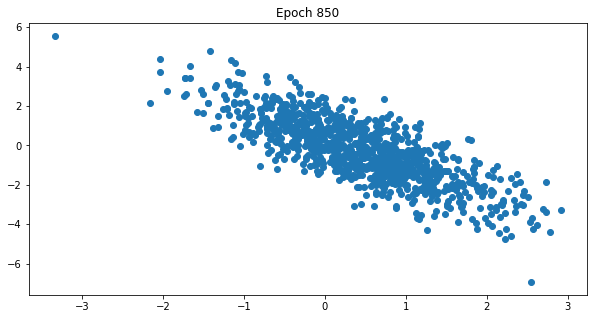

 85%|████████▌ | 851/1000 [1:03:35<11:17,  4.55s/it]

 85%|████████▌ | 852/1000 [1:03:39<11:04,  4.49s/it]

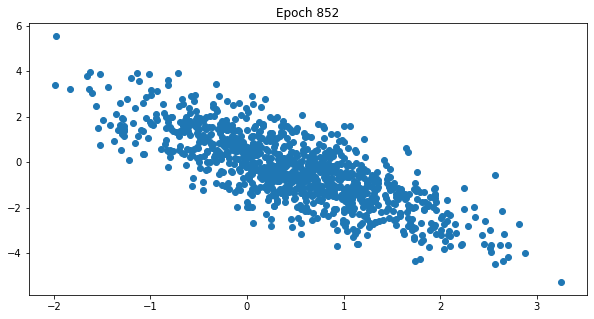

 85%|████████▌ | 853/1000 [1:03:44<11:04,  4.52s/it]

 85%|████████▌ | 854/1000 [1:03:48<10:47,  4.44s/it]

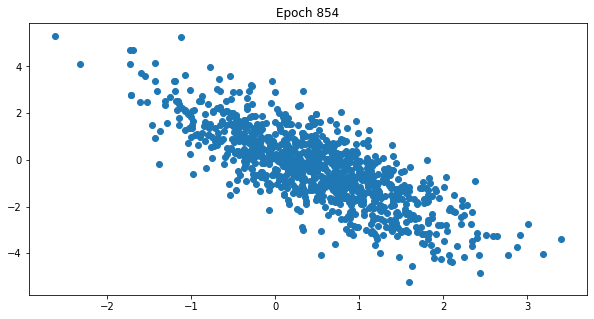

 86%|████████▌ | 855/1000 [1:03:54<11:18,  4.68s/it]

 86%|████████▌ | 856/1000 [1:03:58<11:01,  4.59s/it]

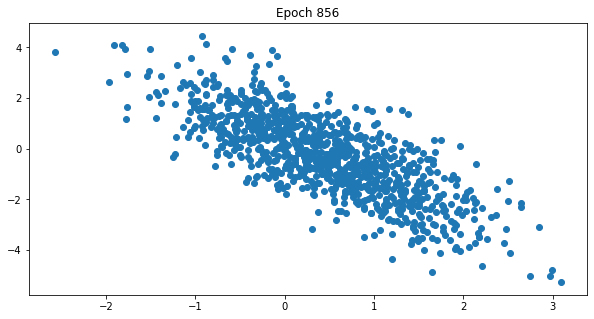

 86%|████████▌ | 857/1000 [1:04:03<10:57,  4.60s/it]

 86%|████████▌ | 858/1000 [1:04:07<10:39,  4.51s/it]

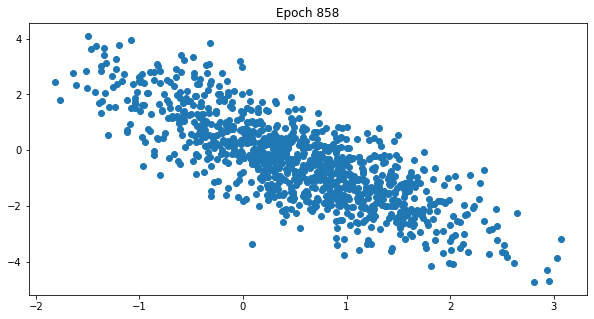

 86%|████████▌ | 859/1000 [1:04:12<10:43,  4.56s/it]

 86%|████████▌ | 860/1000 [1:04:16<10:30,  4.50s/it]

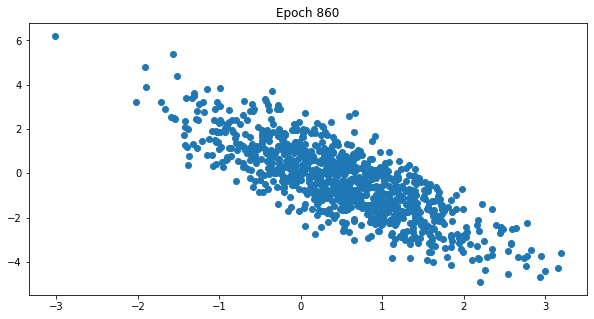

 86%|████████▌ | 861/1000 [1:04:21<10:54,  4.71s/it]

 86%|████████▌ | 862/1000 [1:04:25<10:36,  4.61s/it]

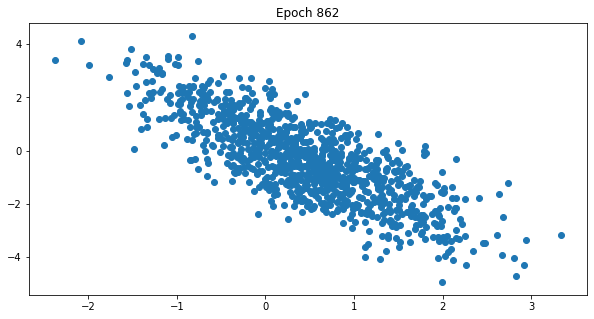

 86%|████████▋ | 863/1000 [1:04:30<10:31,  4.61s/it]

 86%|████████▋ | 864/1000 [1:04:34<10:13,  4.51s/it]

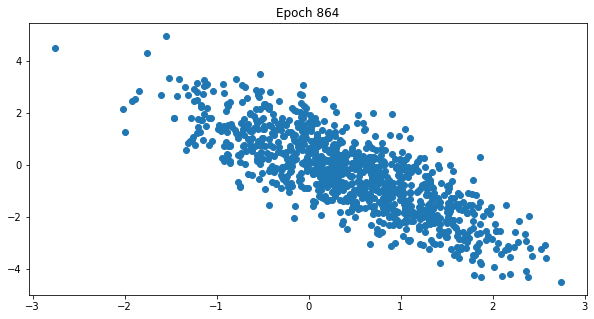

 86%|████████▋ | 865/1000 [1:04:39<10:12,  4.54s/it]

 87%|████████▋ | 866/1000 [1:04:43<09:57,  4.46s/it]

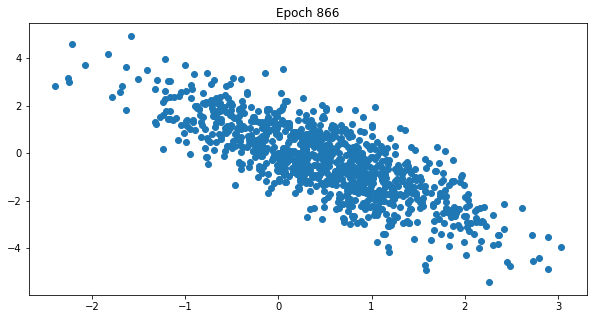

 87%|████████▋ | 867/1000 [1:04:48<09:56,  4.48s/it]

 87%|████████▋ | 868/1000 [1:04:52<09:41,  4.41s/it]

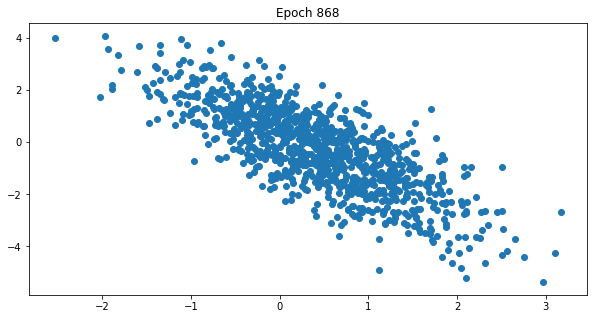

 87%|████████▋ | 869/1000 [1:04:57<09:45,  4.47s/it]

 87%|████████▋ | 870/1000 [1:05:01<09:36,  4.44s/it]

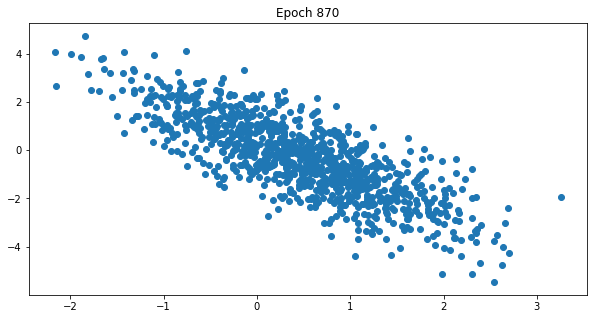

 87%|████████▋ | 871/1000 [1:05:06<09:44,  4.53s/it]

 87%|████████▋ | 872/1000 [1:05:10<09:36,  4.50s/it]

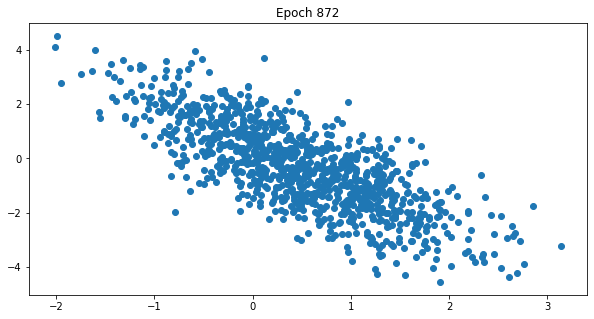

 87%|████████▋ | 873/1000 [1:05:15<09:56,  4.70s/it]

 87%|████████▋ | 874/1000 [1:05:20<09:36,  4.57s/it]

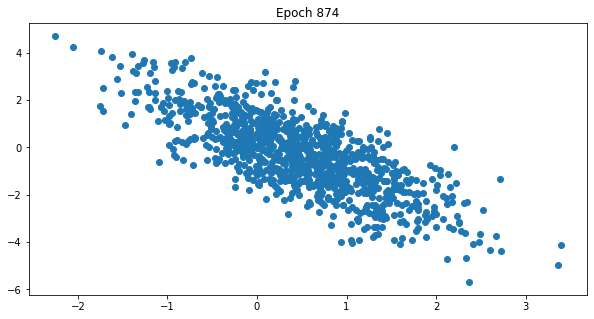

 88%|████████▊ | 875/1000 [1:05:24<09:34,  4.60s/it]

 88%|████████▊ | 876/1000 [1:05:29<09:17,  4.50s/it]

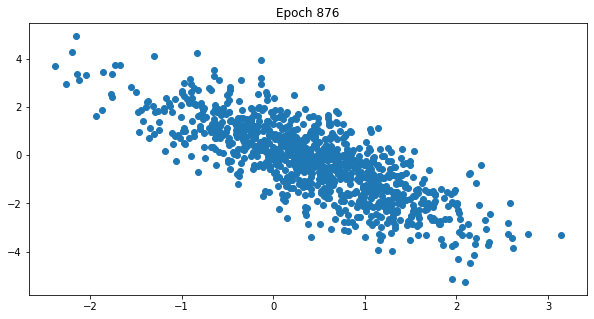

 88%|████████▊ | 877/1000 [1:05:33<09:19,  4.54s/it]

 88%|████████▊ | 878/1000 [1:05:37<09:05,  4.47s/it]

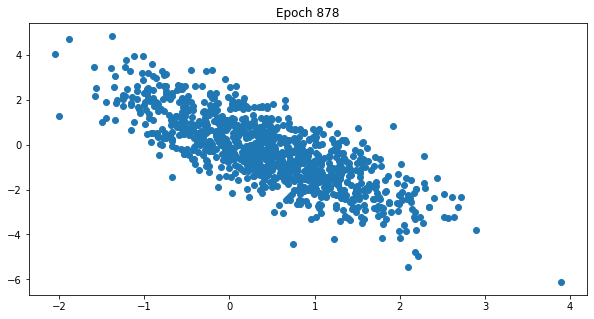

 88%|████████▊ | 879/1000 [1:05:42<09:05,  4.51s/it]

 88%|████████▊ | 880/1000 [1:05:46<08:52,  4.43s/it]

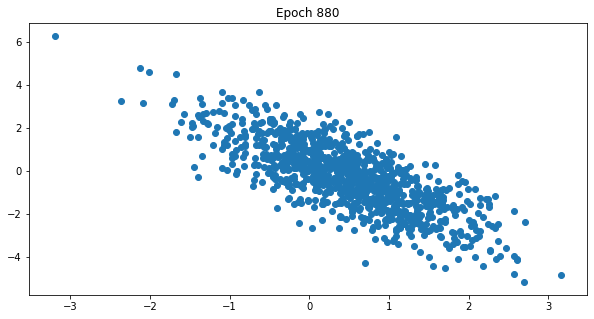

 88%|████████▊ | 881/1000 [1:05:52<09:20,  4.71s/it]

 88%|████████▊ | 882/1000 [1:05:56<09:03,  4.60s/it]

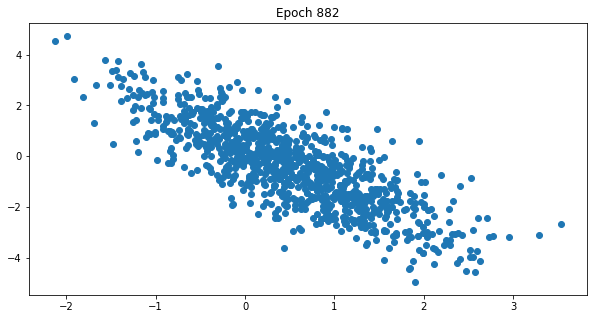

 88%|████████▊ | 883/1000 [1:06:01<08:57,  4.60s/it]

 88%|████████▊ | 884/1000 [1:06:05<08:39,  4.48s/it]

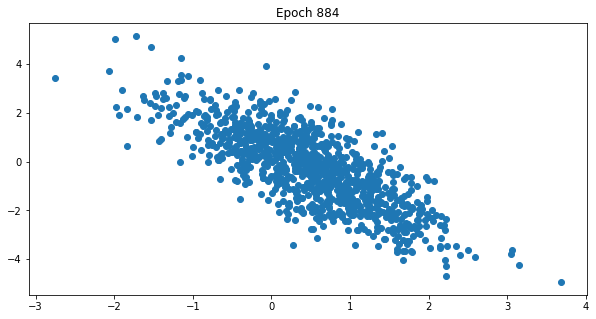

 88%|████████▊ | 885/1000 [1:06:10<08:43,  4.55s/it]

 89%|████████▊ | 886/1000 [1:06:14<08:29,  4.47s/it]

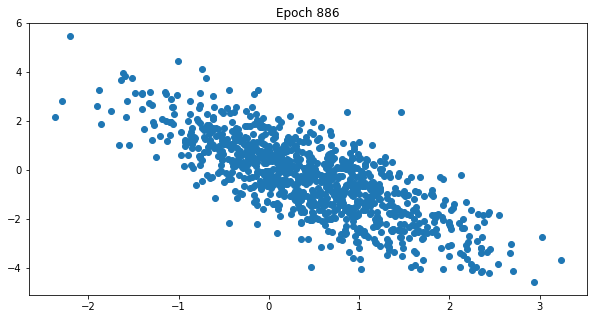

 89%|████████▊ | 887/1000 [1:06:19<08:32,  4.53s/it]

 89%|████████▉ | 888/1000 [1:06:23<08:20,  4.47s/it]

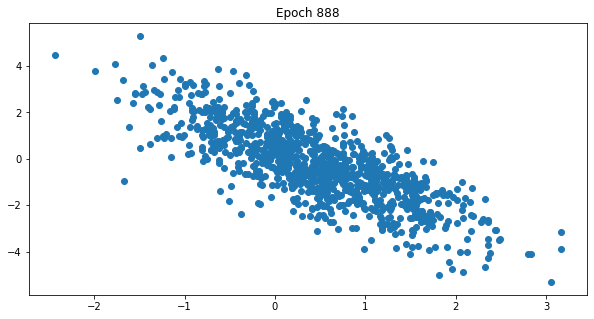

 89%|████████▉ | 889/1000 [1:06:28<08:40,  4.69s/it]

 89%|████████▉ | 890/1000 [1:06:32<08:20,  4.55s/it]

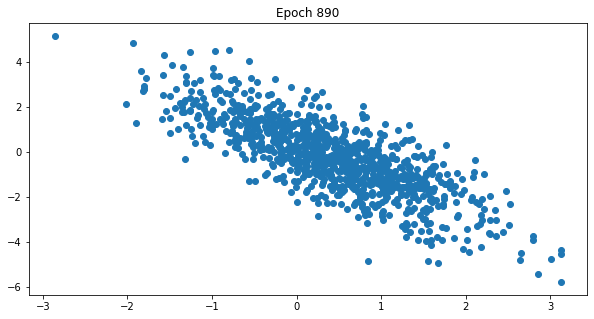

 89%|████████▉ | 891/1000 [1:06:37<08:19,  4.58s/it]

 89%|████████▉ | 892/1000 [1:06:41<08:05,  4.50s/it]

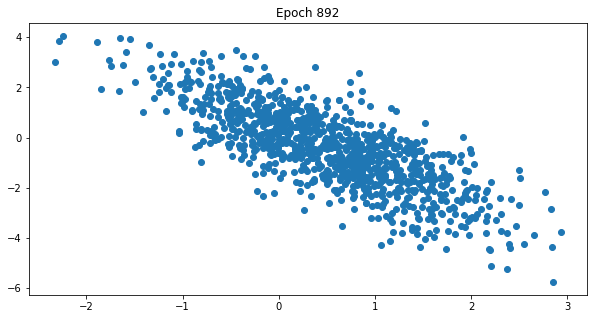

 89%|████████▉ | 893/1000 [1:06:46<08:13,  4.61s/it]

 89%|████████▉ | 894/1000 [1:06:50<07:58,  4.51s/it]

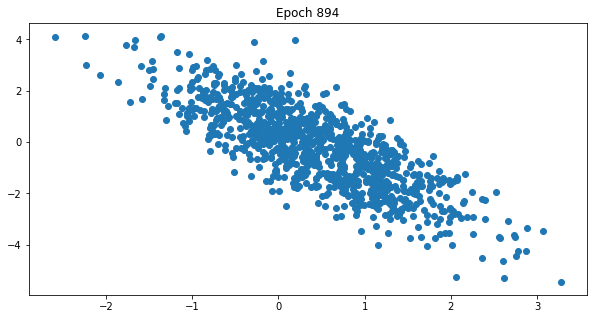

 90%|████████▉ | 895/1000 [1:06:55<07:56,  4.54s/it]

 90%|████████▉ | 896/1000 [1:06:59<07:43,  4.46s/it]

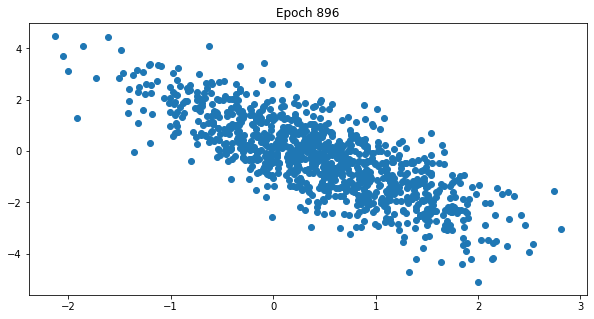

 90%|████████▉ | 897/1000 [1:07:04<07:58,  4.65s/it]

 90%|████████▉ | 898/1000 [1:07:09<07:45,  4.57s/it]

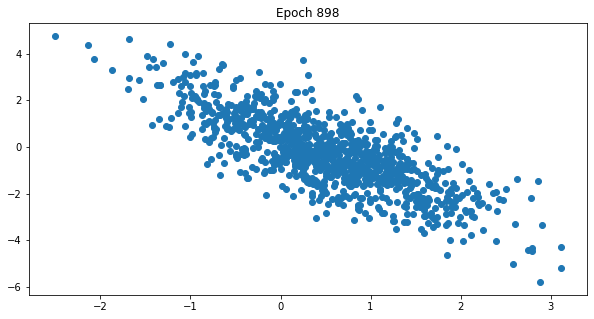

 90%|████████▉ | 899/1000 [1:07:13<07:44,  4.60s/it]

 90%|█████████ | 900/1000 [1:07:18<07:28,  4.48s/it]

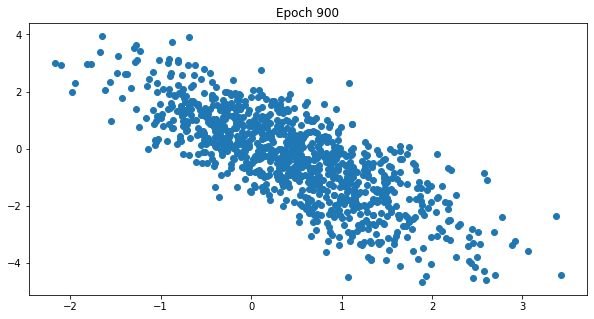

 90%|█████████ | 901/1000 [1:07:22<07:26,  4.51s/it]

 90%|█████████ | 902/1000 [1:07:27<07:17,  4.47s/it]

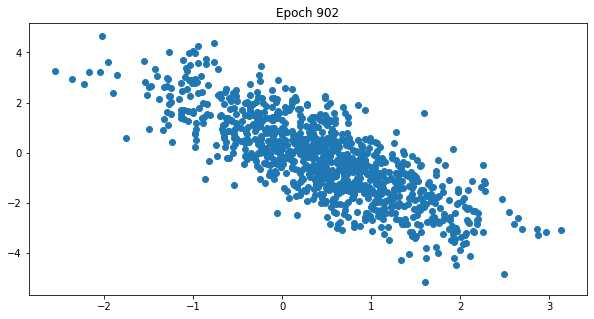

 90%|█████████ | 903/1000 [1:07:31<07:19,  4.53s/it]

 90%|█████████ | 904/1000 [1:07:36<07:08,  4.47s/it]

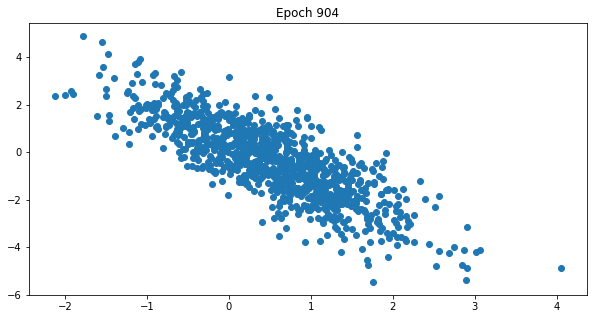

 90%|█████████ | 905/1000 [1:07:40<07:11,  4.54s/it]

 91%|█████████ | 906/1000 [1:07:45<07:01,  4.49s/it]

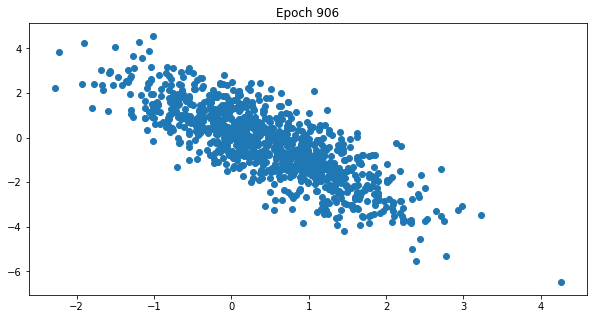

 91%|█████████ | 907/1000 [1:07:50<07:11,  4.64s/it]

 91%|█████████ | 908/1000 [1:07:54<06:56,  4.53s/it]

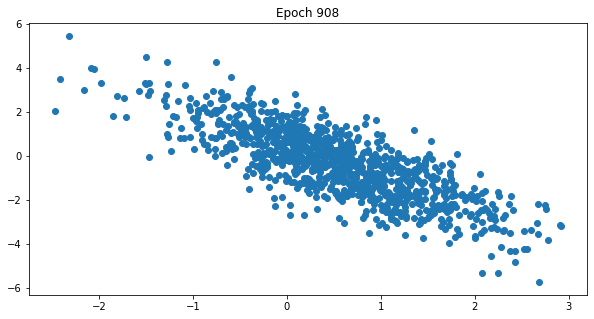

 91%|█████████ | 909/1000 [1:07:59<06:57,  4.58s/it]

 91%|█████████ | 910/1000 [1:08:03<06:41,  4.46s/it]

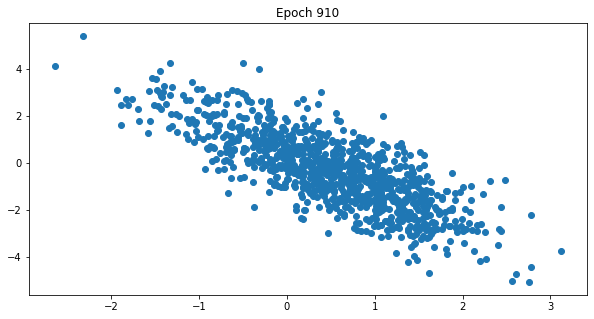

 91%|█████████ | 911/1000 [1:08:07<06:42,  4.52s/it]

 91%|█████████ | 912/1000 [1:08:12<06:34,  4.48s/it]

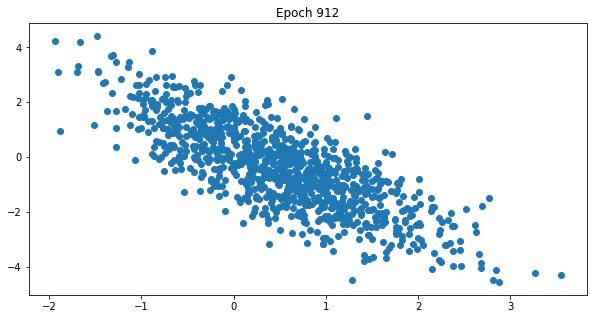

 91%|█████████▏| 913/1000 [1:08:17<06:35,  4.54s/it]

 91%|█████████▏| 914/1000 [1:08:21<06:24,  4.47s/it]

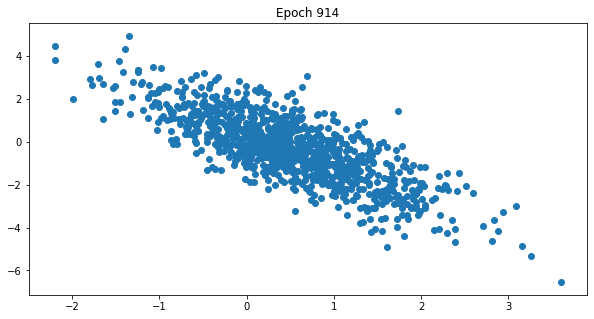

 92%|█████████▏| 915/1000 [1:08:26<06:39,  4.70s/it]

 92%|█████████▏| 916/1000 [1:08:30<06:21,  4.54s/it]

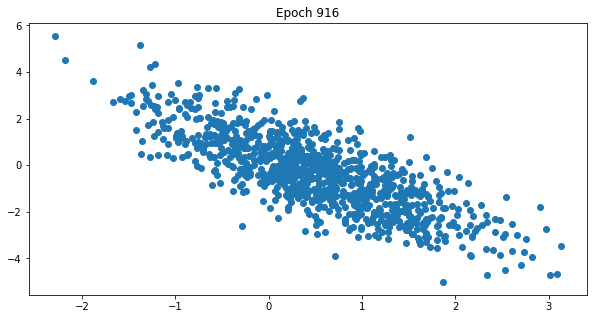

 92%|█████████▏| 917/1000 [1:08:35<06:20,  4.58s/it]

 92%|█████████▏| 918/1000 [1:08:39<06:10,  4.52s/it]

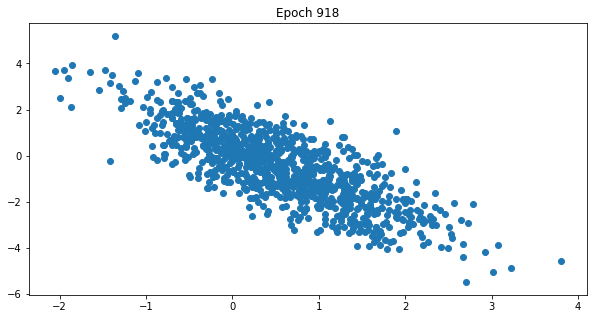

 92%|█████████▏| 919/1000 [1:08:44<06:09,  4.56s/it]

 92%|█████████▏| 920/1000 [1:08:48<06:00,  4.50s/it]

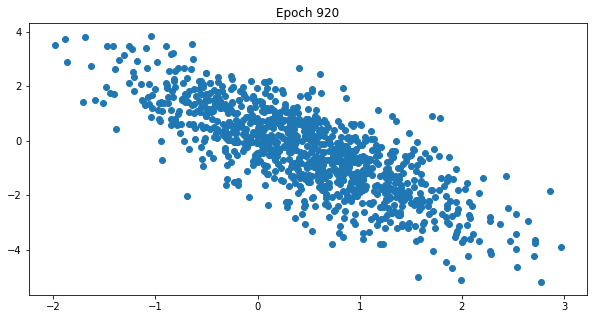

 92%|█████████▏| 921/1000 [1:08:53<05:59,  4.55s/it]

 92%|█████████▏| 922/1000 [1:08:57<05:49,  4.48s/it]

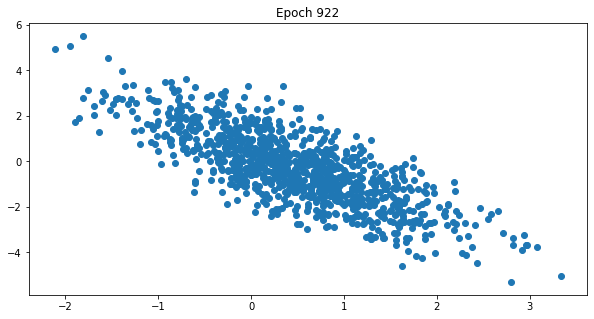

 92%|█████████▏| 923/1000 [1:09:02<05:59,  4.66s/it]

 92%|█████████▏| 924/1000 [1:09:07<05:46,  4.56s/it]

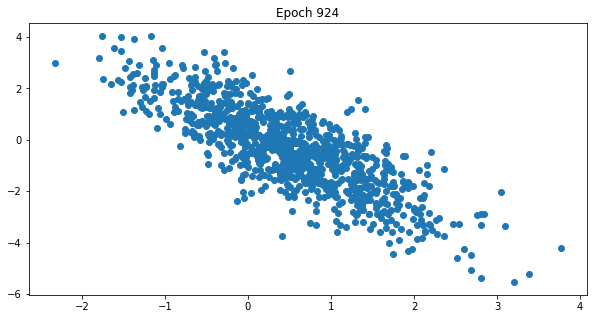

 92%|█████████▎| 925/1000 [1:09:11<05:46,  4.61s/it]

 93%|█████████▎| 926/1000 [1:09:16<05:34,  4.52s/it]

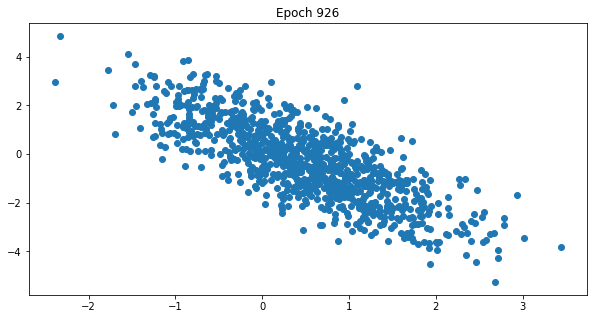

 93%|█████████▎| 927/1000 [1:09:21<05:47,  4.75s/it]

 93%|█████████▎| 928/1000 [1:09:25<05:31,  4.60s/it]

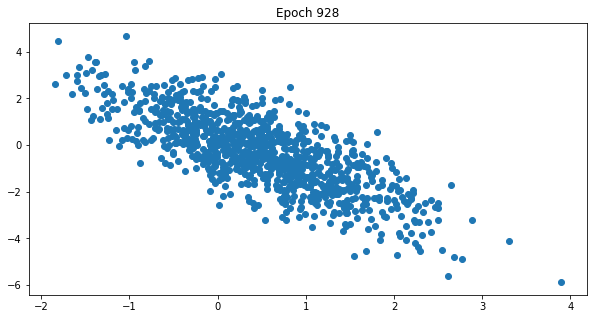

 93%|█████████▎| 929/1000 [1:09:30<05:27,  4.61s/it]

 93%|█████████▎| 930/1000 [1:09:34<05:15,  4.51s/it]

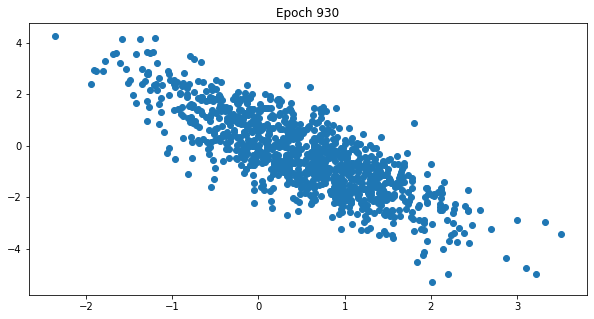

 93%|█████████▎| 931/1000 [1:09:39<05:13,  4.55s/it]

 93%|█████████▎| 932/1000 [1:09:43<05:03,  4.47s/it]

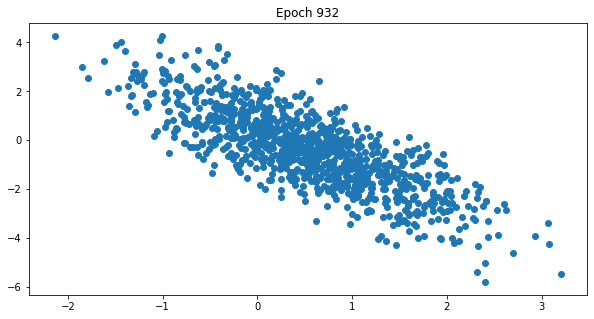

 93%|█████████▎| 933/1000 [1:09:48<05:03,  4.53s/it]

 93%|█████████▎| 934/1000 [1:09:52<04:53,  4.44s/it]

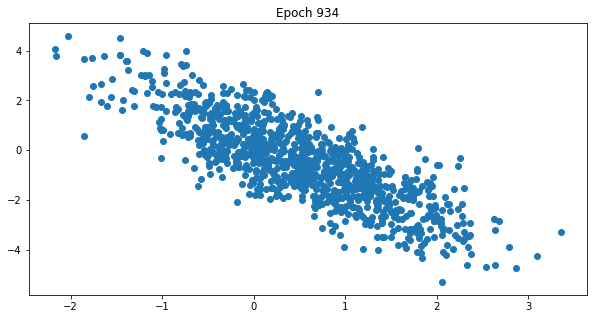

 94%|█████████▎| 935/1000 [1:09:57<04:53,  4.52s/it]

 94%|█████████▎| 936/1000 [1:10:01<04:43,  4.44s/it]

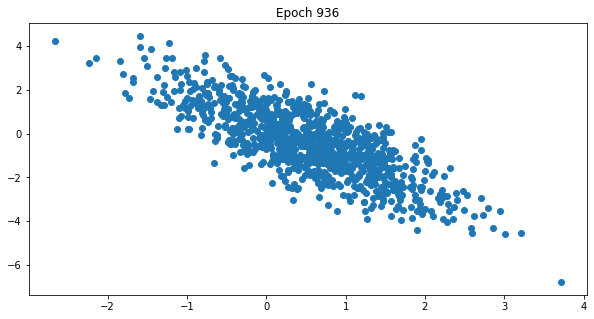

 94%|█████████▎| 937/1000 [1:10:06<04:42,  4.49s/it]

 94%|█████████▍| 938/1000 [1:10:10<04:33,  4.41s/it]

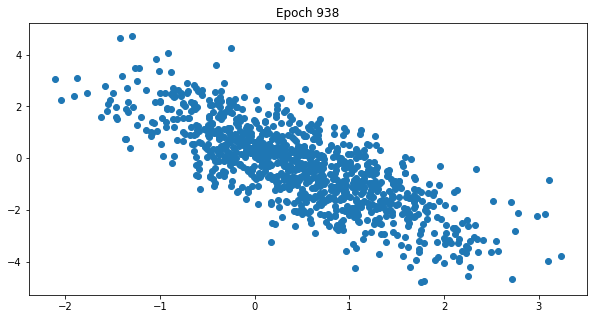

 94%|█████████▍| 939/1000 [1:10:14<04:34,  4.49s/it]

 94%|█████████▍| 940/1000 [1:10:19<04:26,  4.44s/it]

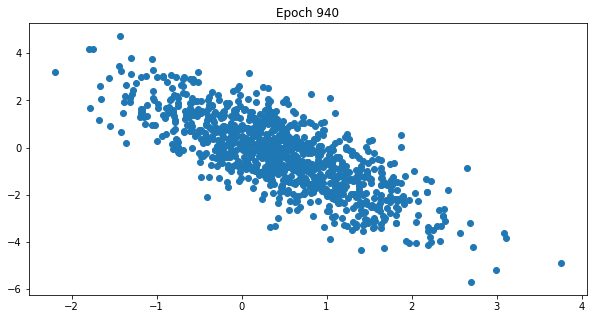

 94%|█████████▍| 941/1000 [1:10:24<04:28,  4.55s/it]

 94%|█████████▍| 942/1000 [1:10:28<04:20,  4.49s/it]

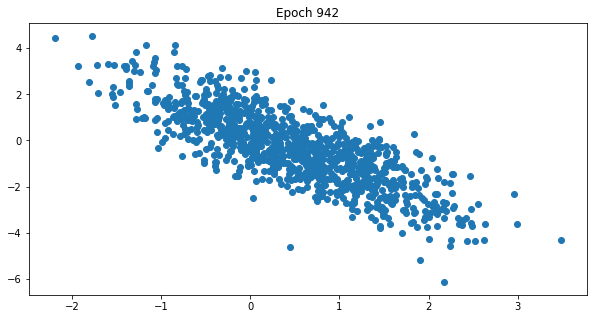

 94%|█████████▍| 943/1000 [1:10:33<04:27,  4.70s/it]

 94%|█████████▍| 944/1000 [1:10:37<04:16,  4.58s/it]

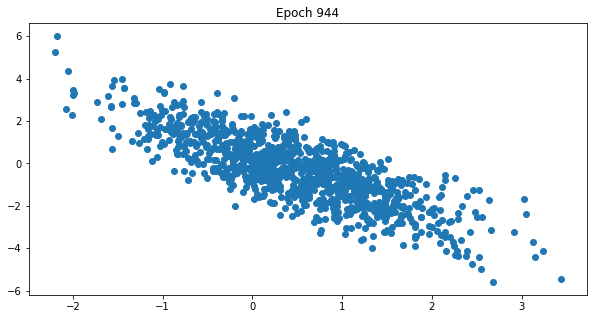

 94%|█████████▍| 945/1000 [1:10:42<04:12,  4.60s/it]

 95%|█████████▍| 946/1000 [1:10:47<04:05,  4.55s/it]

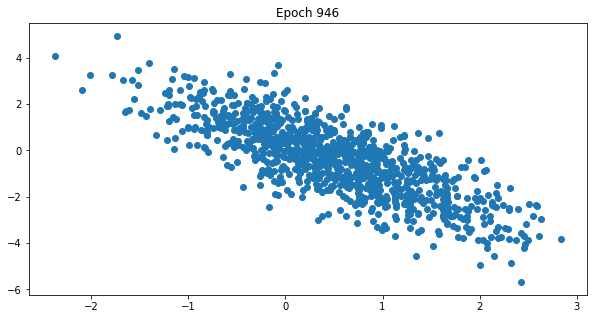

 95%|█████████▍| 947/1000 [1:10:51<04:02,  4.58s/it]

 95%|█████████▍| 948/1000 [1:10:55<03:53,  4.50s/it]

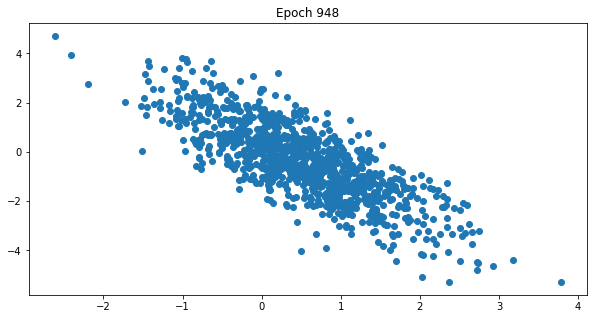

 95%|█████████▍| 949/1000 [1:11:01<03:59,  4.69s/it]

 95%|█████████▌| 950/1000 [1:11:05<03:47,  4.55s/it]

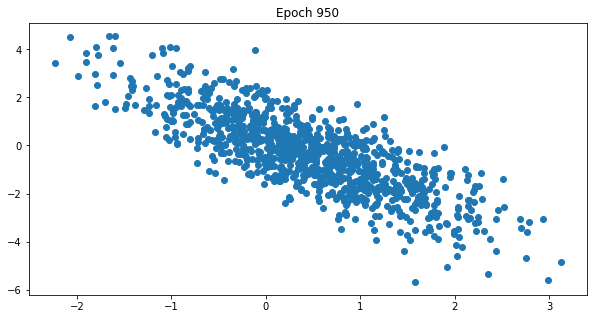

 95%|█████████▌| 951/1000 [1:11:09<03:43,  4.57s/it]

 95%|█████████▌| 952/1000 [1:11:14<03:34,  4.48s/it]

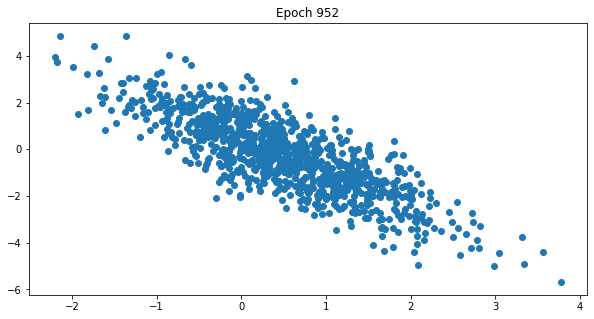

 95%|█████████▌| 953/1000 [1:11:18<03:31,  4.49s/it]

 95%|█████████▌| 954/1000 [1:11:22<03:23,  4.41s/it]

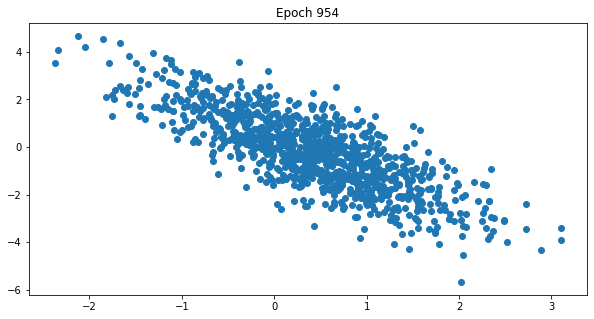

 96%|█████████▌| 955/1000 [1:11:27<03:20,  4.45s/it]

 96%|█████████▌| 956/1000 [1:11:31<03:13,  4.40s/it]

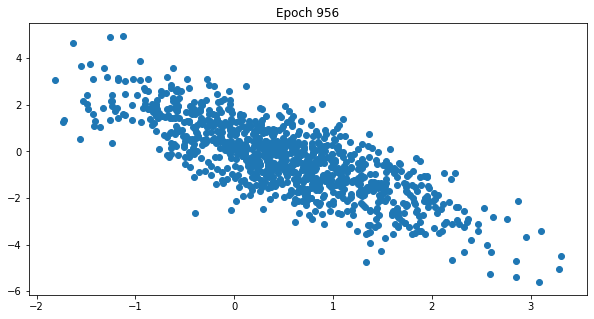

 96%|█████████▌| 957/1000 [1:11:36<03:12,  4.47s/it]

 96%|█████████▌| 958/1000 [1:11:40<03:05,  4.41s/it]

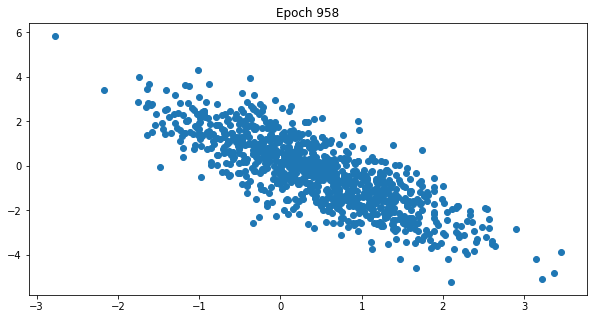

 96%|█████████▌| 959/1000 [1:11:45<03:03,  4.47s/it]

 96%|█████████▌| 960/1000 [1:11:49<02:57,  4.44s/it]

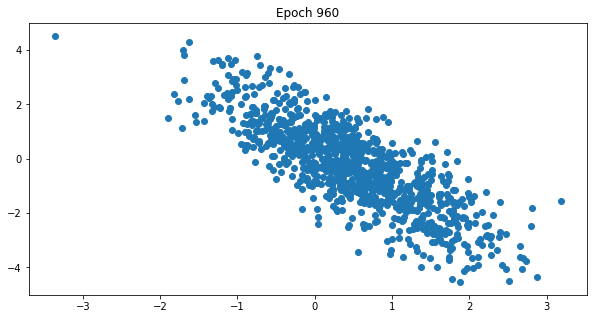

 96%|█████████▌| 961/1000 [1:11:54<03:01,  4.66s/it]

 96%|█████████▌| 962/1000 [1:11:59<02:53,  4.57s/it]

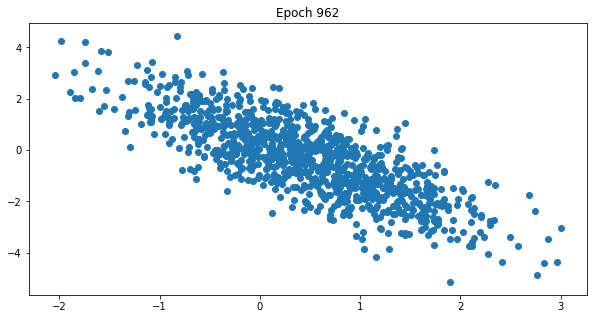

 96%|█████████▋| 963/1000 [1:12:03<02:49,  4.59s/it]

 96%|█████████▋| 964/1000 [1:12:08<02:42,  4.52s/it]

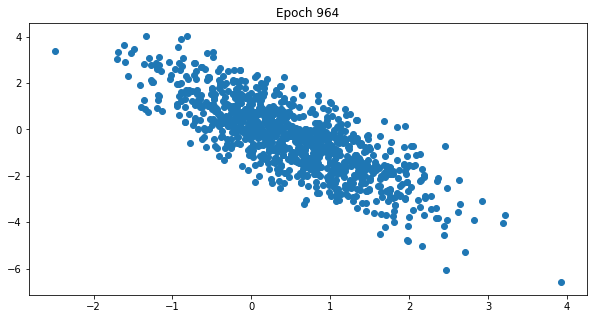

 96%|█████████▋| 965/1000 [1:12:12<02:39,  4.56s/it]

 97%|█████████▋| 966/1000 [1:12:17<02:31,  4.46s/it]

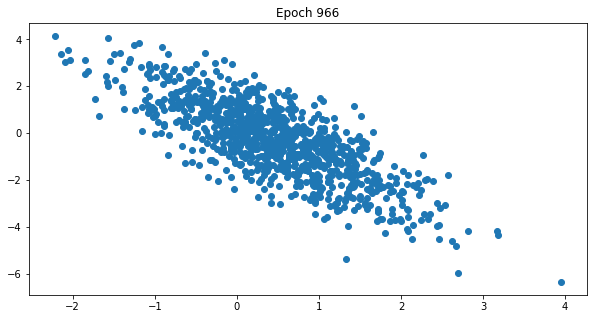

 97%|█████████▋| 967/1000 [1:12:21<02:27,  4.48s/it]

 97%|█████████▋| 968/1000 [1:12:25<02:21,  4.42s/it]

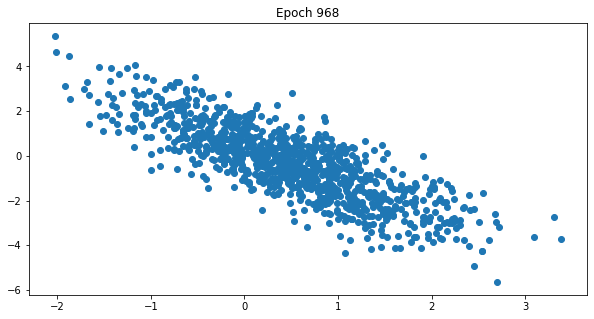

 97%|█████████▋| 969/1000 [1:12:30<02:19,  4.49s/it]

 97%|█████████▋| 970/1000 [1:12:34<02:13,  4.43s/it]

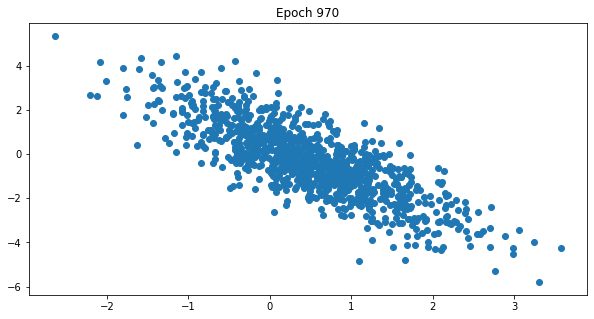

 97%|█████████▋| 971/1000 [1:12:40<02:15,  4.67s/it]

 97%|█████████▋| 972/1000 [1:12:44<02:08,  4.58s/it]

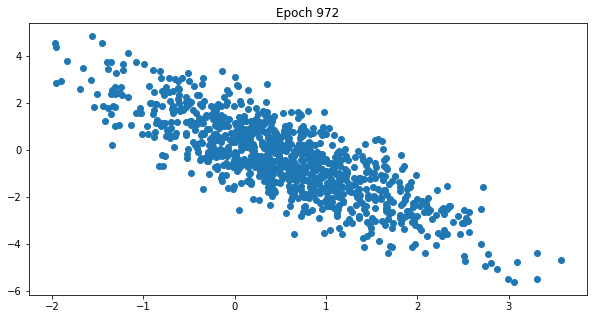

 97%|█████████▋| 973/1000 [1:12:49<02:05,  4.64s/it]

 97%|█████████▋| 974/1000 [1:12:53<01:58,  4.57s/it]

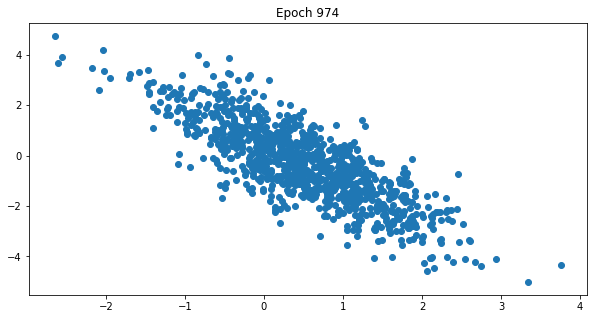

 98%|█████████▊| 975/1000 [1:12:58<01:57,  4.71s/it]

 98%|█████████▊| 976/1000 [1:13:02<01:50,  4.58s/it]

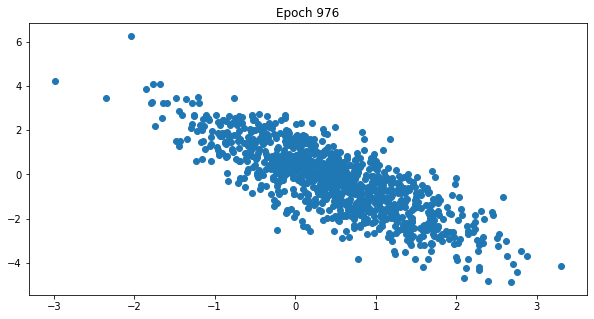

 98%|█████████▊| 977/1000 [1:13:07<01:45,  4.61s/it]

 98%|█████████▊| 978/1000 [1:13:11<01:39,  4.51s/it]

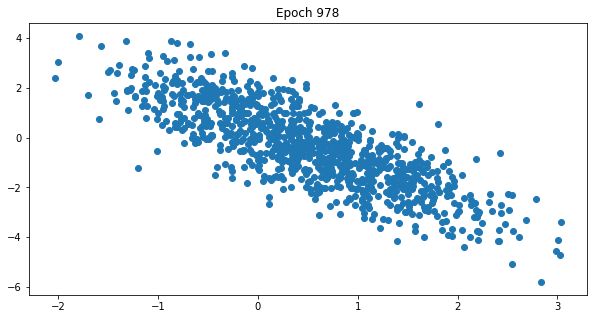

 98%|█████████▊| 979/1000 [1:13:16<01:35,  4.55s/it]

 98%|█████████▊| 980/1000 [1:13:20<01:29,  4.49s/it]

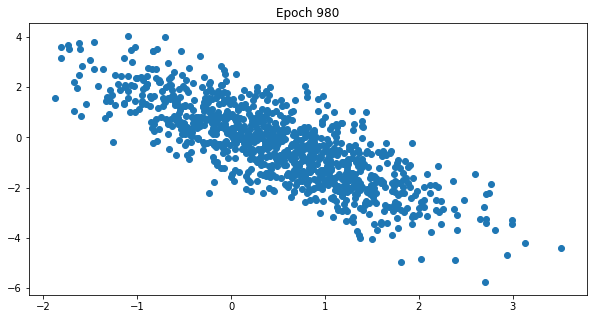

 98%|█████████▊| 981/1000 [1:13:25<01:26,  4.54s/it]

 98%|█████████▊| 982/1000 [1:13:29<01:20,  4.46s/it]

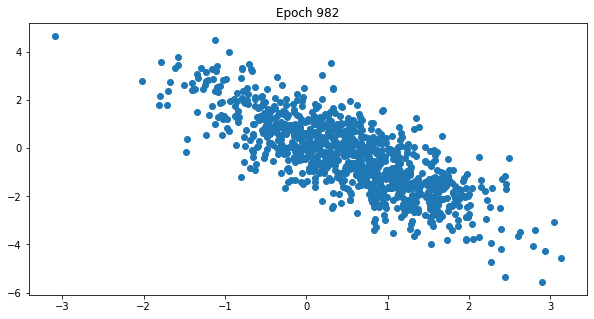

 98%|█████████▊| 983/1000 [1:13:34<01:16,  4.49s/it]

 98%|█████████▊| 984/1000 [1:13:38<01:10,  4.42s/it]

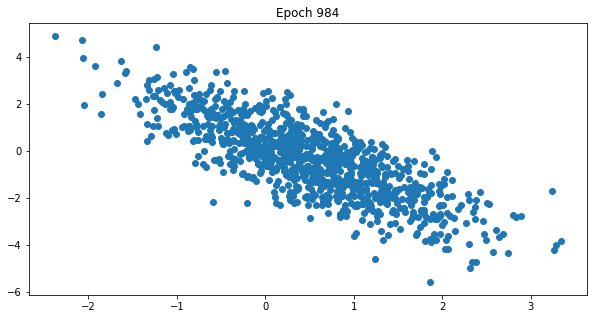

 98%|█████████▊| 985/1000 [1:13:43<01:07,  4.51s/it]

 99%|█████████▊| 986/1000 [1:13:47<01:01,  4.42s/it]

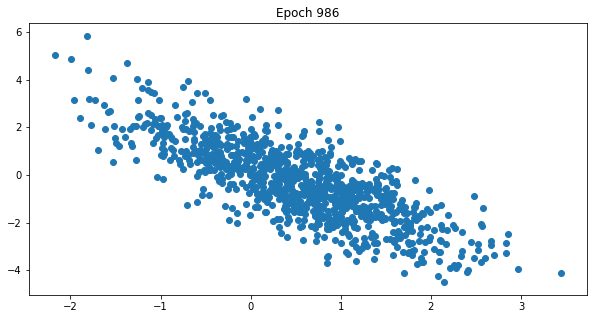

 99%|█████████▊| 987/1000 [1:13:52<00:58,  4.49s/it]

 99%|█████████▉| 988/1000 [1:13:56<00:53,  4.43s/it]

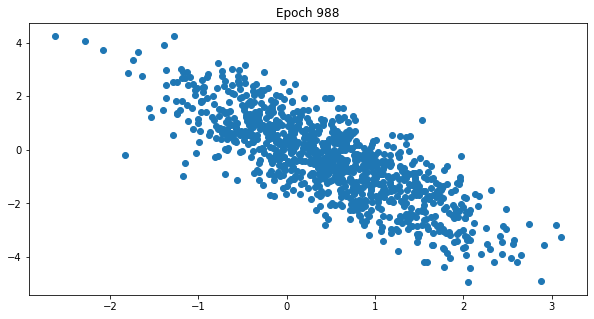

 99%|█████████▉| 989/1000 [1:14:01<00:50,  4.56s/it]

 99%|█████████▉| 990/1000 [1:14:05<00:44,  4.48s/it]

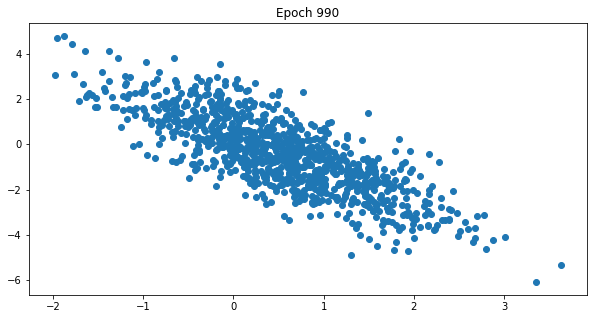

 99%|█████████▉| 991/1000 [1:14:10<00:41,  4.60s/it]

 99%|█████████▉| 992/1000 [1:14:14<00:36,  4.51s/it]

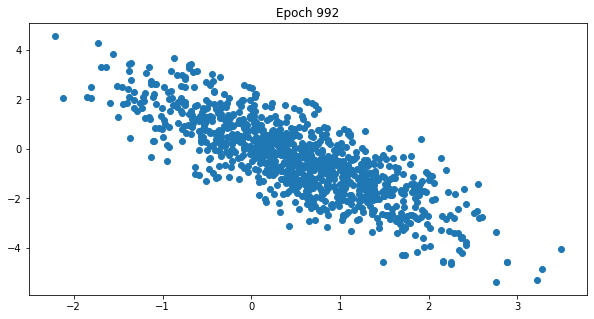

 99%|█████████▉| 993/1000 [1:14:19<00:32,  4.59s/it]

 99%|█████████▉| 994/1000 [1:14:23<00:27,  4.51s/it]

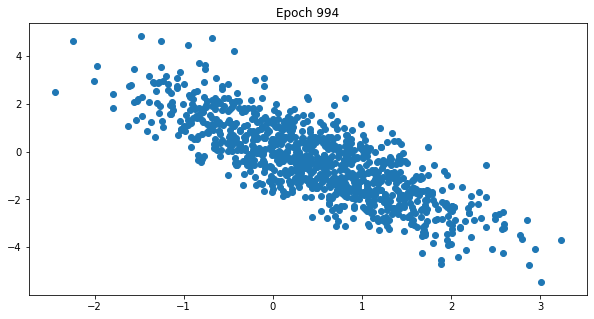

100%|█████████▉| 995/1000 [1:14:29<00:23,  4.68s/it]

100%|█████████▉| 996/1000 [1:14:33<00:18,  4.56s/it]

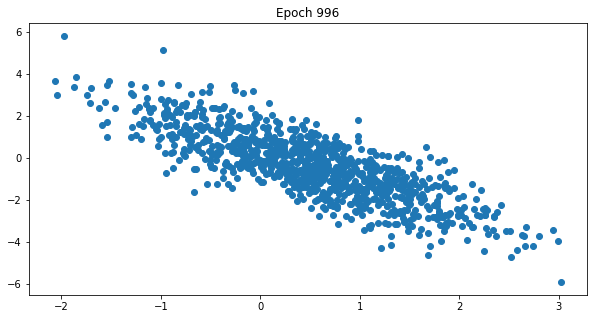

100%|█████████▉| 997/1000 [1:14:37<00:13,  4.60s/it]

100%|█████████▉| 998/1000 [1:14:42<00:09,  4.51s/it]

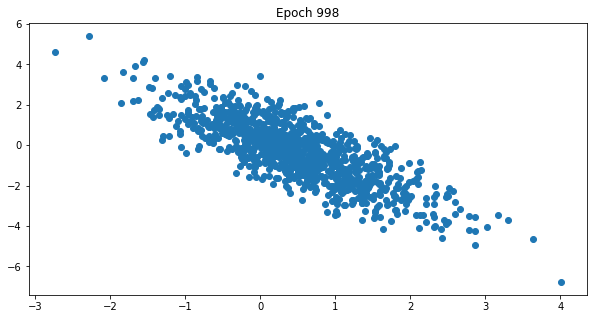

100%|█████████▉| 999/1000 [1:14:46<00:04,  4.55s/it]

100%|██████████| 1000/1000 [1:14:51<00:00,  4.49s/it]


In [12]:
plt.figure(figsize=(10, 5))
plt.subplot(2, 1, 1)
plt.title('Prior Moons')
prior_sample = prior.sample(torch.Size([1000])).cpu()
plt.scatter(prior_sample[:, 0], prior_sample[:, 1])
experiment.log_figure('Prior Moons')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(2, 1, 2)
plt.title('Target Moons')
plt.scatter(moons_x[:, 0], moons_x[:, 1], c=moons_y)
experiment.log_figure('Target Moons')
plt.show()


for epoch in tqdm(range(1000), position=0, leave=True):
    model.train()
    for batch_ind, batch in tqdm_notebook(enumerate(dataloader), total=len(dataloader), leave=False):
        step = epoch * len(dataloader) + batch_ind

        x = batch[0].to(device)
        zs, prior_logprob, log_det = model(x)
        logprob = prior_logprob + log_det
        loss = -torch.sum(logprob)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        experiment.log_metric(f'loss', loss.item(), step=step)
    if epoch % 2 == 0:
        model.eval()
        sampled = model.sample(1000)[-1].cpu().detach()
        plt.figure(figsize=(10, 5))
        plt.title(f'Epoch {epoch}')
        plt.scatter(sampled[:, 0], sampled[:, 1])
        experiment.log_figure(f'Epoch {epoch}')
        plt.show()

    

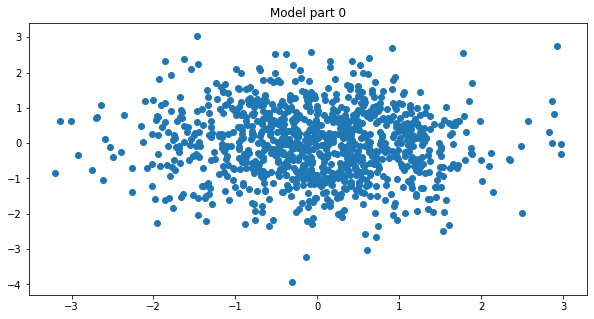

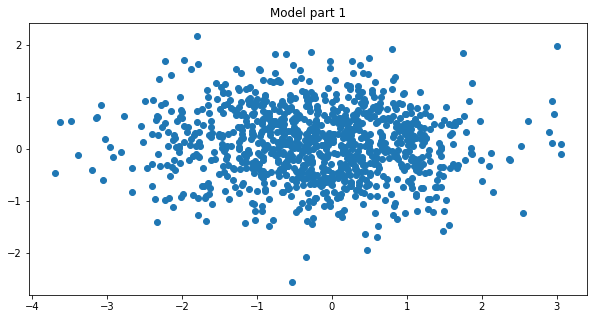

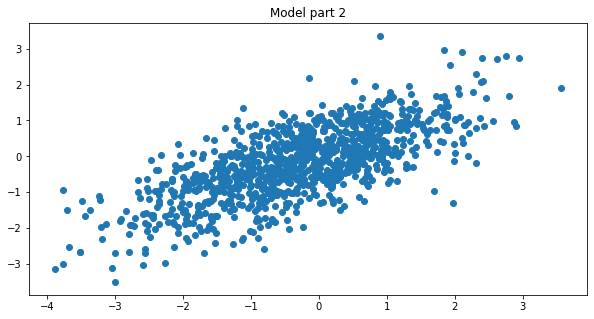

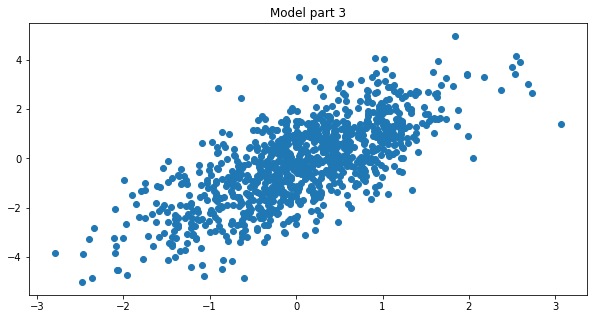

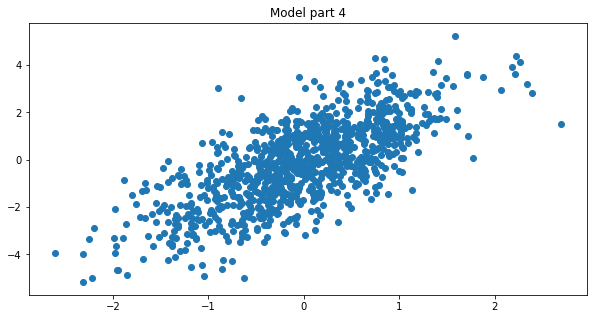

...

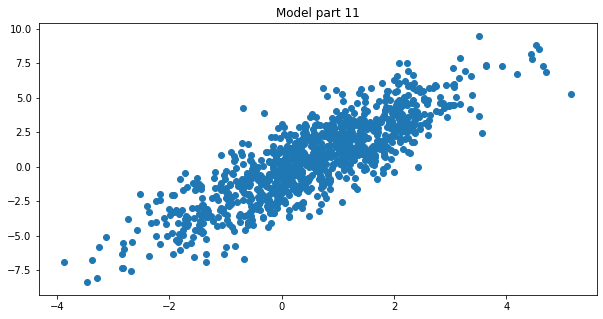

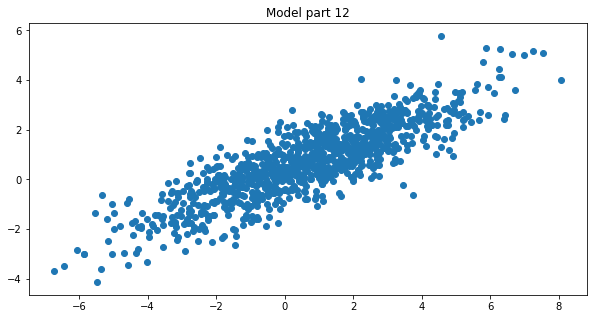

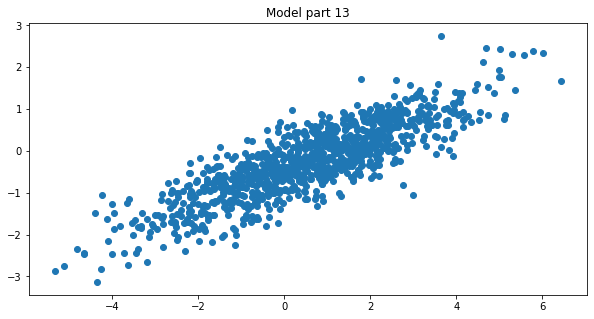

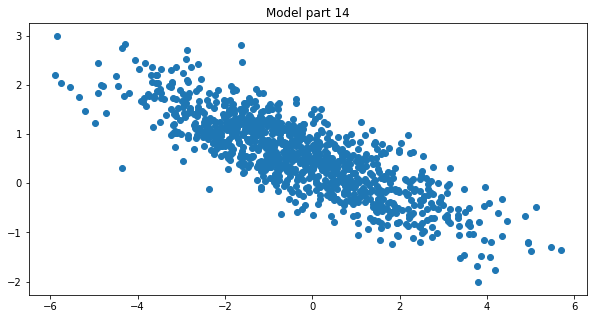

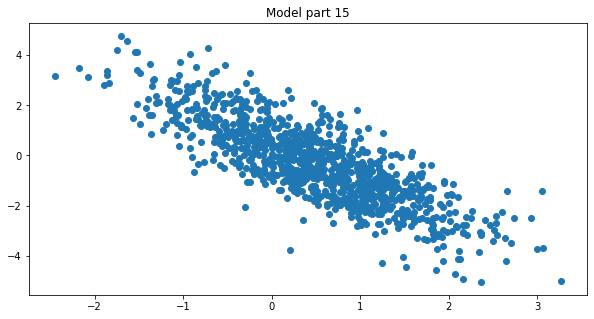

In [14]:
model.eval()
sampled_ = model.sample(1000)
for i in range(len(sampled_)):
    sampled = sampled_[i].cpu().detach()
    plt.figure(figsize=(10, 5))
    plt.title(f'Model part {i}')
    plt.scatter(sampled[:, 0], sampled[:, 1])
    plt.show()
